## pytorch version for this setup
conda activate ofa
conda install pytorch torchvision torchaudio cudatoolkit=10.2 -c pytorch

In [1]:
! pwd
! ls 

/home/barzamini/ofa
Bert_caption.ipynb	OFA.bk
bkk_100.csv		ofa_caption.ipynb
caption_files		ofa_caption_train.ipynb
city_person.csv		ped_auto_model_city_person
cookies.txt		pre_train-1.ipynb
data_prepare.ipynb	pre_train-Copy1.ipynb
detection_examples.tsv	pretrain_data_examples.zip
euro_city.csv		pre_train.ipynb
fairseq			stage1_checkpoints
fairseq.bk		stage1_logs
image_examples.tsv	temp.jpg
image_gen.ipynb		text_examples.tsv
index.html		vision_language_examples.tsv
negative_sample		WIT_caption.ipynb
OFA


In [2]:
! wget https://ofa-beijing.oss-cn-beijing.aliyuncs.com/checkpoints/ofa_large.pt

--2022-04-30 13:51:33--  https://ofa-beijing.oss-cn-beijing.aliyuncs.com/checkpoints/ofa_large.pt
Resolving ofa-beijing.oss-cn-beijing.aliyuncs.com (ofa-beijing.oss-cn-beijing.aliyuncs.com)... 59.110.190.134
Connecting to ofa-beijing.oss-cn-beijing.aliyuncs.com (ofa-beijing.oss-cn-beijing.aliyuncs.com)|59.110.190.134|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6231039997 (5.8G) [application/octet-stream]
Saving to: ‘ofa_large.pt’

ofa_large.pt        100%[===================>]   5.80G  5.17MB/s    in 11m 50s 

2022-04-30 14:03:25 (8.37 MB/s) - ‘ofa_large.pt’ saved [6231039997/6231039997]



In [4]:
! mv ofa_large.pt OFA/checkpoints/ofa_large.pt

In [2]:
from platform import python_version

print(python_version())

3.7.13


In [1]:
! ls OFA/checkpoints/
# ! pwd
# !ls

caption.pt  ofa_base.pt  ofa_large.pt


In [2]:
data_dir = '/raid/AISSEL/Hamed/datasets/caption_data'


In [3]:
! ls OFA/run_scripts/caption/train_caption_stage1.sh

OFA/run_scripts/caption/train_caption_stage1.sh


In [4]:
! ls

Bert_caption.ipynb		      OFA
bkk_100.csv			      ofa_caption.ipynb
caption_files			      ofa_caption_train.ipynb
city_person.csv			      ped_auto_model_city_person
convert2b64.ipynb		      pedestrian_datasets_ecp.ipynb
cookies.txt			      pre_train-1.ipynb
detection_examples.tsv		      pretrain_data_examples.zip
euro_city.csv			      stage1_checkpoints
google_results_2_csv.ipynb	      stage1_logs
google_search_images_inference.ipynb  temp.jpg
image_examples.tsv		      test.jpg
image_gen.ipynb			      text_examples.tsv
index.html			      vision_language_examples.tsv
negative_sample			      WIT_caption.ipynb


In [6]:
%pycat OFA/run_scripts/caption/log1.txt

In [5]:
%pycat OFA/run_scripts/caption/train_caption_stage1.sh

In [ ]:
# base
%%writefile OFA/run_scripts/caption/train_caption_stage1_base.sh
#!/usr/bin/env

# The port for communication. Note that if you want to run multiple tasks on the same machine,
# you need to specify different port numbers.
export MASTER_PORT=1061

log_dir=./stage1_logs
save_dir=./stage1_checkpoints
mkdir -p $log_dir $save_dir

bpe_dir=../../utils/BPE
user_dir=../../ofa_module

# data_dir=../../dataset/caption_data
data_dir=/raid/AISSEL/Hamed/datasets/caption_data
data=${data_dir}/caption_stage1_train.tsv,${data_dir}/caption_val.tsv
# restore_file=../../checkpoints/ofa_base.pt
restore_file=../../checkpoints/caption_base_best.pt
selected_cols=0,4,2

task=caption
arch=ofa_base
criterion=adjust_label_smoothed_cross_entropy
label_smoothing=0.1
lr=1e-5
max_epoch=5
warmup_ratio=0.06
# batch_size=8
# update_freq=4
batch_size=4
update_freq=8
resnet_drop_path_rate=0.0
encoder_drop_path_rate=0.1
decoder_drop_path_rate=0.1
dropout=0.1
attention_dropout=0.0
max_src_length=80
max_tgt_length=20
num_bins=1000
patch_image_size=480
eval_cider_cached=${data_dir}/cider_cached_tokens/coco-valid-words.p
drop_worst_ratio=0.2

for max_epoch in {10,}; do
  echo "max_epoch "${max_epoch}
  for warmup_ratio in {0.06,}; do
    echo "warmup_ratio "${warmup_ratio}
    for drop_worst_after in {6000,}; do
      echo "drop_worst_after "${drop_worst_after}

      log_file=${log_dir}/${max_epoch}"_"${warmup_ratio}"_"${drop_worst_after}".log"
      save_path=${save_dir}/${max_epoch}"_"${warmup_ratio}"_"${drop_worst_after}
      mkdir -p $save_path

      CUDA_VISIBLE_DEVICES=0,1 python -m torch.distributed.launch --nproc_per_node=2 --master_port=${MASTER_PORT} ../../train.py \
          $data \
          --selected-cols=${selected_cols} \
          --bpe-dir=${bpe_dir} \
          --user-dir=${user_dir} \
          --restore-file=${restore_file} \
          --reset-optimizer --reset-dataloader --reset-meters \
          --save-dir=${save_path} \
          --task=${task} \
          --arch=${arch} \
          --criterion=${criterion} \
          --label-smoothing=${label_smoothing} \
          --batch-size=${batch_size} \
          --update-freq=${update_freq} \
          --encoder-normalize-before \
          --decoder-normalize-before \
          --share-decoder-input-output-embed \
          --share-all-embeddings \
          --layernorm-embedding \
          --patch-layernorm-embedding \
          --code-layernorm-embedding \
          --resnet-drop-path-rate=${resnet_drop_path_rate} \
          --encoder-drop-path-rate=${encoder_drop_path_rate} \
          --decoder-drop-path-rate=${decoder_drop_path_rate} \
          --dropout=${dropout} \
          --attention-dropout=${attention_dropout} \
          --weight-decay=0.01 --optimizer=adam --adam-betas="(0.9,0.999)" --adam-eps=1e-08 --clip-norm=1.0 \
          --lr-scheduler=polynomial_decay --lr=${lr} \
          --max-epoch=${max_epoch} --warmup-ratio=${warmup_ratio} \
          --log-format=simple --log-interval=10 \
          --fixed-validation-seed=7 \
          --no-epoch-checkpoints --keep-best-checkpoints=1 \
          --save-interval=1 --validate-interval=1 \
          --save-interval-updates=500 --validate-interval-updates=500 \
          --eval-cider \
          --eval-cider-cached-tokens=${eval_cider_cached} \
          --eval-args='{"beam":5,"max_len_b":16,"no_repeat_ngram_size":3}' \
          --best-checkpoint-metric=cider --maximize-best-checkpoint-metric \
          --max-src-length=${max_src_length} \
          --max-tgt-length=${max_tgt_length} \
          --find-unused-parameters \
          --freeze-encoder-embedding \
          --freeze-decoder-embedding \
          --add-type-embedding \
          --scale-attn \
          --scale-fc \
          --scale-heads \
          --disable-entangle \
          --num-bins=${num_bins} \
          --patch-image-size=${patch_image_size} \
          --drop-worst-ratio=${drop_worst_ratio} \
          --drop-worst-after=${drop_worst_after} \
          --fp16 \
          --fp16-scale-window=512 \
          --num-workers=0 #> ${log_file} 2>&1
    done
  done
done

In [ ]:
# base
%%writefile OFA/run_scripts/caption/train_caption_stage2_base.sh

#!/usr/bin/env

# The port for communication. Note that if you want to run multiple tasks on the same machine,
# you need to specify different port numbers.
export MASTER_PORT=1062

log_dir=./stage2_logs
save_dir=./stage2_checkpoints
mkdir -p $log_dir $save_dir

bpe_dir=../../utils/BPE
user_dir=../../ofa_module

# data_dir=../../dataset/caption_data
data_dir=/raid/AISSEL/Hamed/datasets/caption_data
data=${data_dir}/caption_stage2_train.tsv,${data_dir}/caption_val.tsv
# cp  stage1_checkpoints/10_0.06_6000/checkpoint_best.pt ../../checkpoints/caption_stage1_base_best.pt
restore_file=../../checkpoints/caption_stage1_base_best.pt
selected_cols=1,4,2

task=caption
arch=ofa_base
criterion=scst_reward_criterion
label_smoothing=0.1
lr=1e-5
max_epoch=5
warmup_ratio=0.06
batch_size=2
update_freq=4
resnet_drop_path_rate=0.0
encoder_drop_path_rate=0.0
decoder_drop_path_rate=0.0
dropout=0.0
attention_dropout=0.0
max_src_length=80
max_tgt_length=20
num_bins=1000
patch_image_size=480
eval_cider_cached=${data_dir}/cider_cached_tokens/coco-valid-words.p
scst_cider_cached=${data_dir}/cider_cached_tokens/coco-train-words.p

for lr in {1e-5,}; do
  echo "lr "${lr}
  for max_epoch in {5,}; do
    echo "max_epoch "${max_epoch}

    log_file=${log_dir}/${lr}"_"${max_epoch}".log"
    save_path=${save_dir}/${lr}"_"${max_epoch}
    mkdir -p $save_path

    CUDA_VISIBLE_DEVICES=0,1 python3 -m torch.distributed.launch --nproc_per_node=2 --master_port=${MASTER_PORT} ../../train.py \
        $data \
        --selected-cols=${selected_cols} \
        --bpe-dir=${bpe_dir} \
        --user-dir=${user_dir} \
        --restore-file=${restore_file} \
        --reset-optimizer --reset-dataloader --reset-meters \
        --save-dir=${save_path} \
        --task=${task} \
        --arch=${arch} \
        --criterion=${criterion} \
        --batch-size=${batch_size} \
        --update-freq=${update_freq} \
        --encoder-normalize-before \
        --decoder-normalize-before \
        --share-decoder-input-output-embed \
        --share-all-embeddings \
        --layernorm-embedding \
        --patch-layernorm-embedding \
        --code-layernorm-embedding \
        --resnet-drop-path-rate=${resnet_drop_path_rate} \
        --encoder-drop-path-rate=${encoder_drop_path_rate} \
        --decoder-drop-path-rate=${decoder_drop_path_rate} \
        --dropout=${dropout} \
        --attention-dropout=${attention_dropout} \
        --weight-decay=0.01 --optimizer=adam --adam-betas="(0.9,0.999)" --adam-eps=1e-08 --clip-norm=1.0 \
        --lr-scheduler=polynomial_decay --lr=${lr} \
        --max-epoch=${max_epoch} --warmup-ratio=${warmup_ratio} \
        --log-format=simple --log-interval=10 \
        --fixed-validation-seed=7 \
        --no-epoch-checkpoints --keep-best-checkpoints=1 \
        --save-interval=1 --validate-interval=1 \
        --save-interval-updates=500 --validate-interval-updates=500 \
        --eval-cider \
        --eval-cider-cached-tokens=${eval_cider_cached} \
        --eval-args='{"beam":5,"max_len_b":16,"no_repeat_ngram_size":3}' \
        --best-checkpoint-metric=cider --maximize-best-checkpoint-metric \
        --max-src-length=${max_src_length} \
        --max-tgt-length=${max_tgt_length} \
        --find-unused-parameters \
        --freeze-encoder-embedding \
        --freeze-decoder-embedding \
        --add-type-embedding \
        --scale-attn \
        --scale-fc \
        --scale-heads \
        --disable-entangle \
        --num-bins=${num_bins} \
        --patch-image-size=${patch_image_size} \
        --scst \
        --scst-cider-cached-tokens=${scst_cider_cached} \
        --scst-args='{"beam":5,"max_len_b":16,"no_repeat_ngram_size":3}' \
        --memory-efficient-fp16 \
        --fp16-scale-window=512 \
        --num-workers=0 #> ${log_file} 2>&1
  done
done

In [8]:
%cd OFA/run_scripts/caption/

/home/barzamini/ofa/OFA/run_scripts/caption


In [9]:
! ls

coco_eval.py		      train_caption_stage1_el_db.sh
evaluate_caption_base.sh      train_caption_stage1_el.sh
evaluate_caption.sh	      train_caption_stage1.sh
log1.txt		      train_caption_stage2_base.sh
stage1_checkpoints	      train_caption_stage2.sh
stage1_logs		      train_stage1.out
train_caption_stage1_base.sh


In [10]:
!sh train_caption_stage1.sh

max_epoch {2,}
warmup_ratio {0.06,}
drop_worst_after {2500,}
/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
*****************************************
Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
*****************************************
usage: train.py [-h] [--no-progress-bar] [--log-interval LOG_INTERVAL]
                [--log-format {json,none,simple,tqdm}] [--log-file LOG_FILE]
      

ERROR:torch.distributed.elastic.multiprocessing.api:failed (exitcode: 2) local_rank: 0 (pid: 17741) of binary: /home/barzamini/.conda/envs/ofa/bin/python
Traceback (most recent call last):
  File "/home/barzamini/.conda/envs/ofa/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/barzamini/.conda/envs/ofa/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torch/distributed/launch.py", line 193, in <module>
    main()
  File "/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torch/distributed/launch.py", line 189, in main
    launch(args)
  File "/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torch/distributed/launch.py", line 174, in launch
    run(args)
  File "/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torch/distributed/run.py", line 718, in run
    )(*cmd_args)
  File "/home/barzamini/.conda/envs/ofa/lib/pyt

In [ ]:
# cd run_scripts/caption
nohup sh train_caption_stage1.sh > train_stage1.out &  # stage 1, train with cross-entropy loss
nohup sh train_caption_stage2.sh > train_stage2.out &  # stage 2, load the best ckpt of stage1 and train with CIDEr optimization 

## **Install Fairseq**
We advise you to install fairseq by cloning the official repository and running "pip install". 

You should restart the window if you meet the hint of "RESTART RUNTIME". 

In [6]:
# ! rm -rf fairseq
# clone Fairseq for installation
# % cd /content
! git clone https://github.com/pytorch/fairseq.git


Cloning into 'fairseq'...
remote: Enumerating objects: 31225, done.
remote: Total 31225 (delta 0), reused 0 (delta 0), pack-reused 31225
Receiving objects: 100% (31225/31225), 21.47 MiB | 35.69 MiB/s, done.
Resolving deltas: 100% (23050/23050), done.


In [7]:
%cd fairseq
! pip install --use-feature=in-tree-build ./

/home/barzamini/ofa/fairseq
Processing /home/barzamini/ofa/fairseq
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for fairseq: filename=fairseq-1.0.0a0+0b54d9f-cp37-cp37m-linux_x86_64.whl size=10802236 sha256=63c69f1856b4f8db8cf8f023390f78856507da84f35497d7bda6b0f509bde517
  Stored in directory: /tmp/pip-ephem-wheel-cache-jcwo_tck/wheels/27/9d/8c/d5dafdfa33705bd98fcef7ae62e32e73ea0f802918fe6403f6
Successfully built fairseq
  Attempting uninstall: fairseq
    Found existing installation: fairseq 1.0.0a0+31d94f5
    Uninstalling fairseq-1.0.0a0+31d94f5:
      Successfully uninstalled fairseq-1.0.0a0+31d94f5


## **Preparation**
Below you just need to import required packages, and check whether to use GPU or FP16. 

In [8]:
%cd ../OFA
! sed '1d' requirements.txt | xargs -I {} pip install {}

/home/barzamini/ofa/OFA


In [9]:
import torch
import numpy as np
from fairseq import utils,tasks
from fairseq import checkpoint_utils
from utils.eval_utils import eval_step
from tasks.mm_tasks.caption import CaptionTask
from models.ofa import OFAModel
from PIL import Image

# Register caption task
tasks.register_task('caption',CaptionTask)

# turn on cuda if GPU is available
use_cuda = torch.cuda.is_available()
# use fp16 only when GPU is available
use_fp16 = False

## **Build Model**
Below you can build your model and load the weights from the given checkpoint, and also build a generator. 

In [10]:
# Load pretrained ckpt & config
overrides={"bpe_dir":"utils/BPE", "eval_cider":False, "beam":5, "max_len_b":16, "no_repeat_ngram_size":3, "seed":7}
models, cfg, task = checkpoint_utils.load_model_ensemble_and_task(
        utils.split_paths('checkpoints/caption.pt'),
        arg_overrides=overrides
    )

# Move models to GPU
for model in models:
    model.eval()
    if use_fp16:
        model.half()
    if use_cuda and not cfg.distributed_training.pipeline_model_parallel:
        model.cuda()
    model.prepare_for_inference_(cfg)

# Initialize generator
generator = task.build_generator(models, cfg.generation)

2022-04-30 12:43:36 | INFO | tasks.ofa_task | source dictionary: 59457 types
2022-04-30 12:43:36 | INFO | tasks.ofa_task | target dictionary: 59457 types
/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755861072/work/aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


## **Preprocess**
We demonstrate the required transformation fucntions for preprocessing inputs.

In [11]:
# Image transform
from torchvision import transforms
mean = [0.5, 0.5, 0.5]
std = [0.5, 0.5, 0.5]

patch_resize_transform = transforms.Compose([
    lambda image: image.convert("RGB"),
    transforms.Resize((cfg.task.patch_image_size, cfg.task.patch_image_size), interpolation=Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

# Text preprocess
bos_item = torch.LongTensor([task.src_dict.bos()])
eos_item = torch.LongTensor([task.src_dict.eos()])
pad_idx = task.src_dict.pad()
def encode_text(text, length=None, append_bos=False, append_eos=False):
    s = task.tgt_dict.encode_line(
        line=task.bpe.encode(text),
        add_if_not_exist=False,
        append_eos=False
    ).long()
    if length is not None:
        s = s[:length]
    if append_bos:
        s = torch.cat([bos_item, s])
    if append_eos:
        s = torch.cat([s, eos_item])
    return s

# Construct input for caption task
def construct_sample(image: Image):
    patch_image = patch_resize_transform(image).unsqueeze(0)
    patch_mask = torch.tensor([True])
    src_text = encode_text(" what does the image describe?", append_bos=True, append_eos=True).unsqueeze(0)
    src_length = torch.LongTensor([s.ne(pad_idx).long().sum() for s in src_text])
    sample = {
        "id":np.array(['42']),
        "net_input": {
            "src_tokens": src_text,
            "src_lengths": src_length,
            "patch_images": patch_image,
            "patch_masks": patch_mask
        }
    }
    return sample
  
# Function to turn FP32 to FP16
def apply_half(t):
    if t.dtype is torch.float32:
        return t.to(dtype=torch.half)
    return t

/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  
/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


## **Run Inference**
Download an image and run the following scripts to generate the caption.

In [12]:
# Download an image from COCO or you can use other images with wget
! wget http://farm4.staticflickr.com/3539/3836680545_2ccb331621_z.jpg 
! mv 3836680545_2ccb331621_z.jpg  test.jpg
image = Image.open('./test.jpg')

# Construct input sample & preprocess for GPU if cuda available
sample = construct_sample(image)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

--2022-04-30 12:44:01--  http://farm4.staticflickr.com/3539/3836680545_2ccb331621_z.jpg
Resolving farm4.staticflickr.com (farm4.staticflickr.com)... 52.84.20.92, 2600:9000:203a:2a00:0:5a51:64c9:c681, 2600:9000:203a:1000:0:5a51:64c9:c681, ...
Connecting to farm4.staticflickr.com (farm4.staticflickr.com)|52.84.20.92|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://farm4.staticflickr.com/3539/3836680545_2ccb331621_z.jpg [following]
--2022-04-30 12:44:01--  https://farm4.staticflickr.com/3539/3836680545_2ccb331621_z.jpg
Connecting to farm4.staticflickr.com (farm4.staticflickr.com)|52.84.20.92|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘3836680545_2ccb331621_z.jpg’

3836680545_2ccb3316     [ <=>                ] 131.20K  --.-KB/s    in 0.02s   

2022-04-30 12:44:01 (6.28 MB/s) - ‘3836680545_2ccb331621_z.jpg’ saved [134347]



In [13]:
# Run eval step for caption
with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

/home/barzamini/ofa/OFA/models/sequence_generator.py:698: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  unfin_idx = bbsz_idx // beam_size


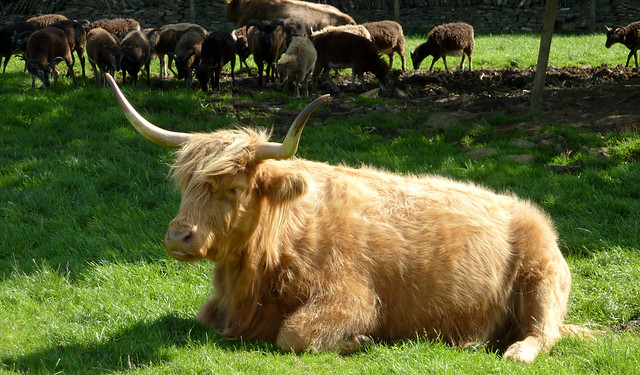

Caption: a horned cow laying in a field with other animals


In [14]:
display(image)
print('Caption: {}'.format(result[0]['caption']))


In [19]:
! mkdir -p datasets

In [20]:
! cp /raid/AISSEL/Hamed/datasets/mm_bk/CityPersons/leftImg8bit_trainvaltest/leftImg8bit/train/aachen/aachen_000034_000019_leftImg8bit.png datasets/
! ls datasets

aachen_000034_000019_leftImg8bit.png


In [27]:
image = Image.open('./datasets/aachen_000034_000019_leftImg8bit.png')

# Construct input sample & preprocess for GPU if cuda available
sample = construct_sample(image)
sample = utils.move_to_cuda(sample) if use_cuda else sample
sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample

In [28]:
# Run eval step for caption
with torch.no_grad():
    result, scores = eval_step(task, generator, models, sample)

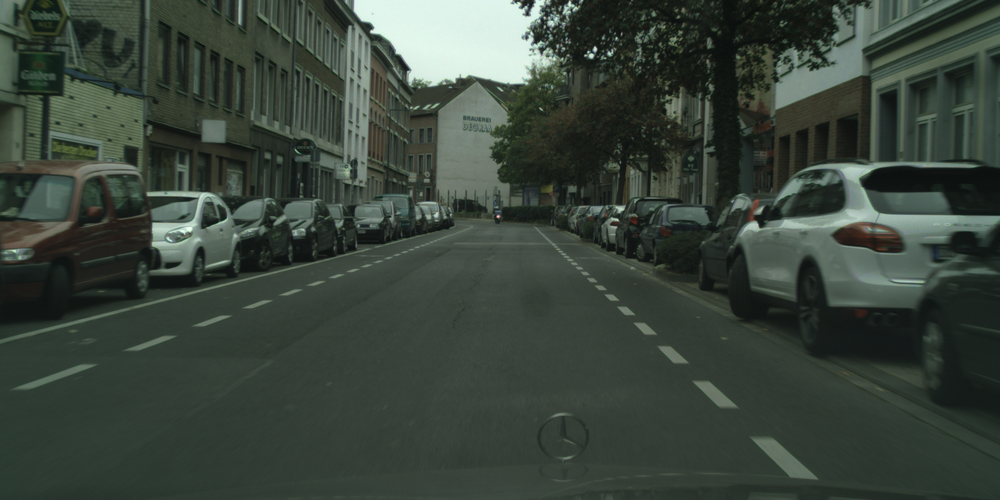

Caption: a city street with cars parked on both sides and a person riding a bike down


In [29]:
display(image)
print('Caption: {}'.format(result[0]['caption']))


In [33]:
result

[{'image_id': '42',
  'caption': 'a city street with cars parked on both sides and a person riding a bike down'}]

In [32]:
print(result[0]['caption'])

a city street with cars parked on both sides and a person riding a bike down


In [24]:
import glob
data_set_root = '/raid/AISSEL/Hamed/datasets'
city_person_path = 'leftImg8bit/train'

In [40]:
import pandas as pd

In [37]:
def get_caption(fp):   
    image = Image.open(fp)

    # Construct input sample & preprocess for GPU if cuda available
    sample = construct_sample(image)
    sample = utils.move_to_cuda(sample) if use_cuda else sample
    sample = utils.apply_to_sample(apply_half, sample) if use_fp16 else sample
    with torch.no_grad():
        result, scores = eval_step(task, generator, models, sample)
    print(f'\n {result}\n')
    return result[0]['caption']

In [38]:
caption_dict = dict()

In [39]:
for name in glob.glob(f'{data_set_root}/{city_person_path}/*/*.png'):
    caption = get_caption(name)
    caption_dict[name] = caption


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it and buildings on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with a sidewalk and trees'}]


 [{'image_id': '42', 'caption': 'a family walking down a street in an alley'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in a cross walk'}]


 [{'image_id': '42', 'caption': 'a woman walking a dog down a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a city street with people walking on the sidewalk and cars driving down the road'}]


 [{'image_id': '42', 'caption': 'a city street with 


 [{'image_id': '42', 'caption': 'a busy street in a city with people walking down the street'}]


 [{'image_id': '42', 'caption': 'two motorcycles driving down a street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a man walking down a street with a car'}]


 [{'image_id': '42', 'caption': 'a city street with a person standing on the corner of a street'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a cobblestone street'}]


 [{'image_id': '42', 'caption': 'a city street with people walking and cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with people walking and a man riding a bike down it'}]


 [{'image_id': '42', 'caption': 'people crossing the street in a


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in a cross walk'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'the back of a black car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a red fire truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of th


 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a person riding a bike on a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]


 [{'image_id': '42', 'caption': 'a tunnel in a city with cars driving through it'}]


 [{'image_id': '42', 'caption': 'a man walking down a street with a car and a bus'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street with a car and a bus'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'an empty city street with a bus driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a person walking on a sidewalk'}]


 [{'image_id': '42', 'caption': 'a man crossing a street in the middle of a cross walk'}]


 [{'image_id': '42'


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it and trees'}]


 [{'image_id': '42', 'caption': 'a man walking across a street while talking on his cell phone'}]


 [{'image_id': '42', 'caption': 'an empty street with a park in the background'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with a woman crossing the street'}]


 [{'image_id': '42', 'caption': 'a busy road with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a road with cars and a person running on the side of it'}]


 [{'image_id': '42', 'caption': 'a car and a motorcycle driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road and a motorcycle'}]


 [{'image_id': '42', 'caption': 'a city street with a church in the background'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a street with a car'}]


 [{'image_id': '42', 'caption': 'a woman crossing the street in the middle of an 


 [{'image_id': '42', 'caption': 'a city street with a large brick building on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a cyclist on a bike'}]


 [{'image_id': '42', 'caption': 'two people walking down a city street with cars'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a traffic light in the middle'}]


 [{'image_id': '42', 'caption': 'an empty street in the city with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings'}]


 [{'image_id': '42', 'caption': 'an empty street in a city with no cars on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id


 [{'image_id': '42', 'caption': 'a car driving down a street with a red light'}]


 [{'image_id': '42', 'caption': 'a city street with a car parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'an empty street in a city with a building in the background'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a motorcycle parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with a green traffic light and buildings'}]


 [{'image_id': '42', 'caption': 'a city street with a bus and a bus stop on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42


 [{'image_id': '42', 'caption': 'a white van driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with a bus and cars on it'}]


 [{'image_id': '42', 'caption': 'a city street with a large building on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a double decker bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with tall buildings and a garage'}]


 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a green traffic li


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in front of a bus'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving through a red light'}]


 [{'image_id': '42', 'caption': 'an empty street with trees and a building in the background'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with a building in the background'}]


 [{'image_id': '42', 'caption': 'a city street with trees on both sides of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people and buildings'}]


 [{'image_id': '42', 'caption': 'an empty city street with a crosswalk and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow van'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street with a man on a motorcycle'}]


 [{'image_id': '42', 'caption': 'a city street with cars and bikes parked on the side of it'}


 [{'image_id': '42', 'caption': 'a city street with buildings and a car in the foreground and a 30mph sign'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a street next to a car'}]


 [{'image_id': '42', 'caption': 'two people crossing a city street with a stroller'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'an empty street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a mountain in the background'}]


 [{'image_id': '42', 'caption': 'a city street with a crosswalk and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with a white building on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and a 


 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with a flag in the middle of it'}]


 [{'image_id': '42', 'caption': 'a city street with a bike lane and people walking down it'}]


 [{'image_id': '42', 'caption': 'a road in a park with cars on it'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street with parked cars'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a church in the distance'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street under a bridge'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights on a cloudy day'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it and trees'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'two buses on a city street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a cobblestone street'}]


 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with tram tracks and people walking down the street'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy road with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a minivan driving down a city street with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a person standing on a sidewalk'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a street with a building in the distance and a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a street filled with cars parked on th


 [{'image_id': '42', 'caption': 'a house on a street with a puddle of water'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a bridge over a city street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'an empty city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a puddle of water on the road'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in front of a house'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'an empty city street w


 [{'image_id': '42', 'caption': 'an orange truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in a crosswalk'}]


 [{'image_id': '42', 'caption': 'a red car driving down a street in front of parked cars'}]


 [{'image_id': '42', 'caption': 'a busy city street with a red car and people walking on the sidewalk'}]


 [{'image_id': '42', 'caption': 'an empty city street with a green traffic light and people standing on the side of'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a busy city street with people crossing the street in a cross walk'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in a city'}]


 [{'image_id': '42', 'caption': 'two people crossing an empty street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street 


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]


 [{'image_id': '42', 'caption': 'a man crossing the street in the middle of a city street'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in a cross walk'}]


 [{'image_id': '42', 'caption': 'a group of people on bikes on a city street'}]


 [{'image_id': '42', 'caption': 'people crossing the street in the middle of a busy city street'}]


 [{'image_id': '42', 'caption': 'two people crossing the street in the city'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city intersection'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a reflection of the front of a'}]


 [{'image_id': '42', 'caption': 'a group of motorcyclists dr


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a man walking down a city street with a cane'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a city'}]


 [{'image_id': '42', 'caption': 'a man crossing the street on a skateboard in the middle of a city street'}]


 [{'image_id': '42', 'caption': 'a group of people crossing the street at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with a motorcycle driving down it'}]


 [{'image_id': '42', 'caption': 'people walking down a cobblestone street in a parking lot'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in a cross walk'}]


 [{'image_id': '42', 'caption': 'a red van driving down a busy city street in a traffic light'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with cars


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of people standing on a sidewalk next to a street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with a person crossing the street'}]


 [{'image_id': '42', 'caption': 'a man riding a bike down a road with a car'}]


 [{'image_id': '42', 'caption': 'a street with cars and a motorcycle driving down it'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with trees'}]


 [{'image_id': '42', 'caption': 'an empty street with a person standing on the corner of a cross walk'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]


 [{'image_id': '42', 'caption': 'a road with red and white barriers on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'im


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street with a dog'}]


 [{'image_id': '42', 'caption': 'a group of people riding bikes down a street'}]


 [{'image_id': '42', 'caption': 'two people crossing the street in the middle of a city street'}]


 [{'image_id': '42', 'caption': 'the view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a green car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of the road'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and people walking on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a car driving down a cobblestone street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and people standing on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy road with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of people crossing the street in a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street with a bus and cars on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people standing on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a city street


 [{'image_id': '42', 'caption': 'a car driving down a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and people walking on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with its lights on'}]


 [{'image_id': '42', 'caption': 'a white bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a street with cars'}]


 [{'image_id': '42', 'caption': 'a city street with cars at a green traffic light'}]


 [{'image_id': '42', 'caption': 'a white car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'an empty city street with cars driving down it and a car parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it 


 [{'image_id': '42', 'caption': 'a man crossing the street in a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street on bikes and a person in a wheelchair'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and people walking down'}]


 [{'image_id': '42', 'caption': 'people walking down a street in the city'}]


 [{'image_id': '42', 'caption': 'the view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and buildings on the'}]


 [{'image_id': '42', 'caption': 'a city street with tram tracks and cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with tram tracks and cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a city street with people walking on a sidewalk and a mercedes logo on the'}]


 [{'image_id': '42', 'caption': 'a street in the city with a car and people crossing the street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city with people walking on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with bikes parked on the side'}]


 [{'image_id': '42', 'caption': 'a busy city street with people walking on the sidewalk and cars driving down the street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people riding bikes down it'}]


 [{'image_id': '42', 'caption': 'a group of people riding bikes down a city street'}]


 [{'image_id': '42', 'caption': 'a large group of bikes parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and trees on a cloudy day'}


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a puddle of water'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and a puddle'}]


 [{'image_id': '42', 'caption': 'an empty city street with people walking and cycling on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a man walking down a city street with a briefcase'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the front of a car'}]


 [{'image_id': '42', 'caption': 'people crossing the street at an intersection in a city'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'an empty street in a city with buildings and trees'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and a car in front of a'}]


 [{'image_id': '42', 'caption': 'the view of a city str


 [{'image_id': '42', 'caption': 'a bus driving down a city street in front of a building'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street with cars and pedestrians on the sidewalk and a traffic light on the'}]


 [{'image_id': '42', 'caption': 'two people walking down a cobblestone street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'people crossing a cobblestone street in a city with a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle on it'}]


 [{'image_id': '42', 'caption': 'a group of people riding bikes down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a motorcycle driving down it'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a street in a city'}]


 [{'image_id': '42', 'caption': 'a cobblestone street in a city with tall buildings'}]


 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of the road'}]


 [{'image_id': '42', 'caption': 'an empty street in a city with a white building in the background'}]


 [{'image_id': '42', 'caption': 'a group of people riding bikes on a cobblestone street'}]


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people walking on the side of the road'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a street in a city'}]


 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]


 [{'image_id': '42', 'caption': 'two people crossing the street in a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a person crossing a street in the middle of a crosswalk'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a man pushing a stroller down a st


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a rainy day'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a city street with trees and buildings on either side and a car driving down it'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a street in a city'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus driving down it'}]


 [{'image_id': '42', 'caption': 'a screenshot of a street with cars and a motorcycle'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people walking on the side of the road


 [{'image_id': '42', 'caption': 'people walking down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'an empty city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a street with cars parked on the side and people walking down the street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in front of a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car parked on a puddle of water'}]


 [{'imag


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a narrow street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a busy city street'}]


 [{'image_id': '42', 'caption': 'two people crossing a street in a city'}]


 [{'image_id': '42', 'caption': 'an empty city street with a car driving through a crosswalk'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a zebra crossing in a city street with cars and people crossing th


 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a glass building'}]


 [{'image_id': '42', 'caption': 'an empty city street with a car in front of a building'}]


 [{'image_id': '42', 'caption': 'an empty city street with a building in the background'}]


 [{'image_id': '42', 'caption': 'a city street with a train in the middle of it'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street in a city'}]


 [{'image_id': '42', 'caption': 'an empty street in a park with people walking down the street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a red car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street with people walking down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus at a traffic light'}]


 [{'


 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a man taking a picture of traffic on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it and a church tower in the distance'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a person on a bike'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in front of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving through a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on the side of the road'}]


 [{


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with people riding bikes and tram tracks'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the back of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy street with cars on it and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a red car driving down a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a street with a car driving down it and people standing on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in front of a row of parked cars'}]


 [{'image_id': '42', 'caption': 'a woman riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on 


 [{'image_id': '42', 'caption': 'people walking down a street in a city with parked cars'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a motorcycle driving down it'}]


 [{'image_id': '42', 'caption': 'a street in the city with cars driving down it'}]


 [{'image_id': '42', 'caption': 'an empty city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with a person walking on the sidewalk and a car on the road'}]


 [{'image_id': '42', 'caption': 'a city street with a bus and people walking on a sidewalk'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking on the s


 [{'image_id': '42', 'caption': 'a city street with a church in the background and a car in the foreground'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it and a man walking down the sidewalk'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the front of a car on a street with parked cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving on it and a traffic light'}]


 [{'image_id': '42', 'caption': 'a man walking down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a white car driving through an intersection on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with a reflection of a car in a puddle'}]


 [{'image_id': '42', 'caption': 'the view of a street from the front of a car'}]


 [{'image_id': '42', 'caption

In [41]:
df = pd.DataFrame(caption_dict.items(), columns=['file_path', 'caption'])
df

,file_path,caption
0,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a city street with a car driving down it
1,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a city street with cars driving down it
2,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a city street with a car driving down it and b...
3,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a car driving down a street with cars parked o...
4,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a car driving down a street with a sidewalk an...
...,...,...
2970,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a city street with a puddle of water in the mi...
2971,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a view of a city street from a car windshield ...
2972,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,a car stopped at a red light on a city street
2973,/raid/AISSEL/Hamed/datasets/leftImg8bit/train/...,the view from the dashboard of a car driving u...


In [42]:
df.to_csv('city_person.csv', sep='\t')

In [44]:
ecp_path = 'ECP/day/img/train'

In [50]:
from tqdm import tqdm_notebook

In [52]:
ecaption_dict = dict()
for name in tqdm_notebook(glob.glob(f'{data_set_root}/{ecp_path}/*/*.png')):
    print(name)
    caption = get_caption(name)
    ecaption_dict[name] = caption

/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/23892 [00:00<?, ?it/s]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00270.png


/home/barzamini/ofa/OFA/models/sequence_generator.py:698: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  unfin_idx = bbsz_idx // beam_size



 [{'image_id': '42', 'caption': 'an empty street in the city with cars and people crossing the street at a cross'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00542.png

 [{'image_id': '42', 'caption': 'a city street with people standing on the corner of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00000.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a van on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00001.png

 [{'image_id': '42', 'caption': 'the view of a city street from a car rear view mirror'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00002.png

 [{'image_id': '42', 'caption': 'a city street with parked cars and bicycles on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00003.png

 [{'image_id': '42', 'caption': 'a busy street with cars and vans on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img


 [{'image_id': '42', 'caption': 'a city street in the rain with a bus on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00051.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00052.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00053.png

 [{'image_id': '42', 'caption': 'a city street with a red car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00054.png

 [{'image_id': '42', 'caption': 'a blue and white bus with passengers on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00055.png

 [{'image_id': '42', 'caption': 'a city street with bikes parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00056.png

 [{'


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00088.png

 [{'image_id': '42', 'caption': 'a view of a city street through the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00089.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00090.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and a red car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00091.png

 [{'image_id': '42', 'caption': 'a man walking down a street next to a canal'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00092.png

 [{'image_id': '42', 'caption': 'a car with its lights on driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amster


 [{'image_id': '42', 'caption': 'a white van driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00141.png

 [{'image_id': '42', 'caption': 'a man crossing a street in the rain in front of a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00142.png

 [{'image_id': '42', 'caption': 'the view of a city street from inside a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00143.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00144.png

 [{'image_id': '42', 'caption': 'a group of people walking in the rain with umbrellas'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00145.png

 [{'image_id': '42', 'caption': 'the view from a car window of a street with houses and cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00146.p


 [{'image_id': '42', 'caption': 'a city street with a bus and a car and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00193.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a tram'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00194.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00195.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00196.png

 [{'image_id': '42', 'caption': 'a city street with cars and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00197.png

 [{'image_id': '42', 'caption': 'a blurry picture of a city street with bikes and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00


 [{'image_id': '42', 'caption': 'a city street in the rain with a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00245.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a building with a clock tower'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00246.png

 [{'image_id': '42', 'caption': 'a street with parked cars and bikes in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00247.png

 [{'image_id': '42', 'caption': 'a van driving down a busy city street next to a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00248.png

 [{'image_id': '42', 'caption': 'a police car driving through an intersection in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00249.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00250.png

 [{'imag


 [{'image_id': '42', 'caption': 'two cars driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00298.png

 [{'image_id': '42', 'caption': 'two people crossing a street in a city with a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00299.png

 [{'image_id': '42', 'caption': 'the back of a bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00300.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00301.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00302.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car window'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00303.png

 [{'image_id': '42', 'caption': 'a city st


 [{'image_id': '42', 'caption': 'a man and woman standing next to a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00351.png

 [{'image_id': '42', 'caption': 'a city street with cars and bicycles on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00352.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00353.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00354.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00356.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a tram on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/


 [{'image_id': '42', 'caption': 'a city street with a blue and white train on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00403.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00404.png

 [{'image_id': '42', 'caption': 'a city street with bikes and buildings on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00405.png

 [{'image_id': '42', 'caption': 'a row of bikes parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00407.png

 [{'image_id': '42', 'caption': 'a restaurant with tables and chairs on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00408.png

 [{'image_id': '42', 'caption': 'a car parked on the side of a city street with a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00409.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a woman standing in front of a white van on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00456.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a church'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00458.png

 [{'image_id': '42', 'caption': 'a city street in the rain with a bus and a tram'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00459.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00460.png

 [{'image_id': '42', 'caption': 'a city street in the rain with buildings and traffic lights'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00461.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00462.png

 [{'image


 [{'image_id': '42', 'caption': 'a city street in the rain with a bus and cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00510.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00511.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00512.png

 [{'image_id': '42', 'caption': 'a city street on a rainy day in the netherlands'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00513.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00514.png

 [{'image_id': '42', 'caption': 'a city street with cars and trucks on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00515.png

 [{'image_id': '42', 'caption': 'a ci


 [{'image_id': '42', 'caption': 'a blue and white bus with passengers on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00338.png

 [{'image_id': '42', 'caption': 'a busy city street with a bus and a tram and people on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00355.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00372.png

 [{'image_id': '42', 'caption': 'a city street with bikes parked on the sidewalk and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00389.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a police car in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00406.png

 [{'image_id': '42', 'caption': 'a city street with people walking down the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/a


 [{'image_id': '42', 'caption': 'a busy city street with cars and a police car and a ambulance'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00600.png

 [{'image_id': '42', 'caption': 'a group of people walking a dog down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00601.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00602.png

 [{'image_id': '42', 'caption': 'a white van driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00603.png

 [{'image_id': '42', 'caption': 'a city street viewed through the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00604.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00605.png

 [{'i


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00653.png

 [{'image_id': '42', 'caption': 'a typical street in amsterdam with parked cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00654.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00655.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00656.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00657.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_0


 [{'image_id': '42', 'caption': 'a white van driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00706.png

 [{'image_id': '42', 'caption': 'a view of an empty street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00707.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00708.png

 [{'image_id': '42', 'caption': 'a rainy day in the city of amsterdam'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00709.png

 [{'image_id': '42', 'caption': 'a white bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00710.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00711.png

 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a rainy day in berlin with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00759.png

 [{'image_id': '42', 'caption': 'a blue and white train on a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00760.png

 [{'image_id': '42', 'caption': 'a busy city street with bikes parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00761.png

 [{'image_id': '42', 'caption': 'a city street with cars and bikes on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00762.png

 [{'image_id': '42', 'caption': 'people crossing the street on a rainy day in a crosswalk in a busy city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00764.png

 [{'image_id': '42', 'caption': 'a row of bikes parked in front of a bridge on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterda


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00812.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00813.png

 [{'image_id': '42', 'caption': 'a city street in the netherlands with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00815.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car window'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00816.png

 [{'image_id': '42', 'caption': 'a blue and white train on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00817.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00818.png

 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00834.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00835.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00836.png

 [{'image_id': '42', 'caption': 'a city street with people riding bikes and cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00837.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00838.png

 [{'image_id': '42', 'caption': 'a person riding a bike on a city street at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00839.png

 [{'image_id


 [{'image_id': '42', 'caption': 'a city street with cars and bikes in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00887.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks and people on bikes'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00888.png

 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and a train'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00889.png

 [{'image_id': '42', 'caption': 'a city street with a car in the foreground and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00890.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00891.png

 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and bicyclists'}]

/raid/AISSEL/Hamed/datasets/E


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00940.png

 [{'image_id': '42', 'caption': 'a man crossing the street in a crosswalk with a bag and a bicyclist'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00941.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00942.png

 [{'image_id': '42', 'caption': 'a white van driving down a busy city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00943.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking on the sidewalk and a yellow car driving'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00944.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/i


 [{'image_id': '42', 'caption': 'a city street with a yellow taxi driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00993.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00994.png

 [{'image_id': '42', 'caption': 'a car driving down a busy city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00995.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00996.png

 [{'image_id': '42', 'caption': 'a small car parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00997.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_00998.png

 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a city street with cars and a police car in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_01046.png

 [{'image_id': '42', 'caption': 'a white van driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_01047.png

 [{'image_id': '42', 'caption': 'a city street with a tram and a bus on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_01048.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a truck and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_01049.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_01050.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/amsterdam/amsterdam_01051.png

 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a taxi driving down the street in front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00020.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00021.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00022.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00023.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00024.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00025.png

 


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00100.png

 [{'image_id': '42', 'caption': 'a person riding a scooter down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00117.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00134.png

 [{'image_id': '42', 'caption': 'a long line of cars on the road in a parking lot'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00151.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00168.png

 [{'image_id': '42', 'caption': 'the arc de triomphe in the city of paris'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00185.png

 [{'image_id': '42', 'caption': 'a vi


 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00109.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00110.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00111.png

 [{'image_id': '42', 'caption': 'a crowd of people walking down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00112.png

 [{'image_id': '42', 'caption': 'a white car driving down the road in front of other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00113.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00114.png

 [{'im


 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00162.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00163.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00164.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00165.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00166.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00167.png

 [{'image_i


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00215.png

 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00216.png

 [{'image_id': '42', 'caption': 'a taxi driving down the street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00217.png

 [{'image_id': '42', 'caption': 'a city intersection with cars and a crosswalk and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00218.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00220.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a city street with trees and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/tra


 [{'image_id': '42', 'caption': 'an empty city street with a red traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00267.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00268.png

 [{'image_id': '42', 'caption': 'a truck driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00269.png

 [{'image_id': '42', 'caption': 'a man riding a motorcycle down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00271.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with other cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00272.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00273.png

 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00320.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00322.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00323.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00324.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00325.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00326.png

 [{'imag


 [{'image_id': '42', 'caption': 'a person crossing the street with a dog'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00374.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00375.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00376.png

 [{'image_id': '42', 'caption': 'a city street with a traffic light and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00377.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00378.png

 [{'image_id': '42', 'caption': 'a city street with motorcycles parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00379.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00426.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00427.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00428.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00429.png

 [{'image_id': '42', 'caption': 'a car driving down a street with parked cars and a scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00430.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/trai


 [{'image_id': '42', 'caption': 'a city street filled with cars and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00478.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a red car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00479.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00480.png

 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00481.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with other cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00482.png

 [{'image_id': '42', 'caption': 'a car driving down the street in front of an archway on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/b


 [{'image_id': '42', 'caption': 'a city street with cars and motorcycles and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00530.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00531.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00532.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00533.png

 [{'image_id': '42', 'caption': 'a yellow car and a black car parked on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00534.png

 [{'image_id': '42', 'caption': 'a man pushing a woman in a wheelchair across a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/im


 [{'image_id': '42', 'caption': 'a woman crossing the street at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00567.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00568.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00569.png

 [{'image_id': '42', 'caption': 'the view from the front of a car driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00570.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00571.png

 [{'image_id': '42', 'caption': 'a person crossing the street in a crosswalk in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/da


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00619.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00620.png

 [{'image_id': '42', 'caption': 'the view of a street from the back windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00621.png

 [{'image_id': '42', 'caption': 'a group of motorcyclists and a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00622.png

 [{'image_id': '42', 'caption': 'a truck driving down a street in front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00623.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00624.png

 [{'image_id':


 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a taxi'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00671.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00672.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00673.png

 [{'image_id': '42', 'caption': 'two police officers standing in the middle of a street with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00674.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00675.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barc


 [{'image_id': '42', 'caption': 'the back of a car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00723.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00724.png

 [{'image_id': '42', 'caption': 'a city street filled with traffic and buses and cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00725.png

 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00726.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a person on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00727.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bar


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00776.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00777.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00778.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00779.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00781.png

 [{'image_id': '42', 'caption': 'a group of motorcycles and a car driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00782.png

 [{'i


 [{'image_id': '42', 'caption': 'a view of the arc de triomphe from a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00829.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00830.png

 [{'image_id': '42', 'caption': 'a city street with cars and motorcycles parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00559.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00576.png

 [{'image_id': '42', 'caption': 'a taxi in the middle of a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00593.png

 [{'image_id': '42', 'caption': 'a city street with palm trees and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00610.


 [{'image_id': '42', 'caption': 'a line of cars driving down the highway on a sunny day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00867.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00868.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00869.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and bikes on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00870.png

 [{'image_id': '42', 'caption': 'a group of people crossing a city street with luggage'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00871.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00872.png

 [{'image_


 [{'image_id': '42', 'caption': 'the view from the back of a car down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00920.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00921.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00922.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00923.png

 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a blue sky'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00924.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00925.png

 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00972.png

 [{'image_id': '42', 'caption': 'a city street with parked cars and a truck on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00973.png

 [{'image_id': '42', 'caption': 'a gold car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00974.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a person on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00975.png

 [{'image_id': '42', 'caption': 'a busy street with cars and motorcycles and palm trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00976.png

 [{'image_id': '42', 'caption': 'a city street with cars and palm trees and a gas station'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00977.png


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01025.png

 [{'image_id': '42', 'caption': 'a city street with motorcycles parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01026.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01027.png

 [{'image_id': '42', 'caption': 'a taxi stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01028.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01029.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and palm trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01030.png




 [{'image_id': '42', 'caption': 'a taxi driving down a busy city street with other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01077.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01078.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01079.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle in a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01080.png

 [{'image_id': '42', 'caption': 'a city street with a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01081.png

 [{'image_id': '42', 'caption': 'a row of motorcycles parked on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01082.png

 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01239.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00270.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00542.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_00814.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01104.png

 [{'image_id': '42', 'caption': 'a taxi driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01105.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a busy city street with cars and people on a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01152.png

 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01153.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01155.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01156.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a taxi driving down the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01157.png

 [{'image_id': '42', 'caption': 'a yellow and black car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train


 [{'image_id': '42', 'caption': 'a view of a busy city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01204.png

 [{'image_id': '42', 'caption': 'people crossing the street on a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01206.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle in a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01207.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01208.png

 [{'image_id': '42', 'caption': 'a police officer walking through a busy highway with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01209.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01


 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01256.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01257.png

 [{'image_id': '42', 'caption': 'a view of a street with cars and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01258.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a car driving through a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01259.png

 [{'image_id': '42', 'caption': 'a city bus driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/barcelona/barcelona_01260.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/ba


 [{'image_id': '42', 'caption': 'a man riding a bike down a street next to a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00048.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00049.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00050.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00051.png

 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00053.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00054.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city stree


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00087.png

 [{'image_id': '42', 'caption': 'a city street with a yellow truck and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00089.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00090.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00091.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00092.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00093.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of 


 [{'image_id': '42', 'caption': 'a view of a street from the hood of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00144.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00145.png

 [{'image_id': '42', 'caption': 'a zebra crossing on a city street at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00146.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00147.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00148.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00149.png

 [{'image_id': '42', 'caption': 'a view of a street from the insid


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00200.png

 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00201.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00202.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00203.png

 [{'image_id': '42', 'caption': 'a green bus is stopped at a bus stop on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00204.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00205.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a 


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00256.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00257.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00258.png

 [{'image_id': '42', 'caption': 'a car driving in front of a truck on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00259.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00260.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00261.png

 [{'image_id': '42', 'caption': 'a city street with a car parked on the side


 [{'image_id': '42', 'caption': 'a car driving in front of a train on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00312.png

 [{'image_id': '42', 'caption': 'a city street with a tram in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00313.png

 [{'image_id': '42', 'caption': 'a row of motorcycles parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00314.png

 [{'image_id': '42', 'caption': 'a yellow truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00315.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00316.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of an empty city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00317.png

 [{'image_id': '42', 'caption': 'the view from the back of a car


 [{'image_id': '42', 'caption': 'a city street with cars and bikes parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00367.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00368.png

 [{'image_id': '42', 'caption': 'a city street with a car parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00369.png

 [{'image_id': '42', 'caption': 'a yellow bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00370.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00371.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a street in a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00372.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back 


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00422.png

 [{'image_id': '42', 'caption': 'a city street with a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00423.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a street with cars and a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00424.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00425.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00426.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a truck and other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00427.png

 [{'image_id': '42', 'caption': 'a view 


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00477.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00478.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00479.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00480.png

 [{'image_id': '42', 'caption': 'a blue car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00481.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00482.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'


 [{'image_id': '42', 'caption': 'a city street with a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00533.png

 [{'image_id': '42', 'caption': 'a city street with motorcycles and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00534.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00535.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00536.png

 [{'image_id': '42', 'caption': 'a truck driving down a city street next to a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00537.png

 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00539.png

 [{'image_id': '42', 'caption': 'the view from the das


 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00589.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00590.png

 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00591.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00593.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00594.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00595.png

 [{'image_id': '42', 'caption': 'the view from the back of a car drivin


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00574.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00592.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/basel/basel_00610.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street with a car and a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00000.png

 [{'image_id': '42', 'caption': 'a car driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00001.png

 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00002.png

 [{'image_id': '42', 'caption': 'a white car dri


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00050.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00051.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00052.png

 [{'image_id': '42', 'caption': 'a truck driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00053.png

 [{'image_id': '42', 'caption': 'a white van stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00054.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00055.png

 [{'imag


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00081.png

 [{'image_id': '42', 'caption': 'a city street with a white van driving through a construction zone'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00082.png

 [{'image_id': '42', 'caption': 'a car driving through a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00084.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00085.png

 [{'image_id': '42', 'caption': 'a busy intersection with cars and people at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00086.png

 [{'image_id': '42', 'caption': 'a city street with a car and a church in the distance'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00087.png

 [{'i


 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a cloudy sky'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00135.png

 [{'image_id': '42', 'caption': 'a car driving under a bridge on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00136.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a cloudy sky'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00137.png

 [{'image_id': '42', 'caption': 'a white van driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00138.png

 [{'image_id': '42', 'caption': 'a busy road with cars driving under a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00139.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it and people standing on the side of'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00140.png

 [{'image_


 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00188.png

 [{'image_id': '42', 'caption': 'a city street with a building and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00189.png

 [{'image_id': '42', 'caption': 'a city street with people crossing the street on a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00190.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a city street with cars and traffic'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00191.png

 [{'image_id': '42', 'caption': 'a garbage truck is parked on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00192.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00193.png

 [{'i


 [{'image_id': '42', 'caption': 'a busy city intersection with cars and people on the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00241.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a building with a clock tower'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00242.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00243.png

 [{'image_id': '42', 'caption': 'a white van stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00244.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00245.png

 [{'image_id': '42', 'caption': 'a city street with cars and buses and people on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00246.png

 [{'image_


 [{'image_id': '42', 'caption': 'a city street with cars and pedestrians on a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00294.png

 [{'image_id': '42', 'caption': 'a group of people crossing a street in a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00295.png

 [{'image_id': '42', 'caption': 'people crossing the street in a park in the city of paris'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00296.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00297.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00298.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00299.png

 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a city street with cars and pedestrians on a crosswalk and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00348.png

 [{'image_id': '42', 'caption': 'a white van driving down a street with a double decker bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00349.png

 [{'image_id': '42', 'caption': 'a city street with a car and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00350.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and trucks'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00351.png

 [{'image_id': '42', 'caption': 'the back of a white bus driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00352.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a tall tower in the distance'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/berlin/berlin_00353.p


 [{'image_id': '42', 'caption': 'a man riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00013.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00014.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00016.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00017.png

 [{'image_id': '42', 'caption': 'a busy street with cars and motorcycles at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00018.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00019.png

 [{'image_id': '42', 'caption': 'a city bus drivin


 [{'image_id': '42', 'caption': 'a narrow street with motorcycles parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00049.png

 [{'image_id': '42', 'caption': 'a person walking down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00066.png

 [{'image_id': '42', 'caption': 'people on bikes and a scooter on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00083.png

 [{'image_id': '42', 'caption': 'a christmas tree in the middle of the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00100.png

 [{'image_id': '42', 'caption': 'a white van parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00117.png

 [{'image_id': '42', 'caption': 'two people standing on the sidewalk of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00134.png

 [{'image_id': '42', 'caption': 'the view from the da


 [{'image_id': '42', 'caption': 'a car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00107.png

 [{'image_id': '42', 'caption': 'a city street with cars and a man walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00108.png

 [{'image_id': '42', 'caption': 'a bus driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00109.png

 [{'image_id': '42', 'caption': 'a group of cars driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00110.png

 [{'image_id': '42', 'caption': 'a city street with people walking and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00111.png

 [{'image_id': '42', 'caption': 'the side of a building with a yellow wall'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00112.png

 [{'image_id': '42', 'caption': 'a city str


 [{'image_id': '42', 'caption': 'a man standing outside a door of a building on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00161.png

 [{'image_id': '42', 'caption': 'a city street with a bus driving down the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00162.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00163.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00164.png

 [{'image_id': '42', 'caption': 'a street in the city with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00165.png

 [{'image_id': '42', 'caption': 'a narrow street with cars and a man riding a bike down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00166.png

 [{'image_id': '42', 'caption': 'a bus


 [{'image_id': '42', 'caption': 'a person riding a motorcycle on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00215.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00216.png

 [{'image_id': '42', 'caption': 'a car parked at a bus stop on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00217.png

 [{'image_id': '42', 'caption': 'a group of people walking down a street in an alley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00218.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a man walking down the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00220.png

 [{'image_id': '42', 'caption': 'a narrow street with a car and a bike on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00221.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00269.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00271.png

 [{'image_id': '42', 'caption': 'a police car and a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00272.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00273.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00274.png

 [{'image_id': '42', 'caption': 'the side of a building with a yellow wall and a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00275.png

 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'a car parked at a bus stop on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00324.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00325.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on both sides and a person riding a motorcycle down'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00326.png

 [{'image_id': '42', 'caption': 'a bus is driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00327.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street next to a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00328.png

 [{'image_id': '42', 'caption': 'people waiting to get into a car at a bus stop'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00329.png

 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a woman crossing the street with a dog     in a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00378.png

 [{'image_id': '42', 'caption': 'a small street in a small city with a pool of water'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00379.png

 [{'image_id': '42', 'caption': 'a white van parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00380.png

 [{'image_id': '42', 'caption': 'a city street with people walking on the sidewalk and a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00381.png

 [{'image_id': '42', 'caption': 'a city street with parked cars and a fence on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00382.png

 [{'image_id': '42', 'caption': 'a narrow street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00383.png

 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a city street with cars and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00433.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00434.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00435.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00436.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00437.png

 [{'image_id': '42', 'caption': 'a city street with cars and a motorcycle parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00438


 [{'image_id': '42', 'caption': 'a city street with a car parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00487.png

 [{'image_id': '42', 'caption': 'a city street with people riding bikes and cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00488.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00489.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00490.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00492.png

 [{'image_id': '42', 'caption': 'a city street with a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00493.png

 [{'image_id': '42', 'caption': 'a narrow st


 [{'image_id': '42', 'caption': 'a city street with a car parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00543.png

 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00544.png

 [{'image_id': '42', 'caption': 'a police car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00545.png

 [{'image_id': '42', 'caption': 'a person walking down a street next to a brick wall'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00546.png

 [{'image_id': '42', 'caption': 'a city street with people walking and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00547.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00548.png

 [{'image_id': '42


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00581.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00582.png

 [{'image_id': '42', 'caption': 'a city street with a bus and cars and people on bikes'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00583.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00584.png

 [{'image_id': '42', 'caption': 'a street scene with a man pushing a cart down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00585.png

 [{'image_id': '42', 'caption': 'a woman walking down the street in front of a brick building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00586.png

 [{'image_id': '42', 'caption


 [{'image_id': '42', 'caption': 'a row of motorcycles parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00635.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00636.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00637.png

 [{'image_id': '42', 'caption': 'a city street with buildings and a puddle of water'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00638.png

 [{'image_id': '42', 'caption': 'a street in the city of valletta in malta'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00639.png

 [{'image_id': '42', 'caption': 'a city street with a car in the foreground and a person riding a bike down'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00640.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a trolley car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00690.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00691.png

 [{'image_id': '42', 'caption': 'an empty street in the city of rome'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00692.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00693.png

 [{'image_id': '42', 'caption': 'a view of a city street from the front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00694.png

 [{'image_id': '42', 'caption': 'a narrow alley with bikes parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00696.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on 


 [{'image_id': '42', 'caption': 'a double decker bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00745.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on both sides and a man walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00747.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a street next to a red car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00748.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00749.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00750.png

 [{'image_id': '42', 'caption': 'an empty street in the city with the sun shining in the'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologn


 [{'image_id': '42', 'caption': 'a narrow street with cars and a bike on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00800.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00801.png

 [{'image_id': '42', 'caption': 'two people on motorcycles driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00802.png

 [{'image_id': '42', 'caption': 'a white van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00803.png

 [{'image_id': '42', 'caption': 'people on bikes and a scooter on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00804.png

 [{'image_id': '42', 'caption': 'a bus driving down a city street with people on a scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00805.png

 [{'image_id': '42', 'caption': 'a city street with par


 [{'image_id': '42', 'caption': 'a busy city street with cars and a gas station'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00838.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00839.png

 [{'image_id': '42', 'caption': 'a woman riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00840.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00841.png

 [{'image_id': '42', 'caption': 'a car parked next to some trash cans on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00842.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00843.png

 [{'image_id': '42', 'caption': 'a


 [{'image_id': '42', 'caption': 'an empty street in a small town with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00893.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00894.png

 [{'image_id': '42', 'caption': 'a car parked at a bus stop on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00895.png

 [{'image_id': '42', 'caption': 'a narrow street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00896.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00897.png

 [{'image_id': '42', 'caption': 'a man walking down a city street with a bag on his back'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00898.png

 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00947.png

 [{'image_id': '42', 'caption': 'a car stopped at a bus stop on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00948.png

 [{'image_id': '42', 'caption': 'a reflection of a person in a car side view mirror'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00949.png

 [{'image_id': '42', 'caption': 'a city street with a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00951.png

 [{'image_id': '42', 'caption': 'a man riding a scooter down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00952.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00953.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street with a puddle of water in the middle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01003.png

 [{'image_id': '42', 'caption': 'two people walking down a narrow alley in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01004.png

 [{'image_id': '42', 'caption': 'a city street with a car and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01005.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01006.png

 [{'image_id': '42', 'caption': 'a narrow street with cars and motorcycles and a church in the distance'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01007.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01


 [{'image_id': '42', 'caption': 'a city street with a person crossing the street on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01056.png

 [{'image_id': '42', 'caption': 'a narrow street in the city with a red brick fence'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01057.png

 [{'image_id': '42', 'caption': 'a narrow street with graffiti on the walls and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01058.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01059.png

 [{'image_id': '42', 'caption': 'a view of a city street from the front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01060.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01061.png

 [{'image_id': '42


 [{'image_id': '42', 'caption': 'the view from a car windshield of a road with a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00933.png

 [{'image_id': '42', 'caption': 'a woman and a child crossing a street at a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00950.png

 [{'image_id': '42', 'caption': 'a school bus driving down a street full of motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00967.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_00984.png

 [{'image_id': '42', 'caption': 'two people on bikes and a motorcycle on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01001.png

 [{'image_id': '42', 'caption': 'a city street with a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01018.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01136.png

 [{'image_id': '42', 'caption': 'a city street with graffiti on the walls and a parked scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01138.png

 [{'image_id': '42', 'caption': 'a narrow street with a sink in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01139.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01140.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01141.png

 [{'image_id': '42', 'caption': 'a city street with a person riding a bike and a man on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01142.png

 [{'im


 [{'image_id': '42', 'caption': 'a narrow street with people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01192.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01193.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01194.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01195.png

 [{'image_id': '42', 'caption': 'a city street with cars and buses and a person on a scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01196.png

 [{'image_id': '42', 'caption': 'a narrow street in the city of rome'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bologna/bologna_01197.png

 [{'image_id': '42', 'caption': 'a cobbleston


 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00015.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00016.png

 [{'image_id': '42', 'caption': 'a city street with a traffic light in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00017.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00018.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00019.png

 [{'image_id': '42', 'caption': 'an empty city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00020.png

 [{'i


 [{'image_id': '42', 'caption': 'an empty city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00078.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00094.png

 [{'image_id': '42', 'caption': 'a road with cars and a gas station on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00110.png

 [{'image_id': '42', 'caption': 'the view from a car of a street with a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00126.png

 [{'image_id': '42', 'caption': 'two cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00142.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislav


 [{'image_id': '42', 'caption': 'a police car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00104.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00105.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00106.png

 [{'image_id': '42', 'caption': 'the entrance of a building with a 50 off sign on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00107.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00108.png

 [{'image_id': '42', 'caption': 'a police car parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00109.png

 [{'image_id': '42', 'caption': 'a car d


 [{'image_id': '42', 'caption': 'a couple crossing the street in a crosswalk in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00157.png

 [{'image_id': '42', 'caption': 'a police car driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00159.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00160.png

 [{'image_id': '42', 'caption': 'a house with a garage door on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00161.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00162.png

 [{'image_id': '42', 'caption': 'the view of a street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/b


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00211.png

 [{'image_id': '42', 'caption': 'an empty street with a car driving down the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00212.png

 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00213.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00214.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00215.png

 [{'image_id': '42', 'caption': 'a city street with a bus painted on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava


 [{'image_id': '42', 'caption': 'a city street with a train and cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00263.png

 [{'image_id': '42', 'caption': 'a school bus driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00264.png

 [{'image_id': '42', 'caption': 'a city street with buildings on either side and a car in the foreground'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00265.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00266.png

 [{'image_id': '42', 'caption': 'a busy road with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00267.png

 [{'image_id': '42', 'caption': 'a street in a city with buildings and a fence'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00268.png


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00315.png

 [{'image_id': '42', 'caption': 'a city street with a bus and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00316.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00317.png

 [{'image_id': '42', 'caption': 'a road with a car and a yellow fire hydrant on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00319.png

 [{'image_id': '42', 'caption': 'a city street with buildings on either side and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00320.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a foggy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/b


 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a foggy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00368.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00369.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00370.png

 [{'image_id': '42', 'caption': 'a red tram on a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00371.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00372.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratisl


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00420.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00421.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00422.png

 [{'image_id': '42', 'caption': 'the street in front of my car on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00423.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00424.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00472.png

 [{'image_id': '42', 'caption': 'a car and a bus at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00473.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00474.png

 [{'image_id': '42', 'caption': 'a fire truck driving down a road with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00475.png

 [{'image_id': '42', 'caption': 'a woman crossing the street at a crosswalk in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00476.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00477.png

 [{'


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00509.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00511.png

 [{'image_id': '42', 'caption': 'the view from a car of an empty street with a building and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00512.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a foggy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00513.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00514.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/brati


 [{'image_id': '42', 'caption': 'a stone wall with a street sign next to it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00562.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00563.png

 [{'image_id': '42', 'caption': 'a city street with a traffic light in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00564.png

 [{'image_id': '42', 'caption': 'a city street in the middle of a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00565.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00566.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00567.png


 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00614.png

 [{'image_id': '42', 'caption': 'the street in front of my apartment in moscow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00615.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00616.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00617.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00618.png

 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light in the middle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/br


 [{'image_id': '42', 'caption': 'a train on a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00666.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00667.png

 [{'image_id': '42', 'caption': 'a car and a bus at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00668.png

 [{'image_id': '42', 'caption': 'a city bus driving down a street with a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00669.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00671.png

 [{'image_id': '42', 'caption': 'a bus driving down a street next to buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratis


 [{'image_id': '42', 'caption': 'a city street with a bus and cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00719.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00720.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00721.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00722.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00723.png

 [{'image_id': '42', 'caption': 'a police car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00724.png

 [{'image_id': '42', 'caption': 


 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00749.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00751.png

 [{'image_id': '42', 'caption': 'a city street with a building with a clock tower     and cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00752.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00753.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00754.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a rainy day'}]

/raid/AISSEL/Hamed/datasets/


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00802.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00803.png

 [{'image_id': '42', 'caption': 'a police car driving down a street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00804.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00805.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/bratislava/bratislava_00806.png

 [{'image_id': '42', 'caption': 'a truck is parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/tra


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00023.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00024.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in front of a castle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00025.png

 [{'image_id': '42', 'caption': 'a city street with a white van at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00026.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and some buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00027.png

 [{'image_id': '42', 'caption': 'a city street with a car and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00028.png

 [{'image_id': '42', 'caption': 'a city street with a bus and people wal


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00178.png

 [{'image_id': '42', 'caption': 'a city street with a bus and some buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00196.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00214.png

 [{'image_id': '42', 'caption': 'a van driving down a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00232.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00250.png

 [{'image_id': '42', 'caption': 'a city street with people walking on the sidewalk and a tram'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00268.png

 [{'image_id': '42', 'caption': 'a city st


 [{'image_id': '42', 'caption': 'a city street with a bus and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00119.png

 [{'image_id': '42', 'caption': 'a city street in the middle of the road with a car on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00120.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and some buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00121.png

 [{'image_id': '42', 'caption': 'an empty street in a city with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00122.png

 [{'image_id': '42', 'caption': 'a taxi in the middle of a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00123.png

 [{'image_id': '42', 'caption': 'two red and white trolley cars on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00125.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshiel


 [{'image_id': '42', 'caption': 'the back of a van driving down a road with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00175.png

 [{'image_id': '42', 'caption': 'a group of people crossing a street in front of a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00176.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00177.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00179.png

 [{'image_id': '42', 'caption': 'a white car is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00180.png

 [{'image_id': '42', 'caption': 'the back of a white van driving down a highway with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00181.png

 [{'image_id': '42', 'caption': 'a white va


 [{'image_id': '42', 'caption': 'a van driving down a street with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00231.png

 [{'image_id': '42', 'caption': 'a city street with a billboard on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00233.png

 [{'image_id': '42', 'caption': 'the back of a van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00234.png

 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00235.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a parking sign'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00236.png

 [{'image_id': '42', 'caption': 'a bus driving down a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00237.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on


 [{'image_id': '42', 'caption': 'a bus driving down a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00288.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buses and a castle in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00289.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and a stop sign'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00290.png

 [{'image_id': '42', 'caption': 'people crossing the street in a crosswalk in front of a church'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00291.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00292.png

 [{'image_id': '42', 'caption': 'a car is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00293.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'a street in a city with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00344.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00345.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00346.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00347.png

 [{'image_id': '42', 'caption': 'a city street with a car in the foreground and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00348.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on the corner of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00349.png

 [{'image_id': '42', 'caption': 'a


 [{'image_id': '42', 'caption': 'a city street with a red traffic light and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00400.png

 [{'image_id': '42', 'caption': 'a city street with a bus and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00401.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00402.png

 [{'image_id': '42', 'caption': 'a van driving down a narrow street in a parking lot'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00403.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00404.png

 [{'image_id': '42', 'caption': 'the back of a van driving down a road with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00405.png

 [{'image_id': '42', 'caption': 'a city street 


 [{'image_id': '42', 'caption': 'a group of people crossing a street in front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00456.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00457.png

 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it and people working on a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00458.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a red and white crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00459.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00460.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00461.png

 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00512.png

 [{'image_id': '42', 'caption': 'a city street with a red traffic light on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00513.png

 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00514.png

 [{'image_id': '42', 'caption': 'a city street with a car and a bicyclist in the crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00515.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and taxis on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00516.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00517.png

 [{'image_id': '42', 'caption': 'a white van driving down a 


 [{'image_id': '42', 'caption': 'a city street with cars and buildings in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00567.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00568.png

 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00569.png

 [{'image_id': '42', 'caption': 'a city street with cars and trees and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00570.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00571.png

 [{'image_id': '42', 'caption': 'a woman crossing the street at a crosswalk in a zebra crossing'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00572.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/


 [{'image_id': '42', 'caption': 'a street in a city with tall buildings and a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00624.png

 [{'image_id': '42', 'caption': 'a bridge over a city street with cars and a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00625.png

 [{'image_id': '42', 'caption': 'the back of a van driving down a road with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00626.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00627.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00322.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00340.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00663.png

 [{'image_id': '42', 'caption': 'a car driving through a tunnel on a highway'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00665.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a car on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00666.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00667.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00668.png

 [{'image_id': '42', 'caption': 'a street in a city with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00669.png

 [{'image_id': '42', 'caption': 'a red and white tram on a city street'}]

/raid/AISSEL/Hame


 [{'image_id': '42', 'caption': 'the view of a street from a car windshield with people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00720.png

 [{'image_id': '42', 'caption': 'a bus driving down a busy city street with cars and a taxi'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00721.png

 [{'image_id': '42', 'caption': 'a city street with cars and people on the sidewalk and a bus on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00722.png

 [{'image_id': '42', 'caption': 'a man standing on a street corner in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00723.png

 [{'image_id': '42', 'caption': 'a bus driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00724.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00725.png

 [{'image_id': '42', 'caption': 'a city


 [{'image_id': '42', 'caption': 'a woman crossing the street in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00776.png

 [{'image_id': '42', 'caption': 'a city street with cars and pedestrians on a snowy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00777.png

 [{'image_id': '42', 'caption': 'a man crossing a street in a city with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00778.png

 [{'image_id': '42', 'caption': 'a white car driving down a street in a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00779.png

 [{'image_id': '42', 'caption': 'a city street with buses and cars under a bridge'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00780.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00781.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the


 [{'image_id': '42', 'caption': 'the back of a van driving down a road with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00833.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with the sun shining on a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00834.png

 [{'image_id': '42', 'caption': 'the back of a van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00835.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on either side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00836.png

 [{'image_id': '42', 'caption': 'a city street with cars and pedestrians and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00837.png

 [{'image_id': '42', 'caption': 'a red car driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00838.png

 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00889.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00890.png

 [{'image_id': '42', 'caption': 'people crossing the street in front of a tram in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00891.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00892.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00893.png

 [{'image_id': '42', 'caption': 'a reflection of a building in a windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00894.png

 [{'image_id': '42', 'caption': 'a city bus drivi


 [{'image_id': '42', 'caption': 'a busy city street with cars and a white car in the middle of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00808.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00826.png

 [{'image_id': '42', 'caption': 'a city street with a church in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00844.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00862.png

 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00880.png

 [{'image_id': '42', 'caption': 'a white car is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/brno/brno_00898.png

 [{'image_id': '42', 'caption': 'a bus


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00021.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00022.png

 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00023.png

 [{'image_id': '42', 'caption': 'the view of a street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00024.png

 [{'image_id': '42', 'caption': 'a city street at night with cars and buses and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00025.png

 [{'image_id': '42', 'caption': 'a city street with a van and a building in the distance'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00026.png

 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00134.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00151.png

 [{'image_id': '42', 'caption': 'a city street at night with police cars and a zebra crossing'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00168.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00185.png

 [{'image_id': '42', 'caption': 'a city street with a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00202.png

 [{'image_id': '42', 'caption': 'a person crossing the street in a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00219.png


 [{'image_id': '42', 'caption': 'a busy city street with cars and a green traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00110.png

 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00111.png

 [{'image_id': '42', 'caption': 'a group of people crossing a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00112.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00113.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00114.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00115.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a city street filled with construction equipment on the side of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00162.png

 [{'image_id': '42', 'caption': 'a bus driving under a bridge on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00163.png

 [{'image_id': '42', 'caption': 'a city street with a person walking down it and a car driving down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00164.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00165.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00166.png

 [{'image_id': '42', 'caption': 'a woman standing on a sidewalk next to a truck on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/b


 [{'image_id': '42', 'caption': 'a busy street with cars and a building in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00215.png

 [{'image_id': '42', 'caption': 'a man crossing the street at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00216.png

 [{'image_id': '42', 'caption': 'a sign on the back of a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00217.png

 [{'image_id': '42', 'caption': 'people crossing the street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00218.png

 [{'image_id': '42', 'caption': 'a street in a city with cars on the road and a train'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00220.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00221.png

 [{'i


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00268.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00269.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00271.png

 [{'image_id': '42', 'caption': 'a building on a city street with an orange van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00272.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with tram tracks'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00273.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00274.png



 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00322.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with tram tracks'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00323.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00324.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with other cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00325.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00326.png

 [{'image_id': '42', 'caption': 'a man in an orange vest standing in the middle of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/b


 [{'image_id': '42', 'caption': 'two police officers standing on a sidewalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00375.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00376.png

 [{'image_id': '42', 'caption': 'a row of cars parked in front of a building at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00377.png

 [{'image_id': '42', 'caption': 'a woman walking down a street next to a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00378.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00379.png

 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00380.png

 [{'


 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00428.png

 [{'image_id': '42', 'caption': 'a small car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00429.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00430.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00431.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00432.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a red traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/b


 [{'image_id': '42', 'caption': 'two people walking down a street next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00481.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00482.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00483.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00484.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow taxi in the middle of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00485.png

 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapes


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00534.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00535.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00536.png

 [{'image_id': '42', 'caption': 'a woman standing on a sidewalk next to a street sign'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00537.png

 [{'image_id': '42', 'caption': 'a taxi driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00538.png

 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00539.png

 [{'image_id':


 [{'image_id': '42', 'caption': 'a car driving down a city street with a person on a horse'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00729.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00746.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00763.png

 [{'image_id': '42', 'caption': 'a car parked in front of a building at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00780.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00560.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00561.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00608.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00609.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00611.png

 [{'image_id': '42', 'caption': 'a red fire hydrant on a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00612.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00613.png

 [{'image_id': '42', 'caption': 'the street in front of the train tracks on a foggy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00614.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00662.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00663.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00664.png

 [{'image_id': '42', 'caption': 'a bus and a tram on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00665.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00666.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it and a bird on the'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00667.png

 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00715.png

 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00716.png

 [{'image_id': '42', 'caption': 'a busy city street with buses and cars under a bridge'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00717.png

 [{'image_id': '42', 'caption': 'two people walking down a street next to a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00718.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00719.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00720.png

 [{'image_id': '42', 'caption': 'a car driving d


 [{'image_id': '42', 'caption': 'a city street at night with people walking and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00768.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00769.png

 [{'image_id': '42', 'caption': 'a city street at night with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00770.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00771.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/budapest/budapest_00772.png

 [{'image_id': '42', 'caption': 'a red fire hydrant on a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/b


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on the side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00005.png

 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00006.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a person on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00007.png

 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00008.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00009.png

 [{'image_id': '42', 'caption': 'a street in a city with tall buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00010.png

 [{'image_id': '42', 'caption': 'a silver bus stopped at a r


 [{'image_id': '42', 'caption': 'a car in front of another car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00060.png

 [{'image_id': '42', 'caption': 'a red bus on a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00061.png

 [{'image_id': '42', 'caption': 'a city street with people walking and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00062.png

 [{'image_id': '42', 'caption': 'a garbage truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00063.png

 [{'image_id': '42', 'caption': 'a city street with a large building on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00064.png

 [{'image_id': '42', 'caption': 'a car driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00065.png

 [{'image_id': '42', 'caption': 'a view of a ci


 [{'image_id': '42', 'caption': 'a white van parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00098.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00099.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00101.png

 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00102.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on either side and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00103.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00104.png

 [{'image_id': '42', 'capti


 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a clock tower'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00152.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00153.png

 [{'image_id': '42', 'caption': 'a building with a clock tower on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00154.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00155.png

 [{'image_id': '42', 'caption': 'a city street with a building and tram tracks'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00156.png

 [{'image_id': '42', 'caption': 'the view of a city street with a large white tank on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresd


 [{'image_id': '42', 'caption': 'a city street with a church in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00206.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00207.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00208.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00209.png

 [{'image_id': '42', 'caption': 'a city street with parked cars and bins on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00210.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00211.png

 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a city street with a building on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00260.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00261.png

 [{'image_id': '42', 'caption': 'a woman crossing the street in front of an empty street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00262.png

 [{'image_id': '42', 'caption': 'a white bus driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00263.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a white building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00264.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with a van and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00265.png

 [{'image_id':


 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00313.png

 [{'image_id': '42', 'caption': 'a city street with a car and a bus on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00314.png

 [{'image_id': '42', 'caption': 'a truck in the middle of a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00315.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00316.png

 [{'image_id': '42', 'caption': 'the view of a cobblestone street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00317.png

 [{'image_id': '42', 'caption': 'a bus driving down a cobblestone street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00318.png

 [{'image_id': '42', 'caption': 'a city stree


 [{'image_id': '42', 'caption': 'a silver bus stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00367.png

 [{'image_id': '42', 'caption': 'a white van stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00368.png

 [{'image_id': '42', 'caption': 'a city street with a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00369.png

 [{'image_id': '42', 'caption': 'a mother and child crossing an empty street in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00370.png

 [{'image_id': '42', 'caption': 'a cobblestone street in front of a building in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00371.png

 [{'image_id': '42', 'caption': 'a van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00373.png

 [{'image_id': '42', 'caption': 'a city


 [{'image_id': '42', 'caption': 'a city street with a traffic light and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00421.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00422.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00424.png

 [{'image_id': '42', 'caption': 'people crossing the street in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00425.png

 [{'image_id': '42', 'caption': 'an old building with stairs on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00426.png

 [{'image_id': '42', 'caption': 'a cobblestone street in the city with a cathedral in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00427.png

 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a city street in the rain with a person walking a dog'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00476.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00477.png

 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00478.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00479.png

 [{'image_id': '42', 'caption': 'a cobblestone street with cars parked on both sides and a building in the'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00480.png

 [{'image_id': '42', 'caption': 'a city street with cars and bicycles parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dre


 [{'image_id': '42', 'caption': 'a large building on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00529.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00530.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00531.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00532.png

 [{'image_id': '42', 'caption': 'a busy road with cars driving down it and a green traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00533.png

 [{'image_id': '42', 'caption': 'an empty street with a large building in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00534.png

 [{'image


 [{'image_id': '42', 'caption': 'a city street with a bus and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00661.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00678.png

 [{'image_id': '42', 'caption': 'the view of a city street from the front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00695.png

 [{'image_id': '42', 'caption': 'a city street with a yellow and red fence'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00712.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00729.png

 [{'image_id': '42', 'caption': 'a city street with a truck and a bus on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00560.png

 [{'image_id': '42', 'caption': 'a cobbleston


 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00608.png

 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00609.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00611.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00612.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00613.png

 [{'image_id': '42', 'caption': 'a city street with tall buildings and a fountain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00614.png

 [{'image_id': '42', 'caption': 'a


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00663.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00664.png

 [{'image_id': '42', 'caption': 'the view of a street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00665.png

 [{'image_id': '42', 'caption': 'a cobblestone street in the city with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00666.png

 [{'image_id': '42', 'caption': 'an empty street in a city with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00667.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00668.png

 [{'image_id': '42', 'caption': 'a city street wi


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00717.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a sign on the side of the'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00718.png

 [{'image_id': '42', 'caption': 'a cobblestone street in the center of a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00719.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00720.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00721.png

 [{'image_id': '42', 'caption': 'a van is stopped at a traffic light at an intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/dresden/dresden_00722


 [{'image_id': '42', 'caption': 'a city street filled with cars and motorcycles and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00014.png

 [{'image_id': '42', 'caption': 'a small car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00016.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00017.png

 [{'image_id': '42', 'caption': 'a van parked on the side of the road in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00018.png

 [{'image_id': '42', 'caption': 'a woman standing at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00019.png

 [{'image_id': '42', 'caption': 'a car and a man riding a bike on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00020.png

 [{'image_id': '42', 'caption': 'a busy 


 [{'image_id': '42', 'caption': 'a narrow street with a woman walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00049.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00066.png

 [{'image_id': '42', 'caption': 'a woman riding a bike down a narrow street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00083.png

 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00100.png

 [{'image_id': '42', 'caption': 'a bus driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00117.png

 [{'image_id': '42', 'caption': 'an empty city street with traffic lights and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00134.png

 [{'image_id': '42', 'caption': 'people walking down a 


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00107.png

 [{'image_id': '42', 'caption': 'a city street with cars and bikes parked in front of buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00108.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00109.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00110.png

 [{'image_id': '42', 'caption': 'a white car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00111.png

 [{'image_id': '42', 'caption': 'a silver car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00112.png

 [{'image_id': '42', 'caption': 'a woman riding a scooter down a


 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00161.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and people walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00162.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00163.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00164.png

 [{'image_id': '42', 'caption': 'a small truck driving down a city street with motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00165.png

 [{'image_id': '42', 'caption': 'a group of people riding bikes in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00214.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00215.png

 [{'image_id': '42', 'caption': 'the back of a car with a license plate on the back'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00216.png

 [{'image_id': '42', 'caption': 'a city street with people walking and cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00217.png

 [{'image_id': '42', 'caption': 'a street sign on the corner of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00218.png

 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00220.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'two motorcyclists driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00268.png

 [{'image_id': '42', 'caption': 'the back of a van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00269.png

 [{'image_id': '42', 'caption': 'the intersection of a city street with a bus stop and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00271.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00272.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks and a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00273.png

 [{'image_id': '42', 'caption': 'a man and a woman walking down a street with motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00274.p


 [{'image_id': '42', 'caption': 'the back of a white van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00322.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00323.png

 [{'image_id': '42', 'caption': 'a stone building with a wooden door on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00324.png

 [{'image_id': '42', 'caption': 'a white car parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00325.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it and a man walking down the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00326.png

 [{'image_id': '42', 'caption': 'a city street with people walking and cars and people riding bikes'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00327.


 [{'image_id': '42', 'caption': 'a city street with people and cars and a garbage truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00375.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00376.png

 [{'image_id': '42', 'caption': 'a city street filled with cars and people and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00377.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00378.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00379.png

 [{'image_id': '42', 'caption': 'a white van parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00380.png



 [{'image_id': '42', 'caption': 'a van driving down the street in front of a church'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00429.png

 [{'image_id': '42', 'caption': 'a blue van parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00430.png

 [{'image_id': '42', 'caption': 'two people crossing the street at a crosswalk in the middle of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00431.png

 [{'image_id': '42', 'caption': 'a group of people standing in a parking lot with police cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00432.png

 [{'image_id': '42', 'caption': 'a busy city street with cars in front of a large building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00433.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00434.png

 [{'im


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00483.png

 [{'image_id': '42', 'caption': 'a city street with a car and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00484.png

 [{'image_id': '42', 'caption': 'a white car driving down a street next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00485.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00486.png

 [{'image_id': '42', 'caption': 'a car and a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00487.png

 [{'image_id': '42', 'caption': 'a narrow street with motorcycles parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00488.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'people crossing the street in front of a building on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00537.png

 [{'image_id': '42', 'caption': 'a car driving down a street next to a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00538.png

 [{'image_id': '42', 'caption': 'a truck driving down a street with a person standing at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00539.png

 [{'image_id': '42', 'caption': 'a city street with a bus and people on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00540.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00541.png

 [{'image_id': '42', 'caption': 'a city street with cars and a truck on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00543.png

 [{'image_


 [{'image_id': '42', 'caption': 'a city street with a green traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00575.png

 [{'image_id': '42', 'caption': 'a group of motorcycles parked on a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00577.png

 [{'image_id': '42', 'caption': 'a busy city street with people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00578.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a garbage truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00579.png

 [{'image_id': '42', 'caption': 'a group of people crossing a street in front of a church'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00580.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trees on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00581.png

 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'a van driving down a narrow street with a man on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00630.png

 [{'image_id': '42', 'caption': 'a city street filled with cars and a white van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00631.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00632.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians and a large mural of a woman on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00633.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00634.png

 [{'image_id': '42', 'caption': 'a man on a motorcycle in front of a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00635.png

 [{'image


 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00684.png

 [{'image_id': '42', 'caption': 'a car is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00685.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00686.png

 [{'image_id': '42', 'caption': 'a busy street with cars and trees on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00687.png

 [{'image_id': '42', 'caption': 'a row of scooters parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00688.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00689.png

 [{'image_id': '42', 'caption':


 [{'image_id': '42', 'caption': 'a busy city street with cars and a cyclist on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00738.png

 [{'image_id': '42', 'caption': 'a white car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00739.png

 [{'image_id': '42', 'caption': 'a man riding a bike in the middle of a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00740.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on bikes and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00741.png

 [{'image_id': '42', 'caption': 'a man on a motorcycle behind a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00742.png

 [{'image_id': '42', 'caption': 'a white van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00743.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a group of people standing on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00792.png

 [{'image_id': '42', 'caption': 'a city street with a car parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00793.png

 [{'image_id': '42', 'caption': 'a city street with bikes parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00794.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00795.png

 [{'image_id': '42', 'caption': 'a man standing next to a truck on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00796.png

 [{'image_id': '42', 'caption': 'a narrow street with cars and motorcycles parked on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00798.png

 [{'image_id': '42', 'caption': 'a bicycle parked on the


 [{'image_id': '42', 'caption': 'a blue car parked on a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00797.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00832.png

 [{'image_id': '42', 'caption': 'a narrow street with a woman riding a bike down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00833.png

 [{'image_id': '42', 'caption': 'a city bus driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00834.png

 [{'image_id': '42', 'caption': 'a man walking down a street next to a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00835.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on bikes and a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00836.png

 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'a street with cars and motorcycles parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00886.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00887.png

 [{'image_id': '42', 'caption': 'a busy street with cars and trees on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00888.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and a person riding'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00889.png

 [{'image_id': '42', 'caption': 'a city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00890.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_0089


 [{'image_id': '42', 'caption': 'a man on a scooter driving a small car next to a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00940.png

 [{'image_id': '42', 'caption': 'a white van driving down a street next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00941.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00942.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00943.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00944.png

 [{'image_id': '42', 'caption': 'a truck driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00945.png

 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00994.png

 [{'image_id': '42', 'caption': 'a narrow street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00995.png

 [{'image_id': '42', 'caption': 'a small car and a white van driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00996.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a person on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00997.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a busy street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00998.png

 [{'image_id': '42', 'caption': 'a highway with cars and trees on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00999.png

 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'a woman walking down a city street with balloons and a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01048.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01049.png

 [{'image_id': '42', 'caption': 'a narrow street with motorcycles and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01050.png

 [{'image_id': '42', 'caption': 'a busy city street with trucks and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01051.png

 [{'image_id': '42', 'caption': 'a city intersection with a bus stop and a tree in the middle of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01053.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01054.


 [{'image_id': '42', 'caption': 'a white building on the corner of a street with a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01102.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00831.png

 [{'image_id': '42', 'caption': 'a group of people standing on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00848.png

 [{'image_id': '42', 'caption': 'a row of cars parked on a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00865.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00882.png

 [{'image_id': '42', 'caption': 'a couple of people crossing a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_00899.png

 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'a city street with cars and motorcycles parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01133.png

 [{'image_id': '42', 'caption': 'a large building in the middle of a street with cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01134.png

 [{'image_id': '42', 'caption': 'a bus driving down a cobblestone street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01135.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01136.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of a bridge'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/firenze_01138.png

 [{'image_id': '42', 'caption': 'a city street with a van and a man talking on a cell phone'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/firenze/fire


 [{'image_id': '42', 'caption': 'a car driving down a street with trees and houses'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00024.png

 [{'image_id': '42', 'caption': 'a truck is driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00025.png

 [{'image_id': '42', 'caption': 'a garbage truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00026.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00027.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00028.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00029.png

 [{'image_id': '42', 'caption': 'a car driving down 


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00202.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00219.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00236.png

 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00253.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00067.png

 [{'image_id': '42', 'caption': 'a rainy day in the city of berlin'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00068.png

 [{'image_id': '42', 'caption': 'the back of a white car 


 [{'image_id': '42', 'caption': 'a car is parked in a parking garage'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00116.png

 [{'image_id': '42', 'caption': 'a city street with bikes parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00118.png

 [{'image_id': '42', 'caption': 'a city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00119.png

 [{'image_id': '42', 'caption': 'a city street with signs on the buildings and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00120.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00121.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00122.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a white truck driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00172.png

 [{'image_id': '42', 'caption': 'a city street with a bus and a gas station'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00173.png

 [{'image_id': '42', 'caption': 'a rainy city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00174.png

 [{'image_id': '42', 'caption': 'a city street with cars and trees on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00175.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and people with umbrellas'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00176.png

 [{'image_id': '42', 'caption': 'an empty city street with a red traffic light on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00177.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00226.png

 [{'image_id': '42', 'caption': 'a city street with cars and a person walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00227.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00228.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00229.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00230.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a billboard on a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00231.png

 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'an empty street with red traffic lights on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00280.png

 [{'image_id': '42', 'caption': 'the view from a car windshield of a street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00281.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00282.png

 [{'image_id': '42', 'caption': 'a city street with tall buildings and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00283.png

 [{'image_id': '42', 'caption': 'a rainy street in the center of a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00284.png

 [{'image_id': '42', 'caption': 'a car driving down a cobblestone street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00285.png

 [{'image_


 [{'image_id': '42', 'caption': 'a road under a bridge with cars driving under it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00334.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00335.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00336.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00337.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00339.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00340.png

 [{'image_id': '42', 'caption':


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00388.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00390.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00391.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00392.png

 [{'image_id': '42', 'caption': 'a city street with cars and trucks and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00393.png

 [{'image_id': '42', 'caption': 'a truck driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00394.png

 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a city street on a rainy day with a traffic light and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00443.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00444.png

 [{'image_id': '42', 'caption': 'a city street in the rain with people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00445.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00446.png

 [{'image_id': '42', 'caption': 'a view of an empty city street from a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00447.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00448.png

 [{'im


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00497.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00498.png

 [{'image_id': '42', 'caption': 'a rainy street in the city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00499.png

 [{'image_id': '42', 'caption': 'a busy parking lot filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00500.png

 [{'image_id': '42', 'caption': 'a car and a truck on a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00501.png

 [{'image_id': '42', 'caption': 'a car driving down a cobblestone street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00502.png

 [{'image_id': '42', 'caption': 'a b


 [{'image_id': '42', 'caption': 'a city street with a red traffic light on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00551.png

 [{'image_id': '42', 'caption': 'a busy street with cars and a truck in a parking lot'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00552.png

 [{'image_id': '42', 'caption': 'a busy street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00553.png

 [{'image_id': '42', 'caption': 'a city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00554.png

 [{'image_id': '42', 'caption': 'a car parked at a pedestrian crossing on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00555.png

 [{'image_id': '42', 'caption': 'the entrance to a building on the corner of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00556.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00583.png

 [{'image_id': '42', 'caption': 'a truck driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00584.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00585.png

 [{'image_id': '42', 'caption': 'a white car driving down a busy road with other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00586.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00587.png

 [{'image_id': '42', 'caption': 'a white van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00588.png

 [{'image_id': '42', 'caption': 'a car stopped 


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00637.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car side view mirror'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00638.png

 [{'image_id': '42', 'caption': 'a road with trees on both sides and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00639.png

 [{'image_id': '42', 'caption': 'a bridge over a city street with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00640.png

 [{'image_id': '42', 'caption': 'a blurry photo of a city street with cars and pedestrians'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00641.png

 [{'image_id': '42', 'caption': 'a truck driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/hamburg/hamburg_00642.png

 [{'image_id': '42', 'caption': 'a car dr


 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00013.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00014.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00015.png

 [{'image_id': '42', 'caption': 'a car driving down a city street on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00017.png

 [{'image_id': '42', 'caption': 'two cars stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00018.png

 [{'image_id': '42', 'caption': 'a car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00019.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedest


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00068.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00069.png

 [{'image_id': '42', 'caption': 'people crossing the street in the city at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00016.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00034.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00052.png

 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00070.png

 [{'image_id': '42', 'caption': 'a ca


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00114.png

 [{'image_id': '42', 'caption': 'two cars stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00115.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00116.png

 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00117.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00118.png

 [{'image_id': '42', 'caption': 'a city street at night with a car driving down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00119.png

 [{'image_id': '42', 'caption': 'a car stopped at a tr


 [{'image_id': '42', 'caption': 'a man on a scooter driving down a busy city street with cars and taxis'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00169.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with its lights on'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00170.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00171.png

 [{'image_id': '42', 'caption': 'a busy street in a city with people walking on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00172.png

 [{'image_id': '42', 'caption': 'two cars stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00173.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/koeln/koeln_00174.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and pedestrians'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00030.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and traffic lights'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00031.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00033.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00034.png

 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars stopped at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00035.png

 [{'image_id': '42', 'caption': 'a city street at night in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00036.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a car parked on the side of a street with people on bikes'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00304.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00321.png

 [{'image_id': '42', 'caption': 'a fountain in the middle of a city street at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00338.png

 [{'image_id': '42', 'caption': 'a city street with a building and people on bikes'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00355.png

 [{'image_id': '42', 'caption': 'a woman standing in front of a store window at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00372.png

 [{'image_id': '42', 'caption': 'a city street in the rain with a yellow truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00389.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00113.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00114.png

 [{'image_id': '42', 'caption': 'a city street in the rain with a red traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00115.png

 [{'image_id': '42', 'caption': 'a bus driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00116.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00118.png

 [{'image_id': '42', 'caption': 'an ambulance driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00119.png

 [{'image_id': '42', 'caption': 'a busy c


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00169.png

 [{'image_id': '42', 'caption': 'a car driving in the rain on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00170.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00171.png

 [{'image_id': '42', 'caption': 'a city street in the rain with bikes parked on the side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00172.png

 [{'image_id': '42', 'caption': 'a view of a city street from a trolley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00173.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and people walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00174.png

 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a person crossing the street in the rain at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00223.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00224.png

 [{'image_id': '42', 'caption': 'a rainy day in the city with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00225.png

 [{'image_id': '42', 'caption': 'a city street on a rainy day in the rain with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00226.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00227.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00228.png

 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a person on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00277.png

 [{'image_id': '42', 'caption': 'a car driving down a street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00278.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a person on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00279.png

 [{'image_id': '42', 'caption': 'a rainy street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00280.png

 [{'image_id': '42', 'caption': 'a car parked in front of a building with graffiti on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00281.png

 [{'image_id': '42', 'caption': 'a school bus driving down a street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00282.png

 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a rainy city street with bikes parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00331.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a person riding a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00332.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00333.png

 [{'image_id': '42', 'caption': 'a rainy street in the city of milan'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00334.png

 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and traffic lights'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00335.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00336.png

 [{'image_id': '42', 'caption


 [{'image_id': '42', 'caption': 'a city street in the rain with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00385.png

 [{'image_id': '42', 'caption': 'people crossing the street in the rain at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00386.png

 [{'image_id': '42', 'caption': 'a city street with tables and chairs on a flooded street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00387.png

 [{'image_id': '42', 'caption': 'a rainy street in a city with cars parked on the side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00388.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00390.png

 [{'image_id': '42', 'caption': 'people walking down a wet street in a city at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/leipzig/leipzig_00391.png

 [{'image_id


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00000.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00001.png

 [{'image_id': '42', 'caption': 'a car driving down a road in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00002.png

 [{'image_id': '42', 'caption': 'a city street with cars and a building in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00003.png

 [{'image_id': '42', 'caption': 'a city street with cars and trees on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00004.png

 [{'image_id': '42', 'caption': 'a city street with a car and people walking on a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00005.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00052.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a person crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00053.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00054.png

 [{'image_id': '42', 'caption': 'a white car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00055.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00056.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00088.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road and a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00089.png

 [{'image_id': '42', 'caption': 'a city street with tall buildings and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00090.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00091.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00092.png

 [{'image_id': '42', 'caption': 'a city street with trees and a statue in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljan


 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00140.png

 [{'image_id': '42', 'caption': 'a deserted road on a rainy day in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00141.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00142.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00143.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00144.png

 [{'image_id': '42', 'caption': 'a kkb bus driving through a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljublj


 [{'image_id': '42', 'caption': 'the back of a white bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00192.png

 [{'image_id': '42', 'caption': 'a city street with cars and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00193.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and vans at a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00194.png

 [{'image_id': '42', 'caption': 'the street in front of a building in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00195.png

 [{'image_id': '42', 'caption': 'a busy city street with cars in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00196.png

 [{'image_id': '42', 'caption': 'a city street with a green traffic light on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00197.png

 [{'image_id'


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it and a building in the'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00244.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00245.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00246.png

 [{'image_id': '42', 'caption': 'a small red car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00247.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk on a city street with cars and buses'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00248.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a bus'}]

/raid/AISSEL/Hamed


 [{'image_id': '42', 'caption': 'a busy street in a city with cars and people on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00296.png

 [{'image_id': '42', 'caption': 'a city street with people walking on the sidewalk and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00297.png

 [{'image_id': '42', 'caption': 'a car and a van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00298.png

 [{'image_id': '42', 'caption': 'a bus is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00299.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00300.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on the side of the road'}]

/raid/AISSEL/Ha


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00348.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00349.png

 [{'image_id': '42', 'caption': 'a road with a hill and trees on the side of it on a rainy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00350.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on either side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00351.png

 [{'image_id': '42', 'caption': 'a red car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00352.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljub


 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00400.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a city intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00401.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00402.png

 [{'image_id': '42', 'caption': 'a church in the middle of a street with benches and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00403.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00404.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/l


 [{'image_id': '42', 'caption': 'a white van driving down a street at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00452.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00453.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00454.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00455.png

 [{'image_id': '42', 'caption': 'a couple crossing the street at a crosswalk in a busy city intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00456.png

 [{'image_id': '42', 'caption': 'a red car in the middle of a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00458.png




 [{'image_id': '42', 'caption': 'a busy city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00505.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a car smoking on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00506.png

 [{'image_id': '42', 'caption': 'a city street with a red traffic light on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00507.png

 [{'image_id': '42', 'caption': 'a street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00509.png

 [{'image_id': '42', 'caption': 'two people waiting to cross a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00510.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00557.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a person standing in a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00558.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00287.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00304.png

 [{'image_id': '42', 'caption': 'a city street with cars and a green traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00321.png

 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljublja


 [{'image_id': '42', 'caption': 'a city street with a sign on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00595.png

 [{'image_id': '42', 'caption': 'a kkb bus driving through a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00596.png

 [{'image_id': '42', 'caption': 'a city street on a rainy day with a red traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00597.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00598.png

 [{'image_id': '42', 'caption': 'a kkb bus driving through a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00599.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of an empty street with buildings and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00648.png

 [{'image_id': '42', 'caption': 'a deserted street in front of a building in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00649.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00650.png

 [{'image_id': '42', 'caption': 'a busy city intersection with cars stopped at a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00651.png

 [{'image_id': '42', 'caption': 'a police car with its lights on driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00652.png

 [{'image_id': '42', 'caption': 'a long road with cars parked on the side of a hill'}]

/raid/AISSEL/Hamed/datasets/ECP/day/i


 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00701.png

 [{'image_id': '42', 'caption': 'a street in a city with cars parked on the side of the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00702.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00703.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00704.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00705.png

 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljublj


 [{'image_id': '42', 'caption': 'a car driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00753.png

 [{'image_id': '42', 'caption': 'a car driving down a road next to a stone wall'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00754.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00755.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00756.png

 [{'image_id': '42', 'caption': 'a busy street with cars and traffic lights on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00757.png

 [{'image_id': '42', 'caption': 'a street in a city with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_


 [{'image_id': '42', 'caption': 'a street in a city with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00805.png

 [{'image_id': '42', 'caption': 'a truck driving down a street next to a parking lot'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00806.png

 [{'image_id': '42', 'caption': 'a city street with cars and a woman walking down the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00807.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00808.png

 [{'image_id': '42', 'caption': 'the church from the front of the car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00809.png

 [{'image_id': '42', 'caption': 'a white car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00810.png

 [


 [{'image_id': '42', 'caption': 'a city street with a building with scaffolding on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00838.png

 [{'image_id': '42', 'caption': 'a city street with a green traffic light and pedestrians on the corner of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00839.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00840.png

 [{'image_id': '42', 'caption': 'a city street with a green traffic light in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00841.png

 [{'image_id': '42', 'caption': 'a group of people walking down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ljubljana/ljubljana_00842.png

 [{'image_id': '42', 'caption': 'a city street with a red traffic light on a foggy day'}]

/raid/AISSEL/Hamed/datas


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00006.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on both sides of the road and a car windshield'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00007.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00008.png

 [{'image_id': '42', 'caption': 'a crowd of people standing on a sidewalk next to a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00009.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00010.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_0001


 [{'image_id': '42', 'caption': 'a car driving down a city street in front of a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00061.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00062.png

 [{'image_id': '42', 'caption': 'a city street at night with a car in front of a store'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00063.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00064.png

 [{'image_id': '42', 'caption': 'a row of bikes parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00065.png

 [{'image_id': '42', 'caption': 'a cobblestone street in the city with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00066.png

 [{'image_id': '42', 'caption': 'the


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00105.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00107.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with cars parked on the side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00108.png

 [{'image_id': '42', 'caption': 'a police car driving through a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00109.png

 [{'image_id': '42', 'caption': 'the view of a busy city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00110.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00111.png

 [{'image_id': '42', 'caption': 'a white car d


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00161.png

 [{'image_id': '42', 'caption': 'a group of people standing outside of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00162.png

 [{'image_id': '42', 'caption': 'a police car with its lights on driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00163.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00164.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00165.png

 [{'image_id': '42', 'caption': 'a city street with a zebra crossing in the middle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/lyon/lyon_00166.png

 [{'image_id': '42', 'caption': 'people crossin


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00010.png

 [{'image_id': '42', 'caption': 'a truck is driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00011.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00012.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00013.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00014.png

 [{'image_id': '42', 'caption': 'a city street with a motorcycle parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00016.png

 [{'image_id':


 [{'image_id': '42', 'caption': 'a busy street in a city with cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00063.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00064.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00065.png

 [{'image_id': '42', 'caption': 'a group of people walking on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00015.png

 [{'image_id': '42', 'caption': 'a city street filled with parked cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00032.png

 [{'image_id': '42', 'caption': 'a woman waiting to cross the street at a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00049.


 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00099.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00101.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00102.png

 [{'image_id': '42', 'caption': 'a man crossing the street in front of a white car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00103.png

 [{'image_id': '42', 'caption': 'a white car parked on the street in front of a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00104.png

 [{'image_id': '42', 'caption': 'an empty street with buildings on either side and the sun shining in the'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00105.pn


 [{'image_id': '42', 'caption': 'a city street with buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00153.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00154.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00155.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00156.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00157.png

 [{'image_id': '42', 'caption': 'a city street with people walking and a white van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00158.png

 [{'imag


 [{'image_id': '42', 'caption': 'a large truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00206.png

 [{'image_id': '42', 'caption': 'the view of a city street from the window of a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00207.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00208.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00209.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00210.png

 [{'image_id': '42', 'caption': 'a car parked in a parking lot on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00211.png




 [{'image_id': '42', 'caption': 'a city street with cars and a white van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00258.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00259.png

 [{'image_id': '42', 'caption': 'the view of a city street from a car window'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00260.png

 [{'image_id': '42', 'caption': 'a white car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00261.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00262.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00263.png

 [{


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00311.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00312.png

 [{'image_id': '42', 'caption': 'a car stuck in a traffic jam in front of an apartment building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00313.png

 [{'image_id': '42', 'caption': 'a city street with a ferris wheel in the background and a white van driving'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00314.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00315.png

 [{'image_id': '42', 'caption': 'a narrow city street with parked cars and buildings'}]

/raid/AISSEL/Hamed/datasets/E


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00364.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a bus and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00365.png

 [{'image_id': '42', 'caption': 'a city street with parked cars and a person walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00366.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00367.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00368.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/mar


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00416.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00417.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00418.png

 [{'image_id': '42', 'caption': 'a large truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00419.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00420.png

 [{'image_id': '42', 'caption': 'a white car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00421.png

 [{'image_id


 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00469.png

 [{'image_id': '42', 'caption': 'a city street with a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00470.png

 [{'image_id': '42', 'caption': 'a man is sitting in the back of a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00471.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a street filled with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00472.png

 [{'image_id': '42', 'caption': 'a city street with cars and a castle in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00473.png

 [{'image_id': '42', 'caption': 'a red bus is driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00475.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00523.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00524.png

 [{'image_id': '42', 'caption': 'a busy street in a city with cars and pedestrians'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00526.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00527.png

 [{'image_id': '42', 'caption': 'the back of a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00528.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00529.png

 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'a city street in the middle of a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00561.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00562.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00563.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00564.png

 [{'image_id': '42', 'caption': 'a man standing on a scooter on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00565.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00566.png

 [{'image_id': '42', 'caption': 'the view from the back of a car 


 [{'image_id': '42', 'caption': 'the view from the back of a car down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00614.png

 [{'image_id': '42', 'caption': 'a view of a city street from the reflection of a water fountain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00615.png

 [{'image_id': '42', 'caption': 'a car driving down a street in front of a white building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00616.png

 [{'image_id': '42', 'caption': 'a man riding a scooter down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00617.png

 [{'image_id': '42', 'caption': 'a group of police cars driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00618.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00619.p


 [{'image_id': '42', 'caption': 'a city street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00667.png

 [{'image_id': '42', 'caption': 'a police car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00668.png

 [{'image_id': '42', 'caption': 'a white car driving down the street in front of a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00669.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00670.png

 [{'image_id': '42', 'caption': 'a white car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00671.png

 [{'image_id': '42', 'caption': 'a person riding a bike down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00672.png

 [{'ima


 [{'image_id': '42', 'caption': 'a white car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00720.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00721.png

 [{'image_id': '42', 'caption': 'a car driving down a street in front of some buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00722.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00723.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00724.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00725.png

 [{'


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00773.png

 [{'image_id': '42', 'caption': 'a woman walking down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00774.png

 [{'image_id': '42', 'caption': 'a car driving down a narrow street in an alley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00775.png

 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00776.png

 [{'image_id': '42', 'caption': 'a white truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00777.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on motorcycles on a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00778.png

 [{'image_id':


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00826.png

 [{'image_id': '42', 'caption': 'a car driving through a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00827.png

 [{'image_id': '42', 'caption': 'a car parked in a parking lot in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00828.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00829.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00830.png

 [{'image_id': '42', 'caption': 'a car parked in a driveway in front of a house'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00559.png

 [{'image_id': '


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00863.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00864.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00866.png

 [{'image_id': '42', 'caption': 'the rear view of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00867.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00868.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a marina'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00869.png

 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a white car driving down a city street next to buses'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00917.png

 [{'image_id': '42', 'caption': 'a white car driving down the street in front of a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00918.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00919.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00920.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00921.png

 [{'image_id': '42', 'caption': 'a white car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00922.png

 [{'imag


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00970.png

 [{'image_id': '42', 'caption': 'a city street with a sidewalk and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00971.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00972.png

 [{'image_id': '42', 'caption': 'a white car parked next to a white truck on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00973.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00974.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00975.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'a red car driving through a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01023.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01024.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01025.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01026.png

 [{'image_id': '42', 'caption': 'a car parked in a parking lot next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01027.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille


 [{'image_id': '42', 'caption': 'a busy city street with motorcycles parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01077.png

 [{'image_id': '42', 'caption': 'the rear view of a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01078.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01079.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01080.png

 [{'image_id': '42', 'caption': 'a city bus driving down a street with a sign on the front'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01081.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/mars


 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01256.png

 [{'image_id': '42', 'caption': 'a white van parked next to a man on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01273.png

 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01290.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00270.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00542.png

 [{'image_id': '42', 'caption': 'the rear view of a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_00814.png

 [{


 [{'image_id': '42', 'caption': 'a car parked on the side of a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01149.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a boat'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01150.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01151.png

 [{'image_id': '42', 'caption': 'a city street with cars and people on a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01152.png

 [{'image_id': '42', 'caption': 'the view from the back of a truck on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01153.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01155.png

 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a busy city street with cars and a person on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01202.png

 [{'image_id': '42', 'caption': 'a white car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01203.png

 [{'image_id': '42', 'caption': 'the view from the back of a taxi on a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01204.png

 [{'image_id': '42', 'caption': 'a large truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01206.png

 [{'image_id': '42', 'caption': 'a white car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01207.png

 [{'image_id': '42', 'caption': 'a city street with a green bus and cars on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01208.png

 [{'image_id'


 [{'image_id': '42', 'caption': 'a busy city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01257.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01258.png

 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01259.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01260.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01261.png

 [{'image_id': '42', 'caption': 'a man walking down the street in front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01262.png

 


 [{'image_id': '42', 'caption': 'a city street with a bus and people on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01309.png

 [{'image_id': '42', 'caption': 'a city street with people walking and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01310.png

 [{'image_id': '42', 'caption': 'a busy city street with people and cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01311.png

 [{'image_id': '42', 'caption': 'a bus and a truck driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01312.png

 [{'image_id': '42', 'caption': 'a red van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01313.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/marseille/marseille_01314.png

 [{'image_id':


 [{'image_id': '42', 'caption': 'a busy city street with a car and people crossing the street at a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00043.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00044.png

 [{'image_id': '42', 'caption': 'a bus stop on the corner of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00045.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a car driving down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00046.png

 [{'image_id': '42', 'caption': 'the city of tel aviv from the highway'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00047.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00048.png




 [{'image_id': '42', 'caption': 'a view of a street from a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00081.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00082.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and a pedestrian crossing'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00084.png

 [{'image_id': '42', 'caption': 'a truck parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00085.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00086.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and bikes and a person on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00087.png

 [{'image_


 [{'image_id': '42', 'caption': 'a city street with trees and a motorcycle parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00135.png

 [{'image_id': '42', 'caption': 'a car parked in front of a wall with graffiti on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00136.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a cyclist on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00137.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00138.png

 [{'image_id': '42', 'caption': 'a car driving through an intersection on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00139.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a yellow bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00140.png

 [{


 [{'image_id': '42', 'caption': 'a busy city street with cars and trees on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00189.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00190.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00191.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00192.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00193.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00194.png

 [{'image_id': '42', 'caption': 'a city str


 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light in front of tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00243.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00244.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00245.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00246.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00247.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle on a street next to a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00248.png

 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00297.png

 [{'image_id': '42', 'caption': 'a white car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00298.png

 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00299.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00300.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00301.png

 [{'image_id': '42', 'caption': 'a red car is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00302.png

 [{'image_id': '42', 'caption':


 [{'image_id': '42', 'caption': 'a city street with people crossing a crosswalk in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00351.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and pedestrians and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00352.png

 [{'image_id': '42', 'caption': 'the back of a blue car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00353.png

 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00354.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00356.png

 [{'image_id': '42', 'caption': 'a city street with tall buildings on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00357.png

 [{'image_id


 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a white van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00405.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and vans and a building with a crane'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00407.png

 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and a cross walk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00408.png

 [{'image_id': '42', 'caption': 'a woman loading a bike into the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00409.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00410.png

 [{'image_id': '42', 'caption': 'an empty street in a city with cars and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00411.png

 [{'ima


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00459.png

 [{'image_id': '42', 'caption': 'a car driving through a construction zone on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00460.png

 [{'image_id': '42', 'caption': 'a couple of fiat cars driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00461.png

 [{'image_id': '42', 'caption': 'a man walking down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00462.png

 [{'image_id': '42', 'caption': 'a white toyota prius driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00463.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00464.png

 [{'image_id': '42', 'caption': 'a busy city stree


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars stopped at an intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00513.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00514.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00515.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00516.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00517.png

 [{'image_id': '42', 'caption': 'a car driving through a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00518.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a busy city street with cars and trees and a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00406.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people and a dog crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00423.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and trees on both sides'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00440.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00457.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on bicycles and pedestrians crossing a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00474.png

 [{'image_id': '42', 'caption': 'a street with cars driving down it and trees on both sides of the road'}]

/raid/AISSEL/Hamed


 [{'image_id': '42', 'caption': 'a busy city highway with cars and buildings in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00605.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00606.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a person on a scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00607.png

 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00608.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00609.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00611.png

 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00658.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street next to a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00659.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00660.png

 [{'image_id': '42', 'caption': 'a street in a city with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00662.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00663.png

 [{'image_id': '42', 'caption': 'a city street with cars and motorcycles and people on motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/m


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00713.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and trees on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00714.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it and a car driving down the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00715.png

 [{'image_id': '42', 'caption': 'a city street with a traffic light and a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00716.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00717.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_0


 [{'image_id': '42', 'caption': 'a horse crossing the street in a busy city intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00766.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00767.png

 [{'image_id': '42', 'caption': 'the back of a van driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00768.png

 [{'image_id': '42', 'caption': 'a car parked at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00769.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00770.png

 [{'image_id': '42', 'caption': 'an empty city street with a red traffic light and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00771.png

 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00820.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on a bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00821.png

 [{'image_id': '42', 'caption': 'a wall with posters on it in front of a road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00822.png

 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00823.png

 [{'image_id': '42', 'caption': 'a car parked at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00824.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00825.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down i


 [{'image_id': '42', 'caption': 'a city street with cars and a christmas tree in the middle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00854.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00855.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00856.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00857.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00858.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a person on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/milano/milano_00859.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a city street with buildings and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00015.png

 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00016.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00017.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00018.png

 [{'image_id': '42', 'caption': 'a city street with cars and traffic lights and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00019.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier


 [{'image_id': '42', 'caption': 'a city street with cars and people riding bikes down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00078.png

 [{'image_id': '42', 'caption': 'the road through the tunnel at night'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00094.png

 [{'image_id': '42', 'caption': 'a city street with a fence on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00110.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00126.png

 [{'image_id': '42', 'caption': 'a bus stop in front of a building on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00142.png

 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00158.png




 [{'image_id': '42', 'caption': 'the view of a empty street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00104.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00105.png

 [{'image_id': '42', 'caption': 'an empty city street with buildings and palm trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00106.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a zebra crossing on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00107.png

 [{'image_id': '42', 'caption': 'a city street with an overpass and a person walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00108.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a city street with cars and buildings'}]

/raid


 [{'image_id': '42', 'caption': 'a street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00156.png

 [{'image_id': '42', 'caption': 'an empty city street with a bridge over the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00157.png

 [{'image_id': '42', 'caption': 'the view from the back of a taxi on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00159.png

 [{'image_id': '42', 'caption': 'a car parked on a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00160.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00161.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00162.png

 [{'image_i


 [{'image_id': '42', 'caption': 'a city street with a white fence and a street light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00209.png

 [{'image_id': '42', 'caption': 'the rear view of a car parked on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00210.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00211.png

 [{'image_id': '42', 'caption': 'an empty street in the middle of a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00212.png

 [{'image_id': '42', 'caption': 'two people riding bikes down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00213.png

 [{'image_id': '42', 'caption': 'a city street with parked cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00214.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00262.png

 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00263.png

 [{'image_id': '42', 'caption': 'a city street with a crosswalk and a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00264.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00265.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00266.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00267.pn


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00314.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00315.png

 [{'image_id': '42', 'caption': 'a city street with a bridge and a red traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00316.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00317.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00319.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00320.p


 [{'image_id': '42', 'caption': 'a view of an empty street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00464.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00465.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00466.png

 [{'image_id': '42', 'caption': 'the back of a car parked on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00467.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00468.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montp


 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00574.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a stop sign'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00590.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a street with parked cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00606.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00495.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00496.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/m


 [{'image_id': '42', 'caption': 'a zebra crossing in the middle of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00544.png

 [{'image_id': '42', 'caption': 'an empty street in the middle of a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00545.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00546.png

 [{'image_id': '42', 'caption': 'a city street with a car and bicyclists riding down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00547.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and street signs'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00548.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00549.png


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00597.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a white brick wall'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00598.png

 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00599.png

 [{'image_id': '42', 'caption': 'a city street with a motorcycle parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00600.png

 [{'image_id': '42', 'caption': 'an empty street in a city with a pedestrian crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/montpellier/montpellier_00601.png

 [{'image_id': '42', 'caption': 'a city street with cars and bikes parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/d


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00013.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00014.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00016.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00017.png

 [{'image_id': '42', 'caption': 'the car is driving down the street in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00018.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00019.png

 [{


 [{'image_id': '42', 'caption': 'a busy city street with cars and bikes on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00065.png

 [{'image_id': '42', 'caption': 'a city street with cars and a white van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00015.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00032.png

 [{'image_id': '42', 'caption': 'a woman walking down the street with a small child on a scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00049.png

 [{'image_id': '42', 'caption': 'a garbage truck driving down a city street with a man carrying a large sack'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00066.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/d


 [{'image_id': '42', 'caption': 'a red car driving down the street in an empty intersection'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00102.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00103.png

 [{'image_id': '42', 'caption': 'a city street with cars and trucks driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00104.png

 [{'image_id': '42', 'caption': 'a van parked in the middle of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00105.png

 [{'image_id': '42', 'caption': 'a city street in front of a large building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00106.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00107.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00154.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street with parked cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00155.png

 [{'image_id': '42', 'caption': 'the view of a construction site from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00156.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a domed building in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00157.png

 [{'image_id': '42', 'caption': 'a van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00158.png

 [{'image_id': '42', 'caption': 'a city street with cars and a stop sign'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00159.pn


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00207.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with tall buildings and a person walking down'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00208.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a taxi on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00209.png

 [{'image_id': '42', 'caption': 'a man walking down a street in a city with buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00210.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00211.png

 [{'image_id': '42', 'caption': 'a city street with a traffic light and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_


 [{'image_id': '42', 'caption': 'a hotel on the corner of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00260.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00261.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00262.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00263.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00264.png

 [{'image_id': '42', 'caption': 'a red van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00265.png

 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a blue car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00312.png

 [{'image_id': '42', 'caption': 'a green streetcar on a city street with cars parked on the side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00313.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00314.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00315.png

 [{'image_id': '42', 'caption': 'the view of a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00316.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a domed building in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nu


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00364.png

 [{'image_id': '42', 'caption': 'a busy street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00365.png

 [{'image_id': '42', 'caption': 'a city street with a white car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00366.png

 [{'image_id': '42', 'caption': 'a city street with cars and motorcycles on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00367.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00368.png

 [{'image_id': '42', 'caption': 'a busy city street with people and cars and a yellow sign'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00369.png

 [{'image_id'


 [{'image_id': '42', 'caption': 'a van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00416.png

 [{'image_id': '42', 'caption': 'a city street with cars and a building with a dome'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00417.png

 [{'image_id': '42', 'caption': 'a busy city street with people walking and a yellow bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00418.png

 [{'image_id': '42', 'caption': 'the car is driving down the street in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00419.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings and a person riding a bike down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00420.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a cloudy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00421


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00468.png

 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00469.png

 [{'image_id': '42', 'caption': 'a man standing in front of a hospital on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00470.png

 [{'image_id': '42', 'caption': 'a city square with a large building and a street performer in a wheelchair'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00471.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00472.png

 [{'image_id': '42', 'caption': 'a city street with people walking and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nu


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00521.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00522.png

 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00523.png

 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00524.png

 [{'image_id': '42', 'caption': 'a city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00526.png

 [{'image_id': '42', 'caption': 'people crossing the street in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00527.png

 [{'image_id


 [{'image_id': '42', 'caption': 'a busy city street with cars and a white van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00508.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00525.png

 [{'image_id': '42', 'caption': 'a busy street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00560.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00561.png

 [{'image_id': '42', 'caption': 'the view of a city street from the window of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00562.png

 [{'image_id': '42', 'caption': 'a cobblestone street in a city with cars and trucks'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_0056


 [{'image_id': '42', 'caption': 'a city street with a large building in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00611.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00612.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00613.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00614.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00615.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00616.png

 [{'


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00664.png

 [{'image_id': '42', 'caption': 'a building with a gate and a street in front of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00665.png

 [{'image_id': '42', 'caption': 'a view of the street from the front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00666.png

 [{'image_id': '42', 'caption': 'a city street with a car and a bike on the corner'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00667.png

 [{'image_id': '42', 'caption': 'a city street with a building in the background and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00668.png

 [{'image_id': '42', 'caption': 'a white van driving down a street next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_0066


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a city street with cars and pedestrians'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00716.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buses driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00717.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00718.png

 [{'image_id': '42', 'caption': 'a car driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00719.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on either side'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00720.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/n


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00768.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00769.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00770.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in a busy street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00771.png

 [{'image_id': '42', 'caption': 'a city street with people walking and a yellow bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00772.png

 [{'image_id': '42', 'caption': 'a street in a city with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00773.png

 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a van stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00821.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00822.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00823.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00824.png

 [{'image_id': '42', 'caption': 'a van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00825.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/nuernberg/nuernberg_00826.png

 [{'image_id'

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a city street with cars and a taxi driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01182.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01183.png

 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01184.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01185.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01186.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01187.png

 [{'image_id': '42', 'caption': 'a red and white streetcar on a cit


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01237.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01238.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01240.png

 [{'image_id': '42', 'caption': 'a man crossing the street in a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01241.png

 [{'image_id': '42', 'caption': 'the back of a bus driving down a busy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01242.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01243.png

 [{'image_id': '42', 'caption': 'a busy city street


 [{'image_id': '42', 'caption': 'a city street with a tram and people walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01293.png

 [{'image_id': '42', 'caption': 'the view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01294.png

 [{'image_id': '42', 'caption': 'the back of a bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01295.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01296.png

 [{'image_id': '42', 'caption': 'a rainy road with cars and trees on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01297.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/prague/prague_01298.png

 [{'image_id': '42', 'caption': 'the street in front of


 [{'image_id': '42', 'caption': 'a truck driving down a busy city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00001.png

 [{'image_id': '42', 'caption': 'a view of a city street with cars and columns'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00002.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00003.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a blue van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00004.png

 [{'image_id': '42', 'caption': 'the roman coliseum as seen from the highway in rome'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00005.png

 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00006.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and m


 [{'image_id': '42', 'caption': 'a pair of bikes parked on a sidewalk next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00056.png

 [{'image_id': '42', 'caption': 'a group of people crossing a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00057.png

 [{'image_id': '42', 'caption': 'a black car in a busy street with cars and buses'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00058.png

 [{'image_id': '42', 'caption': 'a busy street with cars and motorcycles and a church in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00059.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00060.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and pedestrians'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00061.png

 [{'image_id': '42', 'caption': 'a gro


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00095.png

 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00096.png

 [{'image_id': '42', 'caption': 'a blue double decker bus driving down the street in front of a large building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00097.png

 [{'image_id': '42', 'caption': 'a white car driving down a street next to a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00098.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00099.png

 [{'image_id': '42', 'caption': 'a man walking down a narrow street in an alley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00100.png

 [{'image_id': '42', 'caption': 'a man crossi


 [{'image_id': '42', 'caption': 'a van driving down a city street next to a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00151.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00152.png

 [{'image_id': '42', 'caption': 'a city street with cars and trucks driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00153.png

 [{'image_id': '42', 'caption': 'a man riding a motorcycle down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00154.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00155.png

 [{'image_id': '42', 'caption': 'people walking down a busy street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00156.png

 [{'image_id': '42', 'caption': 'a street scene with a ca


 [{'image_id': '42', 'caption': 'a busy city street with cars and a police car and a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00206.png

 [{'image_id': '42', 'caption': 'a bridge over a city street with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00207.png

 [{'image_id': '42', 'caption': 'a city street with a white car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00208.png

 [{'image_id': '42', 'caption': 'a city street with cars and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00209.png

 [{'image_id': '42', 'caption': 'a group of cars and motorcycles driving down a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00210.png

 [{'image_id': '42', 'caption': 'people walking down a street in an alley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00211.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and motorcycles and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00262.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with other cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00263.png

 [{'image_id': '42', 'caption': 'a person riding a scooter down a narrow street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00264.png

 [{'image_id': '42', 'caption': 'a tunnel with cars driving through it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00265.png

 [{'image_id': '42', 'caption': 'a city street with a van and people walking down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00266.png

 [{'image_id': '42', 'caption': 'two men walking down a narrow street in an alley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00267.png

 [{'image_id': '42', 'caption': 'people walking down a narr


 [{'image_id': '42', 'caption': 'a woman crossing the street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00318.png

 [{'image_id': '42', 'caption': 'a city street with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00319.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00320.png

 [{'image_id': '42', 'caption': 'a police car and a motorcycle driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00321.png

 [{'image_id': '42', 'caption': 'a bus and cars parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00323.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00324.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus and buildings'}


 [{'image_id': '42', 'caption': 'a traffic jam on a bridge with cars on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00374.png

 [{'image_id': '42', 'caption': 'people crossing the street in front of a building in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00375.png

 [{'image_id': '42', 'caption': 'a busy street with cars and trees and a building in the distance'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00377.png

 [{'image_id': '42', 'caption': 'a bus driving through a city square in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00378.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00379.png

 [{'image_id': '42', 'caption': 'a bus driving down a city street with a motor bike'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00380.png

 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a group of people standing on a street next to cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00431.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00432.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00433.png

 [{'image_id': '42', 'caption': 'a view of a street from the front of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00434.png

 [{'image_id': '42', 'caption': 'a motorcyclist driving down a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00435.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a person crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00436.png

 [{'image_id': '42', 'caption': 'a group of people walking 


 [{'image_id': '42', 'caption': 'a city street with a car and people walking on a sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00487.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00488.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck and a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00489.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a street with other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00490.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00491.png

 [{'image_id': '42', 'caption': 'a tunnel with cars and a bus in it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00492.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedes


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on the corner'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00544.png

 [{'image_id': '42', 'caption': 'a busy city street with a red bus and people on motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00545.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00546.png

 [{'image_id': '42', 'caption': 'a white car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00547.png

 [{'image_id': '42', 'caption': 'a view of a city square with a church in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00548.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00549.png

 [{'image_id': '42', 'caption': 'a truc


 [{'image_id': '42', 'caption': 'the view of a busy street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00599.png

 [{'image_id': '42', 'caption': 'a white van driving down a street next to a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00600.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00601.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00602.png

 [{'image_id': '42', 'caption': 'a bridge over a city street with cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00603.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks and people on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00604.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people on the sidewalk'}]

/


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00639.png

 [{'image_id': '42', 'caption': 'a car driving down a street next to a white truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00640.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and buses and a police car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00641.png

 [{'image_id': '42', 'caption': 'a car driving down a narrow street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00642.png

 [{'image_id': '42', 'caption': 'a car in a busy street with cars and buses'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00643.png

 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a van'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00644.png

 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street'}


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buses'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00695.png

 [{'image_id': '42', 'caption': 'a bus is stopped at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00696.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and motorcycles and a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00697.png

 [{'image_id': '42', 'caption': 'a bus driving down a narrow street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00698.png

 [{'image_id': '42', 'caption': 'a group of motorcyclists driving down a busy street with cars and motorcycles'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00699.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00701.png

 [{'image_id': '42', 'caption': 'a group of


 [{'image_id': '42', 'caption': 'people walking down a cobblestone street in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00751.png

 [{'image_id': '42', 'caption': 'a busy city street filled with cars and pedestrians'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00752.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00753.png

 [{'image_id': '42', 'caption': 'a delivery van parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00755.png

 [{'image_id': '42', 'caption': 'a city street filled with cars and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00756.png

 [{'image_id': '42', 'caption': 'a city street with cars and trees on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00757.png

 [{'image_id': '42', 'caption': 'a car driving down a city street with


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00807.png

 [{'image_id': '42', 'caption': 'a yellow truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00809.png

 [{'image_id': '42', 'caption': 'a white van driving down a city street next to a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00810.png

 [{'image_id': '42', 'caption': 'a city street with cars and a truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00811.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00812.png

 [{'image_id': '42', 'caption': 'a car driving through a tunnel with other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/roma/roma_00813.png

 [{'image_id': '42', 'caption': 'a city street with cars and a 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00181.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a street with parked cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00182.png

 [{'image_id': '42', 'caption': 'a view from the dashboard of a car driving down a bridge on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00183.png

 [{'image_id': '42', 'caption': 'a black car driving down a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00184.png

 [{'image_id': '42', 'caption': 'a white van and a black car parked in front of a brick building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00186.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/da


 [{'image_id': '42', 'caption': 'the back of a car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00235.png

 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00237.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street with cars and trees'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00238.png

 [{'image_id': '42', 'caption': 'a city street viewed from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00239.png

 [{'image_id': '42', 'caption': 'a row of motorcycles parked on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00240.png

 [{'image_id': '42', 'caption': 'a car is being towed by a truck on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00241.png

 [{'image_i


 [{'image_id': '42', 'caption': 'an empty street in the city of venice in italy'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00289.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00290.png

 [{'image_id': '42', 'caption': 'a van driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00291.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00292.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00293.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00294.png

 [{'image_id': '42', 'caption': 'a city street with


 [{'image_id': '42', 'caption': 'a city street with a lot of bikes parked on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00342.png

 [{'image_id': '42', 'caption': 'the view of a city street from a window of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00343.png

 [{'image_id': '42', 'caption': 'a car driving down a narrow street in an alley'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00344.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00345.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00346.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00347.png

 [{'image_id': '42', 'caption': 'a white van parked


 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00396.png

 [{'image_id': '42', 'caption': 'a bunch of bikes parked in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00397.png

 [{'image_id': '42', 'caption': 'a narrow street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00398.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00399.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00400.png

 [{'image_id': '42', 'caption': 'a city street with a person riding a bike down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00401.png

 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00450.png

 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00451.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00452.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00453.png

 [{'image_id': '42', 'caption': 'a car driving through a zebra crossing on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00454.png

 [{'image_id': '42', 'caption': 'an empty street in a city with tall buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00455.png

 [{'image_id': '42', 'caption': 'an em


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00504.png

 [{'image_id': '42', 'caption': 'a person crossing the street in a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00505.png

 [{'image_id': '42', 'caption': 'a woman walking down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00506.png

 [{'image_id': '42', 'caption': 'the side of a building with a street in front of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00507.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00509.png

 [{'image_id': '42', 'caption': 'a city street with a white truck driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00510.png

 [{'image_id': '42', 'caption': 'the v


 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00558.png

 [{'image_id': '42', 'caption': 'a city street with a person standing in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00287.png

 [{'image_id': '42', 'caption': 'a small white van driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00304.png

 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00321.png

 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00338.png

 [{'image_id': '42', 'caption': 'a row of motorcycles parked on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00355.png

 [{'image_id': '42', 'caption': 'a city s


 [{'image_id': '42', 'caption': 'the back of a car parked next to a bus on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00588.png

 [{'image_id': '42', 'caption': 'an empty street in front of a radio station'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00589.png

 [{'image_id': '42', 'caption': 'a city street with people walking and cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00590.png

 [{'image_id': '42', 'caption': 'two people crossing a city street with a scooter'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00591.png

 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00592.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00594.png

 [{'image_id': 


 [{'image_id': '42', 'caption': 'a car parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00642.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00643.png

 [{'image_id': '42', 'caption': 'a man crossing the street at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00645.png

 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00646.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00647.png

 [{'image_id': '42', 'caption': 'a car parked on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/toulouse/toulouse_00648.png



 [{'image_id': '42', 'caption': 'the view from the back of a car of a city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00012.png

 [{'image_id': '42', 'caption': 'a snow covered car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00013.png

 [{'image_id': '42', 'caption': 'the view of a snowy city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00014.png

 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00015.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00017.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a snowy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00018.png

 [{'image_id': '42', 'caption': 'the back of a red car driving 


 [{'image_id': '42', 'caption': 'a car driving down a city street in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00069.png

 [{'image_id': '42', 'caption': 'a snowy street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00071.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00072.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00073.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00074.png

 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00075.png

 [{'image_id': '42', 'caption': 'a snowy city street with cars parked on the side of it'}]

/raid/AISSEL/


 [{'image_id': '42', 'caption': 'a city street in the snow with a person walking down the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00092.png

 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00093.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00094.png

 [{'image_id': '42', 'caption': 'a city street with a building and a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00095.png

 [{'image_id': '42', 'caption': 'a car driving down a street with people crossing it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00096.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00097.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00149.png

 [{'image_id': '42', 'caption': 'a city street with cars and people walking down the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00150.png

 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00151.png

 [{'image_id': '42', 'caption': 'a city street with cars and buildings on a snowy day'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00152.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00153.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00154.png

 [{'image_id': '42', 'caption': 'a view of a city street fr


 [{'image_id': '42', 'caption': 'a man walking down a city street in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00206.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00207.png

 [{'image_id': '42', 'caption': 'a snowy road with cars and a van driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00208.png

 [{'image_id': '42', 'caption': 'the view from the back of a car of a city street covered in snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00209.png

 [{'image_id': '42', 'caption': 'a city street covered in snow with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00210.png

 [{'image_id': '42', 'caption': 'cars parked on the side of a street in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00211.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on both si


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00264.png

 [{'image_id': '42', 'caption': 'a view of the road from a car in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00265.png

 [{'image_id': '42', 'caption': 'a view from the back of a car of a city street with cars and traffic'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00266.png

 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00267.png

 [{'image_id': '42', 'caption': 'a car stopped at a red light on a snowy city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00269.png

 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00270.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it in the snow'}]

/r


 [{'image_id': '42', 'caption': 'a car driving down a city street with a traffic light'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00321.png

 [{'image_id': '42', 'caption': 'a street covered in snow in a european town'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00323.png

 [{'image_id': '42', 'caption': 'a city street viewed from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00324.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00325.png

 [{'image_id': '42', 'caption': 'two cars stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00326.png

 [{'image_id': '42', 'caption': 'the view from the back of a van driving down a snow covered street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00327.png

 [{'image_id': '42', 'caption': 'a city street with people walking down it in the snow'


 [{'image_id': '42', 'caption': 'a snowy street with a traffic light and a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00379.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00380.png

 [{'image_id': '42', 'caption': 'a car driving down a road in the snow'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00381.png

 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00382.png

 [{'image_id': '42', 'caption': 'a man walking down a sidewalk in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00383.png

 [{'image_id': '42', 'caption': 'a city street in the snow with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00384.png

 [{'image_id': '42', 'caption': 'a city street filled with cars covered in snow'}]

/raid/AISSEL/Ha


 [{'image_id': '42', 'caption': 'a city street with a person riding a motorcycle down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00436.png

 [{'image_id': '42', 'caption': 'a silver car sitting at a red light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00437.png

 [{'image_id': '42', 'caption': 'a white car parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00438.png

 [{'image_id': '42', 'caption': 'a snowy city street with a train in the middle of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00439.png

 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00440.png

 [{'image_id': '42', 'caption': 'a city street with a large building in the background'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00441.png

 [{'image_id': '42', 'caption': 'a city street with a person standing in the middle of the


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00493.png

 [{'image_id': '42', 'caption': 'a view of the road from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00494.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00495.png

 [{'image_id': '42', 'caption': 'a city street at night with a car in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/ulm/ulm_00496.png


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'people crossing the street on a rainy day in a city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00575.png

 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00577.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00578.png

 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00579.png

 [{'image_id': '42', 'caption': 'a large billboard on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00580.png

 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00581.png

 [{'image_id': '42', 'caption': 'a car driving down a ci


 [{'image_id': '42', 'caption': 'a busy street with cars and buildings on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00630.png

 [{'image_id': '42', 'caption': 'a red car in a parking lot with other cars'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00631.png

 [{'image_id': '42', 'caption': 'a city street with tall buildings and a sign hanging over a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00632.png

 [{'image_id': '42', 'caption': 'a blue bus driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00633.png

 [{'image_id': '42', 'caption': 'a pedestrian crossing on a busy city street with cars and buildings'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00634.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00635.png

 [{'image_id': '42', 'caption': 'a


 [{'image_id': '42', 'caption': 'a large billboard on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00685.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00686.png

 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00687.png

 [{'image_id': '42', 'caption': 'a street in a neighborhood with trees and a car on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00688.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00689.png

 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zagreb/zagreb_00690.png

 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00026.png

 [{'image_id': '42', 'caption': 'a city street with a car driving down it and people sitting at tables'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00027.png

 [{'image_id': '42', 'caption': 'people walking on a street in front of a building'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00028.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00029.png

 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00030.png

 [{'image_id': '42', 'caption': 'people crossing a busy city street with a stroller'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00031.png

 [{'image_id


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00236.png

 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on both sides of the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00253.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00270.png

 [{'image_id': '42', 'caption': 'a zebra crossing in the middle of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00287.png

 [{'image_id': '42', 'caption': 'people walking down a city street with tram tracks'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00304.png

 [{'image_id': '42', 'caption': 'a red bus is driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00321.png

 [{


 [{'image_id': '42', 'caption': 'people walking down the street in the city'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00113.png

 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00114.png

 [{'image_id': '42', 'caption': 'a city street with a white and blue bus and a white tram on the road'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00115.png

 [{'image_id': '42', 'caption': 'a city street with a train and people crossing a crosswalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00116.png

 [{'image_id': '42', 'caption': 'a city street with cars and buses on it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00118.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a black car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00119.png

 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a city street with a traffic light and people walking on the sidewalk'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00167.png

 [{'image_id': '42', 'caption': 'a car driving down a city street next to a truck'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00169.png

 [{'image_id': '42', 'caption': 'the view from a car of a city street with a bridge and a bus'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00170.png

 [{'image_id': '42', 'caption': 'the view of a street from the inside of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00171.png

 [{'image_id': '42', 'caption': 'a blue and white tram on a city street with people crossing the street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00172.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and bicyclists in a bike lane'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zu


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00222.png

 [{'image_id': '42', 'caption': 'a white car driving through a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00223.png

 [{'image_id': '42', 'caption': 'a group of trucks parked on the side of a street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00224.png

 [{'image_id': '42', 'caption': 'a woman crossing the street at a crosswalk on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00225.png

 [{'image_id': '42', 'caption': 'a city street with cars and bikes parked on the side of it'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00226.png

 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00227.png

 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00276.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a police car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00277.png

 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00278.png

 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00279.png

 [{'image_id': '42', 'caption': 'a busy city street with cars and a police officer on a motorcycle'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00280.png

 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00281.png

 [{'image_id': '42', 'caption': 'a bus


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00331.png

 [{'image_id': '42', 'caption': 'a no parking sign on the side of a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00332.png

 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00333.png

 [{'image_id': '42', 'caption': 'a man riding a bike down a city street with a backpack on his back'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00334.png

 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00335.png

 [{'image_id': '42', 'caption': 'a city bus and a black car on a city street'}]

/raid/AISSEL/Hamed/datasets/ECP/day/img/train/zuerich/zuerich_00336.png

 [{'image_id': '42', 'captio

In [53]:
!ls 

checkpoints	 datasets     models			 spaces.md
checkpoints.md	 datasets.md  ofa_module		 tasks
city_person.csv  evaluate.py  README_EncouragingLoss.md  test.jpg
colab.md	 examples     README.md			 trainer.py
criterions	 fairseq      requirements.txt		 train.py
data		 LICENSE      run_scripts		 utils


In [54]:
df_e = pd.DataFrame(ecaption_dict.items(), columns=['file_path', 'caption'])
df_e

,file_path,caption
0,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,an empty street in the city with cars and peop...
1,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a city street with people standing on the corn...
2,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a city street with a bus and a van on a rainy day
3,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,the view of a city street from a car rear view...
4,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a city street with parked cars and bicycles on...
...,...,...
23887,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,the view of a city street from the back of a car
23888,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a busy city street with cars and buses on it
23889,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,two people riding bikes on a city street with ...
23890,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a red bus is driving down a city street


In [56]:
df_e.to_csv('euro_city.csv', sep='\t')
df_e

,file_path,caption
0,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,an empty street in the city with cars and peop...
1,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a city street with people standing on the corn...
2,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a city street with a bus and a van on a rainy day
3,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,the view of a city street from a car rear view...
4,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a city street with parked cars and bicycles on...
...,...,...
23887,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,the view of a city street from the back of a car
23888,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a busy city street with cars and buses on it
23889,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,two people riding bikes on a city street with ...
23890,/raid/AISSEL/Hamed/datasets/ECP/day/img/train/...,a red bus is driving down a city street


In [64]:
bkk_path = 'bdd100k/images/100k/train'
b_caption_dict = dict()
for name in tqdm_notebook(glob.glob(f'{data_set_root}/{bkk_path}/*.jpg')):
#     print(name)
    caption = get_caption(name)
    b_caption_dict[name] = caption

/home/barzamini/.conda/envs/ofa/lib/python3.7/site-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/70000 [00:00<?, ?it/s]

/home/barzamini/ofa/OFA/models/sequence_generator.py:698: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  unfin_idx = bbsz_idx // beam_size



 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a traffic light'}]


 [{'image_id': '42', 'caption': 'a school bus and cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street with a building on the side of the road'}]


 [{'image_id': '42', 'caption': 'a long line of cars in a parking lot with a cloudy sky'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a tunnel with cars driving through it at night'}]


 [{'image_id': '42', 'caption': 'the back of a car at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'a row of ca


 [{'image_id': '42', 'caption': 'a group of cars driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a truck parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the windshield of a car with a bus on the street'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'night driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a van parked on the side of a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with a sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the das


 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving on the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with trees on the side of it'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with street lights'}]


 [{'im


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street with parked cars'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the street at night'}]


 [{'image_id': '42', 'caption': 'a truck is stopped at a red light on a street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway'}]


 [{'image_id': '42', 'caption': 'a city street with a red truck and a green bag on the sidewalk'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a couple of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the inside of a car'}]


 [{'


 [{'image_id': '42', 'caption': 'a crosswalk at night on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a rainy street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a school bus'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a bus driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a dark stree


 [{'image_id': '42', 'caption': 'a bus driving down a street next to palm trees'}]


 [{'image_id': '42', 'caption': 'a rainy city street at night with a red donut shop'}]


 [{'image_id': '42', 'caption': 'a man opening the trunk of a car in a busy city street'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a gas station at an airport'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a highway with a car driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the highway on a sunny day'}]


 [{'i


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a bus on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign on a city street'}]


 [{'image_id': '42', 'caption': 'a crosswalk in a busy city street with cars and a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a view through a windshield of cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street with parked cars'}]


 [{'image_id': '42', 'caption': 'a row of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car parked on a street at night'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'the car was parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of a building'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on a street at night'}]


 [{'image_id': '42', 'caption': 'a car is driving through a parking lot with cones and cars'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a truck is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a group of people riding motorcycles on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to buses'}]


 [{'image_id': '42', 'caption': 'a parking lot with a tree in the middle'}]


 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'a city street at night with a traffic light and a building'}]


 [{'image_id': '42', 'caption': 'a bus driving down the highway on a clear day'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a traffic light at an intersection on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and gas stations'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at night'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car stopped


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view from a car of a street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a car is driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians at a red light'}]


 [{'image_id': '42', 'caption': 'a truck driving down the street at a crosswalk at an intersection'}]


 [{'image_id': '42', 'caption': 'a parking lot full of cars in the snow'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a traffic light'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view of a highway at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign on a city street'}]


 [{'image_id': '42', 'caption': 'a highway with a bridge over it and a car on it'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street with palm trees'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a street light'}]


 [{'image_id': '42', 'caption': 'the back of a bus driving on the highway'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on the highway with a city in the'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car parked in the snow on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light 


 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a green light on a street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with a van'}]


 [{'image_id': '42', 'caption': 'a van driving down a street under a bridge'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a crosswalk on a street with'}]


 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a street from a car on a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street with cars'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway with a reflection of its rear view mirror'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a yellow taxi parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a street at night with a crosswalk and cars on it'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a busy road with cars and traffic congestion on a sunny day'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a school bus'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it and tall buildings'}]


 [{'image_id': '42', 'caption': 'a photo of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a person standing in the middle'}]


 [{'image_id': '42', 'caption': 'a red bus driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}


 [{'image_id': '42', 'caption': 'a construction site in the city with a green barrier on the street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy highway'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a couple of cars are driving down a highway'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 


 [{'image_id': '42', 'caption': 'a busy city street with cars on the road and a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the front of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with a police car in the foreground'}]


 [{'image_id': '42', 'caption': 'a bus is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway next to a truck'}]


 [{'image_id': '42', 'caption': 'the inside of a tunnel with cars in it'}]


 [{'image_id': '42', 'caption': 'a rainy street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a truck is parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on the highway'}]


 [{'image_id': '42', 'caption': 'a city street with a car and a bicyclist on a street'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a busy 


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on the highway at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a traffic light at an intersection at night'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a parking lot filled with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars stopped at a stop sign'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy ci


 [{'image_id': '42', 'caption': 'a yellow van driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city intersection at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with palm trees and buildings'}]


 [{'image_id': '42', 'caption': 'the street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a screenshot of a street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car window'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a lot of cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car is st


 [{'image_id': '42', 'caption': 'a car parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars at a gas station'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'traffic was backed up on the freeway after a crash on wednesday'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the street in a parking lot'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bike parked on a bench'}]


 [{'image_id': '42', 'caption': 'a long line of traffic on a highway at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on the highway'}]


 [{'image_id': '42', 'caption': 'a city at night in the snow'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street with arrows on the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a fire truck'}]


 [{'image_id': '42', 'caption': 'a view of a city street from inside a car through a window of a building'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and buildings'}]


 


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a bridge'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car with a pink'}]


 [{'image_id': '42', 'caption': 'a car is parked in the snow on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a bus is parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving through a traffic light'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_i


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and pedestrians and buildings'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a street with palm trees and cars parked in front of a building'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a couple of people ridin


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a traffic light on a city street with a tree'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving on the highway'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a white car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a man walking down a street in front of a building'}]


 [{'image_id': '42'


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street at dusk from a car windshield'}]


 [{'image_id': '42', 'caption': 'a taxi stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a row of cars driving down a street at night'}]


 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a road at night with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the windshield of a car on a street with parked cars'}]


 [{'image_id': '42', 'caption': 'a view of a bridge from a car driving over it'}]


 [{'image_id': '4


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving through a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a taxi in a busy city street with other cars'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with street lights'}]


 [{'image_id': '42', 'caption': 'a tunnel with cars driving through it'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street at night'}]


 [{'image_id': '42', 'caption': 'a police officer walking down a city street with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a car parked in the 


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a highway with an arrow pointing'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic lights and cars on it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving on the highway with cars and trucks'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars on it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a car driving through a traffic light'}]


 [{'image_id': '42', 'caption': 'a car stopped at a gas station on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a stre

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a city bus driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a street with a tree and cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving through a busy highway with a bridge and a truck'}]


 [{'image_id': '42', 'caption': 'the back of a van driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a street with a building on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a couple of semi trucks driving down a road in the snow'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a bus driving down a street next to a tree'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic lights and a large scoreboard on the side'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street and a bus'}]


 [{'image_id': '42', 'caption': 'a red car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a car in front of a car'}]


 [{'image_id': '42', 'caption': 'the view of the highway from the dashboard of a car'}]


 [{'image_


 [{'image_id': '42', 'caption': 'a view from a car dashboard of a street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a pile of snow on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic at a green light'}]


 [{'image_id': '42', 'caption': 'a lot of traffic on the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway at night with other traffic'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on a one way street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street with cars parked on either side'}]


 [{'image_id': '42', 'caption': 'a ambulance driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street with a dog'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign on a street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a highway sign on a freeway'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a busy street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with a only lanes sign on the road'}]


 [{'image_id': '42', 'caption': 'a red car driving down a city street with other 


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down the street'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and street lights'}]


 [{'image_id': '42', 'caption': 'a car parked on the street in front of a building'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a busy city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a street at night'}]


 [{'image_id': '42', 'caption': 'a construction site on the side of a road with traffic cones'}]


 [{'image_id': '42', 'caption': 'a street at night at night with street lights'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under an overpass'}]


 [{'image_id': '42', 'caption': 'a view of a road from a car windshield on a rainy day'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a car windshield in the for


 [{'image_id': '42', 'caption': 'a dark street at night with a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving in the snow'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the city from the windshield of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a view of the road from a car on the highway'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark road at n


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway at night'}]


 [{'image_id': '42', 'caption': 'the view from the backseat of a car on a street with traffic cones'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the dark'}]


 [{'image_id': '42', 'caption': 'the view through a rainy windshield of a city street at night'}]


 [{'image_id': '42', 'caption': 'the car was parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a city street'}]


 [{


 [{'image_id': '42', 'caption': 'a school bus driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a row of houses on a street with cars parked in front'}]


 [{'image_id': '42', 'caption': 'a large black garbage truck driving down a highway'}]


 [{'image_id': '42', 'caption': 'a van is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'people crossing the street at night on a busy city street'}]


 [{'image_id': '42', 'caption': 'a lineup of police cars on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on a street at night with a pink lin


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a man walking down a busy city street with cars'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a white van driving down a street next to pedestrians'}]


 [{'image_id': '42', 'caption': 'a city street at night with street lights and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a van parked on the side'}]


 [{'image_id': '42', 'caption': 'a view of a city street at night with cars and lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a crosswalk at night on a street in the dark'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city with tall buildings'}]


 [{'i


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of the manhattan bridge from a car windshield'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a dark road at night with signs on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a snowy street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'a group of ambulances parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of the road under a bridge'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving through a tunnel'}]


 [{'imag

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a row of cars parked on the side of the road at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street with parked cars'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a city at night with lights on the street'}]


 [{'image_id': '42', 'caption': 'the view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street in a crosswalk'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a clear day'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a red light in the road at night'}]


 [{'image_id': '42', 'caption': 'the street is blocked off with orange cones and cars'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a car parked at a gas station on a city street at night'}]


 [{'image_id': '42', 'caption': 'a taxi and a truck on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving under a tunnel'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night with its headlights on'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic cones'}]


 [{'image_id': '42', 'caption': 'a woman crossing the street at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a gas station'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a truck is parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a bus is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street with a crosswalk and cars at an intersection'}]


 [{'image_id': '42', 'caption': 'a car is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a woman standing in the middle of the street next to parked cars'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a bus driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with trees and buildings'}]


 [{'image_id': '42', 'caption': 'a white van is stopped at a traffic light on a city street'}]


 [{'imag


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a yellow taxi on a city street with cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with police cars driving down it'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and a green car driving down the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with a gas station'}]


 [{'image_id': '42', 'caption': 'a row of parked cars in a parking lot at night'}]


 [{'image_id': '42', 'caption':


 [{'image_id': '42', 'caption': 'a traffic jam on the highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a stop sign in the middle of a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway in the rain'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street in the snow'}]


 [{'image_id': '42', 'caption': 'a group of people standing next to a car at a red light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id'


 [{'image_id': '42', 'caption': 'a car driving down a highway next to a bridge'}]


 [{'image_id': '42', 'caption': 'a dark road at night with street lights and power lines'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with traffic at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and palm trees'}]


 [{'image_id': '42', 'caption': 'a city street at night with a bus driving down the street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a view of the bridge from the highway'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image


 [{'image_id': '42', 'caption': 'the view from a car windshield of cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with traffic and a crane on the road'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked at a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}


 [{'image_id': '42', 'caption': 'a car driving down the street on a city street'}]


 [{'image_id': '42', 'caption': 'a freeway overpass over a city street with cars'}]


 [{'image_id': '42', 'caption': 'a view of a highway from a car windshield with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with street lights'}]


 [{'image_id': '42', 'caption': 'a couple of trucks driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and orange construction signs'}]


 [{'image_id': '42', 'caption': 'a jeep with a flower on the back driving down a busy street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street with buildings and trees'}]


 [{'image_id': '42', 'caption': 'a refrigerator is be


 [{'image_id': '42', 'caption': 'a long line of cars in a parking lot'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with trucks and cars and tall buildings'}]


 [{'image_id': '42', 'caption': 'a white police car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and trees on a sunny day'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a highway next to dump trucks'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of a building'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark road at night with street lights'}]


 [{'image_id': '42', 'caption': 'a man crossing the street on a crosswalk in the street'}]


 [{'image_id': '42', 'caption': 'a school zone painted on a busy city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at sunset'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a cit


 [{'image_id': '42', 'caption': 'a row of cars parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car parked in front of a building on a city street'}]


 [{'image_id': '42', 'caption': 'a view from a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'cars stopped at a traffic light on a snowy city street'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car is driving down the road at night'}]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a police car on the road at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a pickup truck is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk'}]


 [{'image_id': '42', 'caption': 'a man crossing the street on a skateboard in the middle of a city street'}]


 [{'image_id': '42', 'caption': 'a man crossing a street at night in the middle of the street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car is driving down a street with traffic and a sign that says slow down'}]


 [{'image_id': '42', 'caption': 'the view from a car of traffic on a busy highway'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshiel


 [{'image_id': '42', 'caption': 'a white car driving down a road at night'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with lights on the overpass'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a van parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a green traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'the highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark highway with cars driving at night'}]


 [{'image_id': '42', 'caption': 'a snowy street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a large truck is parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a city 


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street with other cars'}]


 [{'image_id': '42', 'caption': 'a truck is stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night with its lights on'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car with its brake lights on at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a green freeway sign'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street 


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving through a busy city intersection in the rain'}]


 [{'image_id': '42', 'caption': 'traffic on the highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under an overpass'}]


 [{'image_id': '42', 'caption': 'the view of a street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a car driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a bridge with a van driving down the road'}]


 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a city street in the snow'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the highway is wet and empty on a rainy day'}]


 [{'image_id': '42', 'caption': 'a police car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a highway with a train on the side of the road'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a city street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a mountain in the background'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and a taxi'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a city street with snow on the side of the road'}]


 [{'image_id': '42', 'caption': 'a red double decker bus driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with tall buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and taxis and 


 [{'image_id': '42', 'caption': 'a city at night with street lights and a parking meter'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a motorcycle at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a city street with trees on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with taxis and cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night in a tunnel'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a 


 [{'image_id': '42', 'caption': 'a group of cars stopped at a crosswalk at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a gas station with its lights on'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a street next to other cars'}]


 [{'image_id': '42', 'caption': 'a city intersection at night with a red light and cars at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street in the snow'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'the sun sets on the horizon over a city street with cars'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'an ambulance is driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a tow truck is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with a truck on the road'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street from a car windshield'}]


 [{'image_id': '


 [{'image_id': '42', 'caption': 'a white van driving through a busy city street'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car driving through an intersection in a busy city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the back of a car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a night view of a highway from a car windshield'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and traffic congestion on a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of it'}]


 [{'image_id': '42


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of people sitting on the side of the road at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a snow covered street'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a yellow taxi on the highway with a surfboard on its roof'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a woman crossing the street at a red light at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a crosswalk'}]


 [{'image_id': '42', 'capt

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a stop only sign in the middle of a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic and cars on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a yellow van driving down a street at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street with palm trees'}]


 


 [{'image_id': '42', 'caption': 'a car parked on the side of a street next to a tree'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with a street light and buildings'}]


 [{'image_id': '42', 'caption': 'a city street with cars on it and a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a line of cars parked in front of a leegos store'}]


 [{'image_id': '42', 'caption': 'the street is blocked off at night with traffic cones'}]


 [{'image_id': '42', 'caption': 'a view of the freeway from inside a car driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a s


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a semi truck is stopped at an intersection at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the highway at night with traffic on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a van with its back door open in a parking lot'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a vehicle is stopped at a traffic light on a snowy road'}]


 [{'image_id': '42', 'caption': 'a ye


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a picture of a city street with cars and a bike on the road'}]


 [{'image_id': '42', 'caption': 'a car parked in the snow on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a line of cars stopped at a traffic light on a street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a busy street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy street'}]





 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a person standing on the sidewalk'}]


 [{'image_id': '42', 'caption': 'the road is blocked off at a construction site at night'}]


 [{'image_id': '42', 'caption': 'the view of a car driving down a city street from the dashboard of a vehicle'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of the freeway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car is stuck in traffic on a busy highway at night'}]


 [{'image_id': '42', 'caption': 'the view from a car on the highway at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a tree lined street'}]


 [{'image_id': '42', 'caption': 'a c


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with yellow taxis and a white van'}]


 [{'image_id': '42', 'caption': 'a car driving down the street on a busy highway'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving under an interstate sign'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and cars'}]


 [{'image_id': '42', 'caption': 'a view from a car driving over suspension bridge'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it


 [{'image_id': '42', 'caption': 'a line of taxis on a city street at night'}]


 [{'image_id': '42', 'caption': 'the back of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street with a church in the distance'}]


 [{'image_id': '42', 'caption': 'a city street at night with a cross walk'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street with other cars'}]


 [{'image_id': '42', 'caption': 'a crosswalk on a city street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign in a busy city street'}]


 [{'image_id': '42', 'caption': 'people crossing the street in the rain with umbrellas'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a view from a car of a street wit


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a view of a road with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city at night with cars driving down the street'}]


 [{'image_id': '42', 'caption': 'a view through the windshield of a car on a busy street'}]


 [{'image_id': '42', 'caption': 'a busy city street with people and a red double decker bus'}]


 [{'image_id': '42', 'caption': 'a view of a road from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'capti


 [{'image_id': '42', 'caption': 'the view of a city street from a car at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'an empty street with buildings on both sides and trees'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street at nigh


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and a police car'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a taxi cab'}]


 [{'image_id': '42', 'caption': 'a police car on the road at night'}]


 [{'image_id': '42', 'caption': 'a pile of trash on a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the inside of a tunnel with cars and a truck'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city st


 [{'image_id': '42', 'caption': 'the view of a busy city intersection from a car windshield'}]


 [{'image_id': '42', 'caption': 'a city street with a bus and people on the sidewalk'}]


 [{'image_id': '42', 'caption': 'the car is driving down the highway with other cars on it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked next to a parking meter in a parking lot'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street with traffic and tall buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with a red traffic light'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a busy street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a busy city street with cars stopped'}]


 [{'image_id': '42', 'caption': 'a


 [{'image_id': '42', 'caption': 'a man walking down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'the view from a car window of a street with a bus and a building'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars and a street sign'}]


 [{'image_id': '42', 'caption': 'a dark road at night with lights on the side of it'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a c


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving through a crosswalk at a zebra crossing'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a white car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving under an overpass on a highway at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a highway in the city'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a road next to a building'}]


 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a dark city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a highway at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a blue sky'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of motorcycles driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on a street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a road at night'}]


 [{'image_id': '42', 'caption': 'a city street with trees on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a road with a stop sign'}]


 [{'image_id': '42', 'caption': 'a view of cars driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'a view of a busy


 [{'image_id': '42', 'caption': 'the sun shining through the windshield of a truck on the highway'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and taxis'}]


 [{'image_id': '42', 'caption': 'a car driving down the freeway on a highway with other cars and trucks'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a police car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with a 20 mph speed limit'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street with cars parked'}]


 [{'image_id': '42', 'caption': 'a view of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a train on a bridge'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a car driving over a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]


 [{'image


 [{'image_id': '42', 'caption': 'a dark highway with cars driving at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a bus stop on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a white building'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a cloudy sky'}]


 [{'image_id': 


 [{'image_id': '42', 'caption': 'the view from the windshield of a car in the rain'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street with parked cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of the street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of the road at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway with traffic lights and street'}]


 [{'image_id': '42', 'caption': 'the view of a cit

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a view of the highway from a car driving under a hollywood sign'}]


 [{'image_id': '42', 'caption': 'a crosswalk at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'the road is cracked and there is a yellow sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the back of a taxi on a busy city street'}]


 [{'image_id': '42', 'caption': 'a tow truck driving down a road next to a building'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a parking lot full of cars at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a building'}]


 [{'image_id': '42', 'caption': 'a taxi cab is parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a fire in the middle of traffic on the freeway'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city at night with cars parked on the side of the street'}]


 [{'image_id': '42', 'caption': 'a bus driving under a bridge on a city street'}]


 [{'image_id': '42', 'caption': 'a sign on the side of a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'a busy street with cars driving down it and a blue sky'}]


 [{'image_


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of a building'}]


 [{'image_id': '42', 'caption': 'the view from inside a car of a city street with cars and pedestrians and buildings'}]


 [{'image_id': '42', 'caption': 'a large truck driving down a highway next to cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a truck driving down the street in a parking lot'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street next to a sidewalk'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'an intersection with cars parked on th


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view from a car of a street with cars stopped at a cross walk'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car parked on a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a red minivan parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'the view of the empire state building from a car windshield at night'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars parked on the side of it'}]


 [{'image_i


 [{'image_id': '42', 'caption': 'a white car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with yellow taxis and tall buildings'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at dusk'}]


 [{'image_id': '42', 'caption': 'a red car driving down a street next to a tow truck'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'night driving on the highway in the dark'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at nigh


 [{'image_id': '42', 'caption': 'the back of a car in traffic on a city street'}]


 [{'image_id': '42', 'caption': 'a tow truck is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a truck stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a stop light on a city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a man is standing next to a car in a parking lot'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway next to a gas station'}]


 [{'image_id': '42', 'caption': 'a car parked in the snow on a city street at night'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a couple of cars d


 [{'image_id': '42', 'caption': 'a busy city street with cars and a building'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in the rain'}]


 [{'image_id': '42', 'caption': 'a long line of cars on a street at night'}]


 [{'image_id': '42', 'caption': 'a city street in the rain as seen through the window of a car'}]


 [{'image_id': '42', 'caption': 'the highway is empty on a sunny day'}]


 [{'image_id': '42', 'caption': 'the highway is empty and there are highway signs on the overpass'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'an empty parking garage with cars in it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck on it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a train crossing a bridge


 [{'image_id': '42', 'caption': 'a school closure sign painted on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street under a bridge'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'a traffic jam in a parking lot with cars in the rain'}]


 [{'image_id': '42', 'caption': 'a truck is parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and tall buildings'}]


 


 [{'image_id': '42', 'caption': 'a night view of the highway from a car windshield'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of the street in a parking lot'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy highway'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a bus driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'the freeway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car s


 [{'image_id': '42', 'caption': 'a car driving through a crosswalk at night'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars at sunset'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bicyclist and a taxi'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck on the road'}]


 [{'image_id': '42', 'caption': 'a traffic light on a busy street with cars on it'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic at a green traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street with no traffic'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and green traffic lights'}]


 [{'


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a taxi driving through a busy city street'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a highway from a car window with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a highway in a city with a bridge over it'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street with cars and trees'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption': 'a truck and a van are stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and traffic lights'}]


 [{'image_id': '42', 'c

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a dark road at night with lights on the side of it'}]


 [{'image_id': '42', 'caption': 'a person riding a bike on a street with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down the highway on a rainy day'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'two men crossing the street at night in a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street filled with snow and cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the street in a city'}]


 [{'image_id': '


 [{'image_id': '42', 'caption': 'a city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'an empty freeway with a bridge in the distance'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a bike lane'}]


 [{'image_id': '42', 'caption': 'a couple of trucks driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving through a city tunnel at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with people walking on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a truck driving down a city street under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a couple crossing the street at night with a car'}]


 [{'image_id': '42', 'caption': 'a city at night with a car driving down the street'}]


 [{'image_id': '42', 'caption': 'a dark street with cars parked at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with street lights and'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the street on a highway'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a dark street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and palm trees'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car stopped at a bus stop on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway on a cloudy day'}]





 [{'image_id': '42', 'caption': 'a dark road at night with cars on it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with parked cars and trees'}]


 [{'image_id': '42', 'caption': 'a city street at night at night with street lights'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with cars and buses'}]


 [{'image_id': '42', 'caption': 'a city street at night with snow and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city intersection at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a white ambulance driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car parked at a parking meter on a city street'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a yellow sign'}]


 [{'image_id': '42', 'caption': 'a man riding a bike on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with red traffic lights on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street with a crosswalk and a street sign'}]


 [{'image_id': '42', 'caption': 'the view of a busy street from a car


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a line of police cars parked at an airport at night'}]


 [{'image_id': '42', 'caption': 'a street at night in the dark with street lights'}]


 [{'image_id': '42', 'caption': 'the road at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with taxi cabs and other cars'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a person on a motorcycle'}]


 [{'image_id': '42', 'caption': 'a freeway at night with cars driving under an exit sign'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a dark road at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks driving down it'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a white truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on the highway'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a parking lot full of cars under a cloudy sky'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car that is driving down a street with cars'}]


 [{'image_id': '42', 'caption': 'a highway in the rain with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow with street lights'}]


 [{'image_id': '


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a road'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with buildings and street lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car window'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down the street'}]


 [{'image_id': '42', 'caption': 'a car stoppe


 [{'image_id': '42', 'caption': 'a group of taxis driving down a city street'}]


 [{'image_id': '42', 'caption': 'two cars parked next to each other on a street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a white car stopped at a red traffic light at night'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the windshield of a car driving down a highway with traffic'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image_id': '4

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk in front of a car'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'a van driving down a highway on a city street'}]


 [{'image_id': '42', 'caption': 'cars driving down a busy city street with traffic cones'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with people crossing the street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a man riding a bike down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car is driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk on a busy city street'}]



 [{'image_id': '42', 'caption': 'a street at night with a stop sign'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street with a gas station at night'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a view of a gas station from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving through a bridge on the highway at night'}]


 [{'image_id': '42', 'caption': 'a bridge over a road with a car driving down it'}]


 [{'image_id': '42', 'caption': 'cars driving down a highway on a rainy 


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car driving down the road with a spare tire on the back'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a truck is parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a city at night with lights in the dark'}]


 [{'image_id': '42', 'caption': 'a semi truck driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a car with a tyre on the back of it stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving through a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a street at night with palm trees and street lights'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on the highway'}]


 [{'image_id': '42', 'caption': 'a traffic light on a city street with an overpass'}]


 [{'image_id': '42', 'caption': 'a city street at night with buildings and street lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a group of people standing on a street corner'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a line of cars pa


 [{'image_id': '42', 'caption': 'a van driving down a city street in front of tall buildings'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street with other cars and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street with cars and trees at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a green light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a parking lot with a white truck driving down the street'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark road at night'}]


 [{'image_id': '42', 'caption': 'a rainy night on a city street with cars at night'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a city street'}]


 [{'image_id': '42', 'caption': 'cars stopped at a red light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night next to a gas station'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving through a busy ci


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a man crossing a busy city street with cars at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and green highway signs above it'}]


 [{'image_id': '42', 'caption': 'the view from a car on a road with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view of the freeway from a car windshield on the road at night'}]


 [{'image_id': '42', 'caption': 'a street at night covered in snow with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a street sign on the


 [{'image_id': '42', 'caption': 'a dark road at night with a car on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and people on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy city street'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a busy street with cars and traffic'}]


 [{'image_id': '42', 'caption': 'the view of an empty street from a car at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]





 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a woman standing at a bus stop on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with a white crossing'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a rainy day'}]


 [{'image_id': '42', 'caption': 'a blurry photo of a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark tunnel with cars driving through it'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic under a green light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from 


 [{'image_id': '42', 'caption': 'a dark street at night with a blue screen on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving on a city street with an only'}]


 [{'image_id': '42', 'caption': 'a city at night on the highway'}]


 [{'image_id': '42', 'caption': 'the view of a street from inside a car on a rainy day'}]


 [{'image_id': '42', 'caption': 'a fedex van is stuck in a traffic jam'}]


 [{'image_id': '42', 'caption': 'a city street at night in the dark with traffic and street lights'}]


 [{'image_id': '42', 'caption': 'a car driving down the street at night'}]


 [{'ima


 [{'image_id': '42', 'caption': 'a car driving down the freeway on a sunny day'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street in a taxi'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city at night with cars parked on the street'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and cars on a rainy day'}]


 [{'image_id': '42', 'caption': 'an empty city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a vi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars and a car driving'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a snowy street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with snow on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a snowy road'}]


 [{'image_id': '42', 'caption': 'a car driving on a highway next to a bridge'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a dark road at night'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a nightmare on the highway at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with street lights and a street sign'}]


 [{'image_id': '42', 'caption': 'a car driving under an overpass on a highway'}]


 [{'image_id': '42', 'caption': 'the highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view through 


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light under a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street with cars'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway on a freeway freeway sign'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a train bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night in the fog'}]


 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a city street'}]


 [{'image_id': '42'


 [{'image_id': '42', 'caption': 'a busy city street with cars and a motorcycle on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a view of a highway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with other cars'}]


 [{'image_id': '42', 'caption': 'a row of cars driving on a street with an only only sign on the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a white ambulance and a motorcycle'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a long line of traffic on a busy highway'}]


 [{'image_id': '42', 'caption': 'a busy street at sunset with cars and a bus'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the street on a snowy road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a st


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a yield sign'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of traffic from the dashboard of a car on the highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a pickup truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a van is driving down a busy highway with cars'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down a road'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the street at night'}]


 [{'image_id': '42', 'caption': 'a view of a street through a windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a city st


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'an intersection with cars and traffic lights at an intersection'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a building and a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a highway with traffic on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with the words only on the road'}]


 [{'image_id': '42', 'caption': 'the view from a car of cars at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a school bus driving down


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving through a city with tall buildings'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a taxi stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic cones'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a red traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a city street with trees and buildings on the side of the road'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a lot of traffic on the freeway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a view of a road under a bridge in the snow'}]


 [{'image_id': '42', 'caption': 'a blurry picture of a store at night on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'the view from a car on a city street at sunset'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'the view from a car of a road with snow on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with trees on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and pedestrians crossing a crosswalk'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a line of cars on a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truc


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car with a license plate in a parking lot'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving in the rain'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a view of the highway from a car in a city'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a c


 [{'image_id': '42', 'caption': 'a car driving on the road at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a view of the east span of the bay bridge from a car'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic lights and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a school bus'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a rainy day'}]


 [{'image_id': '42', 'caption': 'a dark road at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in the snow'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'captio

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a highway at dusk'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a bus driving under a bridge with a sign on it'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a white car parked at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with cars drivi


 [{'image_id': '42', 'caption': 'a van driving under a bridge on a city street'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a clear day'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of traffic on a bridge from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a man riding a motorcycle on a busy street with cars'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a neighborhood at night 


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars and an american flag on'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a man riding a motorcycle down a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving through a toll gate on the highway'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a road with cars on it and a stop sign'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy highway at sunset'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on the street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the view


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'two people crossing the street at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a tree in the middle'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down the road'}]


 [{'image_id': '42', 'caption': 'a police officer crossing the street at night in the city'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway at night in the dark'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving under a green light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and buildings'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'the street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars and people walking down the sidewalk'}]


 [{'image_id': '42', 'caption': 'a street at night with a crosswalk and cars on it'}]


 [{'image_id': '42', 'caption': 


 [{'image_id': '42', 'caption': 'a traffic jam at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a blue car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the back of a white truck driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a taxi in the street in front of a car'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars at night'}]


 [{'image_id': '42', 'caption


 [{'image_id': '42', 'caption': 'a food truck parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a cross walk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving down the street in the city'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic at a red light'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a white car parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a city street with raindrops on the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a van parked at the airport with its luggage on the roof'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street at night'}]


 [{'image_id': '42', 'caption': 'a police car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with steam coming out of the top of a car'}]


 [{'image_i


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car window'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with a car'}]


 [{'image_id': '42', 'caption': 'the back of a white van driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a car driving on a highway with traffic on a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a bus'}]


 [{'image_id': '42', 'caption': 'a road at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving through an intersection on a city street'}]


 [{'image_id': '42', 'caption': 'a line of cars and a truck driving down a street'}]


 [{'image_id': '42', 'caption': 'a car driving down a road at night'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with a cro


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a traffic jam with cars on a busy city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a van is driving down a street in front of a house'}]


 [{'image_id': '42', 'caption': 'a man driving a car down a highway at night'}]


 [{'image_id': '42', 'caption': 'a view from a car of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car with a license plate on a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a city in the background'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a truck driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a dark street at night'}]


 [{'image_id': '42', 'caption': 'a truck is driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a large truck driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a bridge over a city street under a blue sky'}]


 [{'image_id': '42', 'caption': 'the view of a snowy city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a gas station with cars parked in front of it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street with buildings and a person crossing the street'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and palm trees on a highway'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on a street in front of building


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a white truck driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a van driving down the street on a sunny day'}]


 [{'image_id': '42', 'caption': 'a man walking down a city street next to a truck'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a highway with highway signs on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic lights and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with a movie projected on a building'}]


 [{'image_id': '42', 'caption': 'a night view of a highway from a car'}]


 [{'image_id': '42', 'caption': 'a taxi driving through a busy city street at night'}]


 [{'image_id': '42', 'caption': 'a grou


 [{'image_id': '42', 'caption': 'a lineup of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and buses'}]


 [{'image_id': '42', 'caption': 'the view from a car of a school zone painted on the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with traffic and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car driving through an intersection at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with raindrops on the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a taxi cab'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a freeway with cars driving down it and a bridge on the side'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car of a road with a red and white'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a red traffic light'}]


 [{'image_id': '42', 'caption': 'a police officer standing next to a truck on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with raindrops on a window'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on the highway'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'i


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a cross walk'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a taxi'}]


 [{'image_id': '42', 'caption': 'a car driving through a tunnel on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with the street lights on and the road empty'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a crosswalk'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a parking lot at night with cars parked'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a gas station at night'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car parked on the side'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a rear view mirror of a car'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a school bus'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway'}]


 [{'image_id': '42', 'caption': 'a city street


 [{'image_id': '42', 'caption': 'a car is driving down the highway on a bridge'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'cars driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks driving down it'}]


 [{'image_id': '42', 'caption': 'traffic on a highway in the rain'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with parked cars and buildings'}]


 [{'image_id': '42', 'caption': 'the dark freeway at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a school bus driving through a busy city street'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving down a bu


 [{'image_id': '42', 'caption': 'a bus driving under a bridge on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a zebra crossing on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'the view of the highway from the dashboard of a car driving over a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'ima


 [{'image_id': '42', 'caption': 'a busy road with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a tunnel in the city with a bunch of traffic cones'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a green light'}]


 [{'image_id': '42', 'caption': 'two yellow taxi cabs at a street intersection at night'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with other cars on it'}]


 [{'image_id': '42', 'caption': 'a dark road at night with the headlights of a car'}]


 [{'image_id': '42', 'caption': 'a queue of cars at a 


 [{'image_id': '42', 'caption': 'a busy city street with cars on the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a fire truck on it'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a tow truck driving through a city tunnel'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a building on the side of it'}]


 [{'image_id': '42', 'caption': 'a car with its lights on on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a 


 [{'image_id': '42', 'caption': 'a dark street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a line of emergency vehicles at night on a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and green traffic lights'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at sunset'}]


 [{'image_id': '42', 'caption': 'a snowy street at night with a truck parked on the side'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from under the elevated train tr


 [{'image_id': '42', 'caption': 'a bus is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down the highway next to a white semi truck'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the back of a bus driving down a busy street'}]


 [{'image_id': '42', 'caption': 'a highway with a large building on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving through a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway with a cloud of smoke coming out of the windshield'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and street lights'}


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars at night'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'the view of traffic from a car windshield on a busy city street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a snowy street'}]


 [{'image_id': '42'


 [{'image_id': '42', 'caption': 'a traffic jam on a busy street with cars on the road'}]


 [{'image_id': '42', 'caption': 'the back of a bus driving down a busy road with cars'}]


 [{'image_id': '42', 'caption': 'a view of the road at night from a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a rainy street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights and a tall building'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with tall buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a taxi'}]


 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a police officer walking down the street on a busy city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving in the rain'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buses and tall buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a drive through the dark on the highway at night'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a police car parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'the road is empty and the road signs are on the side of the road'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a lot of traffic on the highway at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a street in the dark at night with cars parked'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view of a snowy stree


 [{'image_id': '42', 'caption': 'a fire hydrant is spewing water on the highway'}]


 [{'image_id': '42', 'caption': 'the view from a police car of traffic on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving on a street with a bump in the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car at an intersection at night'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city intersection with a yellow traffic light'}]


 [{'image_id': '42', 'caption': 'a white van is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on the road'}]


 [{'image_id': '42', 'caption': 'a jeep driving down a highway with other cars'}


 [{'image_id': '42', 'caption': 'a city bus stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a cloudy sky'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a train on a bridge'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a blue sky'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a truck on a crosswalk'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars in traffic'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars dr


 [{'image_id': '42', 'caption': 'a dark street with cars and street lights at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus driving down it'}]


 [{'image_id': '42', 'caption': 'a street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'a view of the road from a car windshield at night'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a red light at night'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street with cars on it'}]


 [{'image_id': '42', 'caption': 'a long line of cars on a street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with car


 [{'image_id': '42', 'caption': 'a city street filled with cars in the snow'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the freeway is full of cars on a sunny day'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a clear day'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a parking lot with cars and trees and a blue sky'}]


 [{'image_id': '42', 'caption': 'a city street filled with snow and cars'}]


 [{'image_id': '42', 'caption': 'a view of the highway at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'the view of the road from a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a street a


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a police car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with the moon in the sky'}]


 [{'image_id': '42', 'caption': 'a car at a red light at an intersection at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a sign on the side of the road'}]


 [{'ima


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a busy intersection at night with cars on the road and a mcdonalds sign'}]


 [{'image_id': '42', 'caption': 'a car with its tail lights on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the freeway at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a shadow of a person in the middle of a street'}]


 [{'image_id': '42', 'caption': 'the parking lot at night in front of a building'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a highway with cars and a truck'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_i


 [{'image_id': '42', 'caption': 'a car driving down a highway under a bridge'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street at night'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bike'}]


 [{'image_id': '42', 'caption': 'the parking lot is full of cars at the airport'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the street in front of a cemetery with a bus stop'}]


 [{'image_id': '42', 'caption': 'the view from a car of a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street filled with car


 [{'image_id': '42', 'caption': 'a truck is driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving on a busy city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a taxi stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on both sides of the road'}]


 [{'image_id': '42', 'caption': 'a c


 [{'image_id': '42', 'caption': 'a dark street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street with cars driving on it at night'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a car driving down a highway in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'cars driving in the rain on a highway'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a stop sign'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway with other cars'}]


 [{'image_id': '42', 'caption': 'a city street with a building and a puddle of water'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars and a bridge'}]


 [{'image_id': '42', 'caption': 'a pile of snow on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with traffic and a stop light'}]


 [{'image_id': '42', 'caption': 'a freeway at night with cars driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'a city street at night with a red traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 


 [{'image_id': '42', 'caption': 'a view of a street from a car with flowers on the dashboard'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a traffic jam on the freeway with cars driving on the other side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway next to a dump truck'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a christmas tree in the middle of a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway in a city'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield with ca


 [{'image_id': '42', 'caption': 'a car driving down a street at night in the dark'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view from a car windshield of a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars and buildings'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a view of an airport through a chain link fence'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a pile of snow in the middle of a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of the highway from a car on a bridge'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the sun shining through the trees on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a yellow car driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy city street under a bridge'}]


 [{'image_id': '42', 'caption': 'a white bus is parked on the street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboar


 [{'image_id': '42', 'caption': 'a semi truck driving down a highway next to a bridge'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street on a rainy day'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a truck on it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a street blocked off with orange and white barriers on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a car is stuck in traffic on a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street filled with snow at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the sidewalk'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a bus'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a road sign in the distance'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a busy 


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a street with cars and a bike'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car is driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a building'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car on a busy city 


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city at night with a car driving down the street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a group of cars on a dark street at night'}]


 [{'image_id': '42', 'caption': 'the view from the back of a car on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with a yellow taxi and a no parking sign'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at nig


 [{'image_id': '42', 'caption': 'suspension bridge from a car driving over it'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy street next to a bus'}]


 [{'image_id': '42', 'caption': 'a view of the city from the water at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a police car'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a highway from a car window at sunset'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a white truck driving down it'}]


 [{'image_id': '42', 'caption': 'the highway is dark at night with the dashboard of a car'}]


 [{'image_id': '42', 'caption


 [{'image_id': '42', 'caption': 'a bus driving down a busy city street with cars'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'the car is driving down the street in a zebra crossing'}]


 [{'image_id': '42', 'caption': 'a car is being towed by a dump truck on a city street'}]


 [{'image_id': '42', 'caption': 'a white van is parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night with traffic lights'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a red light at night'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars at night'}]


 [{'image_id': '42', 'caption': 'the bac


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy street with palm trees and cars and people'}]


 [{'image_id': '42', 'caption': 'a pickup truck parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night filled with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a car driving down 


 [{'image_id': '42', 'caption': 'a busy city street with cars and a van driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a bus only bus painted on the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a snowy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with a street light'}]


 [{'image_id': '42', 'caption': 'a view of a street from a car in a city intersection'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'cars driving on the highway in the rain'}]


 [{'image_id': '42', 'caption': 'a fire truck parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a traffic jam at night on the highway'}]


 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'the view from a car windshield of a taxi driving down the road'}]


 [{'image_id': '42', 'caption': 'a city street with a bike parked in front of a building'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a crosswalk at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road and a church in'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'the back of a car driving through a busy city street'}]


 [{'image_id': '42', 'caption': 'a city intersection at night with traffic at a red light'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'cars driving on a highw


 [{'image_id': '42', 'caption': 'a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a yellow truck on it'}]


 [{'image_id': '42', 'caption': 'a black van driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a line of cars stopped at a red light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and tall buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and people on a sidewalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a sign on a busy highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street filled with traffic at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a highway with cars and a school'}]


 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a bus and cars on it'}]


 [{'image_id': '42', 'caption': 'a speed limit sign on the side of a highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street with a view of the water and a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with a bus on the road'}]


 [{'image_id': '42', 'caption': 'a green car driving in the snow on a city street'}]


 [{'image_id': 


 [{'image_id': '42', 'caption': 'a view of a city street from a taxi'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a highway with cars driving under green traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at an intersection at night with its red lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car in a crosswalk'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a dark road at night with street lights'}]


 [{'image_id': '42', 'caption': 'a line of police cars on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and traffic lights'}]


 [{'image_id': '42', 'caption': 'a white van driving down a street next to trees'}]


 [{'image_id': '42', 'caption': 'a crack in the road with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'two people crossing a city street in the rain with umbrellas'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a bus driving down the street in a busy city'}]


 [{'image_id': '42', 'caption': 'a rainy street at night with cars parked'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id'


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a truck'}]


 [{'image_id': '42', 'caption': 'two cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'cars stopped at a traffic light on a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a bus is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a street with a crosswalk and traffic lights at an intersection'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image


 [{'image_id': '42', 'caption': 'the traffic was backed up on the bridge'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down the street'}]


 [{'image_id': '42', 'caption': 'a highway at night with a car driving through a gas station'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a stop sign'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway with a car driving down'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the back of a car parked on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a busy intersection at dusk with cars at a red light'}]


 [{'image_id': '42', 'caption': 'the view 


 [{'image_id': '42', 'caption': 'a car driving down the road with another car behind it'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a person on a motorcycle'}]


 [{'image_id': '42', 'caption': 'a sign above a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway with a car driving down it and a bridge in the distance'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of the city from the dashboard of a car on a city street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the street at ni


 [{'image_id': '42', 'caption': 'a van driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a taxi stopped at an intersection in the city'}]


 [{'image_id': '42', 'caption': 'a car driving under an overpass on a highway'}]


 [{'image_id': '42', 'caption': 'cars stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a van driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car with bikes on the back of it on a street at night'}]


 [{'image_id': '42', 'caption': 'a man riding a bike down a


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'raindrops on the windshield of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a tunnel on a dark street at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a city street with cars and traffic'}]


 [{'image_id': '42', 'caption': 'a road with a yellow sign on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars and palm trees'}]





 [{'image_id': '42', 'caption': 'the view of a city street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a crowd of people crossing a city street at night'}]


 [{'image_id': '42', 'caption': 'a bus and a white truck parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a van parked on the side of the road on a city street'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars on a snowy day'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street filled with traffic and tall buildings'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'imag


 [{'image_id': '42', 'caption': 'the view of a busy city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars at traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway in the rain'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and street lights'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a red car driving down a city street with a police'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car window'}]


 [{'image_id': '42', 'caption': 'a fire truck parked on the side of the road at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night with traffic'}]


 [{'image_id': '42', 'caption': 'a red car driving down a highway with cars driving under a bridge'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway at dusk'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a traffic light and a bus'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a ambulance driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down the road under a bridge'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a view of the city from inside a car on the highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a building that has been blown up on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with street lights'}]


 [{'image_id': '42', 'caption': 'a line of traffic on the highway at night'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'the view f


 [{'image_id': '42', 'caption': 'a taxi driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a car is stuck in traffic on the highway at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a road with trees on the side of it and a car'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars at night'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a blue car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'a view of a highway at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city 


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a busy city street with cars driving'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a police car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a line of traffic on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk in a zebra crossing'}]


 [{'image_id': '42', 'caption': 'a busy city street with yellow taxis and a person standing on a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a highway'}]


 [{'image_id': '42', 'caption': 'cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a taxi in the middle of a bu


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and tall buildings'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'an empty street in a city with a clear blue sky'}]


 [{'image_id': '42', 'caption': 'a construction site on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car is driving down a busy city street with traffic'}]


 [{'image_id': '42', 'caption': 'a highway at


 [{'image_id': '42', 'caption': 'a group of people walking down a street at night'}]


 [{'image_id': '42', 'caption': 'a truck and a car parked on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a road at night'}]


 [{'image_id': '42', 'caption': 'a car parked in the snow on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a green car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of the highway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car with a spare tire on the back of it'}]


 [{'image_id': '42', 'caption': 'a car is driving down the street on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street with a person on a bike'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a car driving down it'}]


 [{


 [{'image_id': '42', 'caption': 'a busy city street with cars and people on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view of a road from a car window with a desert in the background'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a van driving down a busy street with other cars'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of cars on a rainy street'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a dark road at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'a person in a red jacket standing on the corner of a city street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a str


 [{'image_id': '42', 'caption': 'the view of a city from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a street with parked cars'}]


 [{'image_id': '42', 'caption': 'a taxi and a bus on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy road in the middle of the city'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a busy c


 [{'image_id': '42', 'caption': 'a busy highway with cars on it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a view of the highway from a car driving under an overpass'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from a car of a person riding a scooter down a city street'}]


 [{'image_id': '42', 'caption': 'a view from a car of a road with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city intersection at night with two red traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a truck driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and green traffi


 [{'image_id': '42', 'caption': 'a police car driving on a city street'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars and a pedestrian crossing sign'}]


 [{'image_id': '42', 'caption': 'a van is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from inside a car of traffic under a bridge'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a screenshot of a car driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with people crossing 


 [{'image_id': '42', 'caption': 'an empty street with trees on the side of the road'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a fire truck'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a woman crossing the street in a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car'}]


 [{'image_id': '42', 'caption': 'a green bus driving down a city street with a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy parking lot filled with cars on a sunny day'}]


 [{'image_id': '42', 'caption': 'a train on a bridge over a busy intersection with cars'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car window'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a street next to a yellow school bus sign'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down a highway on a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down the street under a bridge'}]


 [{'image_id': '42', 'caption': 'a bus driving down the road with a car in front of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a street light'}]


 [{'image_id'


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the inside of a tunnel with cars driving through it'}]


 [{'image_id': '42', 'caption': 'the highway through the city with cars and buildings in the background'}]


 [{'image_id': '42', 'caption': 'a building at night with street lights'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and street lights'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street at sunset'}]


 [{'image_id': '42', 'caption': 'the highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield 


 [{'image_id': '42', 'caption': 'the view of a rainy street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'raindrops on the windshield of cars on a highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a rainy street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'two women crossing a street in front of a beauty supply store'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street at night'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a fire truck'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a bus and cars'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on both sides of it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and taxi cabs'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a street with a'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'the view of a car driving down a street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a busy city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a line of cars at a gas station at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a semi truck driving down the highway with a gas tank on its back'}]


 [{'image_id': '42', 'caption': 'a city street at night with parked cars and street lights'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a nightmare of traffic on the highway at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'imag


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the cars are stopped at a red light on the highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in the snow'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with traffic and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a truck crossing a crosswalk'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view of a street from inside a car in the snow'}]


 [{'image_id': '42', 'caption': 'a city street at night with a street sign'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car window'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people on a cross walk'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving down it and a bridge'}]


 [{'image_id': '42', 'caption': 'a bus stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city at night with cars parked on the side of the street'}]


 [{'image_id': '42', 'caption': 'a tunnel with cars driving through it at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and buildings in the background'}]


 [{'image_id': '42', 'caption': 'a car is stopped at an intersection in front of a large building'}]


 [


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the road on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buildings on a rainy day'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a stop sign at night'}]


 [{'image_id': '42', 'caption': 'a view of the highway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street with a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a truck is parked under a bridge on a city street'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'the view of a street from a car in the snow'}]


 [{'image_id': '42', 'caption': 'a highway with a body of water on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a highway at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a car is parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a police car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a pile of trash on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a woman walking dow


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a green light'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a taxi'}]


 [{'image_id': '42', 'caption': 'a view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road on a street'}]


 [{'image_id': '42', 'caption': 'a car driving through an intersection in the rain'}]


 [{'image_id': '42', 'caption': 'a taxi on a busy city street at night'}]


 [{'image_id': '42', 'caption': 'traffic on a bridge on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car is driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a dark sky'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]





 [{'image_id': '42', 'caption': 'a car stopped at a green light on a street at night'}]


 [{'image_id': '42', 'caption': 'a car is driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a van on the road at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk'}]


 [{'image_id': '42', 'caption': 'the highway is lined with orange and white barricades on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with lights on a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side of the road'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with cars parked'}]


 [{'image_id': '42', 'caption': 'a garbage truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and graffiti on a building'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a school bus driving through a street at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with c


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a white van is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a snowy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars and trucks driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a group of cars parked in a parking garage'}]


 [{'image_id': '42', 'caption': 'a bus parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with a truck with graffiti on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'the view from a car windshield of a street with cars and a bridge'}]


 [{'image_id': '42', 'caption': 'the windshield of a car is covered with hail on the highway'}]


 [{'image_id': '42', 'caption': 'the back of a police car on a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a red light'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a street sign on the window of a bus on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a green traffic light on a street'}]


 [{'image_id': '42', 'caption': 'a taxi driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a view of a gas station at night from the road'}]


 [{'image_id': '42', 'caption': 'a 1920s car driving down the street in a busy city'}]


 [{'i


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of traffic on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and emergency lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at dusk'}]


 [{'image_id': '42', 'caption': 'a van parked on the side of the street at night'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving on the highway with other cars driving'}]


 [{'image_id': '42', 'caption': 'a taxi stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a traffic jam with cars on a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{


 [{'image_id': '42', 'caption': 'a taxi driving down a city street in front of a red car'}]


 [{'image_id': '42', 'caption': 'the view from a car window of cars driving in the rain'}]


 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a lot of traffic on the highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a person laying on the ground on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in the snow'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway with highway signs on the side of the road'}]


 [{'image_id': '42', 'caption': 'a view from a car of a street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a bus'


 [{'image_id': '42', 'caption': 'a man in a suit and tie walking down a street at night'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with parked cars'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving down the street at night'}]


 [{'image_id': '42', 'caption': 'cars driving down the highway at night with their lights on'}]


 [{'image_id': '42', 'caption': 'a view of the inside of a tunnel from a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and an ambulance'}]


 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a dark road at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car with a license plate on the back of it on a city street'}]


 [{'image_id': '42', 'caption': 'a person riding a bike down a city street'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in the snow'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of cars in a parking garage at night'}]


 [{'image_id': '42', 'caption': 'a police car with its lights on on a highway at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway on a bridge'}]


 [{'image_id': '42', 'caption': 'a city street filled with parked cars and a white truck'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a road with cars driving down it and trees on the side of it'}]


 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a van'}]


 [{'image_id': '42', 'caption': 'a garbage truck is parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a man crossing the street in front of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car parked in front of a building on a city street'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a police car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a traffic jam in the snow on a city street'}]


 [{'image_id': '42', 'capti


 [{'image_id': '42', 'caption': 'the view of a street from a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light at an intersection at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a couple of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a group of motorcycles parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a truck stuck in the 


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a street at night with a yellow sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy city street with yellow taxis and tall buildings'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car parked on the street in front of a row of houses'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'cars driving on a highway at night wit


 [{'image_id': '42', 'caption': 'the inside of a tunnel with cars driving through it'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view of a street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a freeway at night with cars driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving down it and a cloudy sky'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy city street'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark road at night with street lights on the side of it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a large truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway at sunset'}]


 [{'image_id': '42', 'caption': 'a view of the street through the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a truck stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '


 [{'image_id': '42', 'caption': 'a blue car is stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a green exit sign'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars and trucks and buildings'}]


 [{'image_id': '42', 'caption': 'a school bus driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a snowy city street from the windshield of a car'}]


 [{'image_id': '42'


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and traffic signs above it'}]


 [{'image_id': '42', 'caption': 'a red car driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car parked in a parking lot on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'hundreds of cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the window of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights and buildings'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a street with trees and a fence and cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with a white arrow on the road'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street on a rainy day with cars on it'}]


 [{'image_id': '42', 'caption': 'a view of a road from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with parked cars and buildings'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a street light'}]


 [{'imag


 [{'image_id': '42', 'caption': 'a police car on the road at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car windshield on a rainy day'}]


 [{'image_id': '42', 'caption': 'a moving truck parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a police car driving down a street with a police'}]


 [{'image_id': '42', 'caption': 'a city street at night with street lights and a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a city at night with cars driving down the street'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a city street at sunset'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of the road from a car driving down the street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of a street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a view through the windshield of a rainy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a traffic light'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a highway with cars driving under an overpass and a city in the background'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway with traffic on it'}]


 [{'image_id': '42', 'caption': 'an intersection with a building with a green dome on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with orange cones on the road'}]


 [{'image_id': '42', 'caption': 'a person crossing a street at night in a crosswalk'}]


 [{'image_id': '42', 'caption': 'the back of a fedex truck driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with emergency lights and a truck'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street with a sign on the back'}]


 [{'image_id': '42', 'caption': 'a line of car


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'the inside of a tunnel with traffic at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a taxi in the middle of a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a white van is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a van driving through a bridge at night'}]


 [{'image_id': '42', 'caption': 'a bus is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'th


 [{'image_id': '42', 'caption': 'a view of a city street under a bridge'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked at a cross walk'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a busy road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car dashboard'}]


 [{'image_id': '42', 'caption': 'a person riding


 [{'image_id': '42', 'caption': 'a school bus stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it on a sunny day'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a traffic light'}]


 [{'image_id': '42', 'caption': 'a blurry photo of a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving over a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light on the road'}]


 [{'image_id': '42', 'caption': 'a road with a bridge and trees on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a man riding a bike across a street at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with raindrops on the windshield of a car'}]


 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a car is driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway with its lights on'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street with a car and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a group of people crossing a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a large truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'an image of a truck driving down the street in a traffic light'}]


 [{'image_id': '42', 'caption': 'the view of an intersection from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and a speed limit sign'}]


 [{'image_id': '42', 'caption': 'a traffic light at an intersection in front of a building'}]


 [{'image_id'


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street with a bicyclist'}]


 [{'image_id': '42', 'caption': 'a row of parked cars on a dark street at night'}]


 [{'image_id': '42', 'caption': 'a garbage truck driving down a street next to a car'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a yellow school bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a road at night'}]


 [{'image_id': '42', 'caption': 'a fire truck is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'the road i


 [{'image_id': '42', 'caption': 'a road at night with street lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a fence on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks driving down it'}]


 [{'image_id': '42', 'caption': 'a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign on a city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a city street at dusk with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'a city street at night with a parking meter'}]


 [{'image_id': '42', 'caption': 'a car and a truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car on a busy city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a man standing next to a black car in a parking lot'}]


 [{'image_id': '42', 'caption': 'a highway with a car driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street with a ca


 [{'image_id': '42', 'caption': 'a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car on a street with parked cars'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a jeep driving down a street in front of houses'}]


 [{'image_id': '42', 'caption': 'a police car parked on the side of the street with a police truck on the'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a gas station at an intersection'}]


 [{'image_id': '42', 'caption': 'a highway with a car and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights and buildings


 [{'image_id': '42', 'caption': 'a car is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving through a red light'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a city street with cars and traffic'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'a group of cars on the highway at night with their lights on'}]


 [{'image_id': '42', 'caption': 'a dark road at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'two cars parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a bridge'}]


 [{'image_id': 


 [{'image_id': '42', 'caption': 'the freeway is busy with traffic on a sunny day'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with taxis on it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a street next to cars and trees'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light'}]


 [{'image_id': '42', 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a traffic jam on a city street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a stop sign on the side of a road in the snow'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a van driving down a street in the snow'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a fire truck'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving under a traffic light'}]


 [{'image_id': '42', 'caption': 'a dark road at night with cars and a street sign'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down the street'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parke


 [{'image_id': '42', 'caption': 'a car with a flag on the back of it on a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a street light with blue lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with taxis and other cars'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a christmas tree'}]


 [{'image_id': '42', 'caption': 'a long line of traffic on the highway on a rainy day'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a busy highway with traffic'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars driving down the


 [{'image_id': '42', 'caption': 'the view from a car at night on a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the sun setting on a street with palm trees and a car'}]


 [{'image_id': '42', 'caption': 'a person standing on a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at dusk with traffic lights and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic and cars on it'}]


 [{'image_id': '42', 'caption': 'a yellow van parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a truck is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the


 [{'image_id': '42', 'caption': 'a city street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a view of the highway from a car windshield on a cloudy day'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and trees on the side'}]


 [{'image_id': '42', 'caption': 'a traffic jam in a parking lot with cars'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with a stop sign'}]


 [{'image_id': '42', 'caption': 'the view from a car window of a road with an airport in the background'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'a tree on the side of a street with a sticker on a car windshield'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a yellow van driving down a highway with other cars'}]


 [{'image_id': '42', 'caption': 'a truck is driving down a snowy street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a bus is driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street with cars driving'}]


 [{'image_id': '42', 'caption': 'a police officer directing traffic on a snowy street'}]


 [{'image


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car of traffic on the highway'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway in the rain'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with palm trees and tall buildings'}]


 [{'image_id': '42', 'caption': 'a bus driving through a tunnel on a road at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the vie


 [{'image_id': '42', 'caption': 'a car is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light with smoke coming from it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in the snow'}]


 [{'image_id': '42', 'caption': 'a bus driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a police car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars and trucks on it and a bridge'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a man riding a bike down the street in front of cars'}]


 [{'image_id': '42', 'caption': 'a cit


 [{'image_id': '42', 'caption': 'a line of cars on a highway at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street with parked cars'}]


 [{'image_id': '42', 'caption': 'the back of a car in a parking lot with a church in the background'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with cars and a taxi'}]


 [{'image_id': '42', 'caption': 'a city street with a fence on the side of the road'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a sticker on the windshield of a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a red truck parked in front of a brick building'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with palm trees'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street at night in the snow'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic and a construction worker working on the road'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway with a fence on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the hood of a car on a wet road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a s


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a red car and a white truck on a city street'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a bus on the road'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car at night on the highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'cars driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a highway 


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a highway with a car and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a highway from a police car'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a line of cars on a city street at night'}]


 [{'image_id': '42', 'caption': 'a street at n

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'the view of a city street through a windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car windshield with the windshield wipers'}]


 [{'image_id': '42', 'caption': 'an image of a city street with cars on it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy parking lot filled with cars on a sunny day'}]


 [{'image_id': '42', 'caption': 'two trucks driving down a highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street w


 [{'image_id': '42', 'caption': 'a bunch of cars are stopped at a red light at night'}]


 [{'image_id': '42', 'caption': 'a man is getting into a car on a city street'}]


 [{'image_id': '42', 'caption': 'a car parked at a bus stop on the side of the road'}]


 [{'image_id': '42', 'caption': 'a rainy street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the street on a road'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of the street in a parking lot'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in the rain'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street at night'}]


 [{'image_id


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and pedestrians on a cross walk'}]


 [{'image_id': '42', 'caption': 'a dark road at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with police cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'the view from a car of cars at a gas station and the road with traffic'}]


 [{'image_id': '42', 'caption': 'a row of cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars driving down a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a only sign on the r


 [{'image_id': '42', 'caption': 'a man crossing the street in the rain with an umbrella'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a yellow pedestrian crossing sign'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a white truck driving down the highway next to a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a traffic light at an intersection in a city with tall buildings'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a rainy night on a city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at


 [{'image_id': '42', 'caption': 'a taxi and a truck are stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a large truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a van driving down a street with other cars'}]


 [{'image_id': '42', 'caption': 'a car driving down a street next to a fence'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a tree lined street with parked cars'}]


 [{'image_id': '42', 'caption': 'an intersection with cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with cars driving under it'}]


 [{'image_id': '42', 'caption':


 [{'image_id': '42', 'caption': 'the view through a car windshield of a city street with cars and a sidewalk'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'two school buses driving down a city street with cars'}]


 [{'image_id': '42', 'caption': 'a dark street with cars driving at night'}]


 [{'image_id': '42', 'caption': 'the view of the street from the windshield of a car at night'}]


 [{'image_id': '42', 'caption': 'a car fire on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car with a license plate on the dashboard driving down a street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a bus and car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a view from a car windshield of a city stre


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car while driving down it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the view of a highway from a car windshield while driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a view of a street from a car in a cross walk'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a cloudy sky'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a fence on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id'


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at night'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a couple of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the freeway from a car windshield on the highway'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars and parked cars'}]


 [{'image_id': '42', 'caption': 'the view from a motorcycle of cars driving down a street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a busy city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a convoy of cars driving down a highway'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a traffic jam on the freeway with 


 [{'image_id': '42', 'caption': 'a city street at night with cars and red traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a city street with tall buildings and palm trees'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks and a fence'}]


 [{'image_id': '42', 'caption': 'the view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view from the hood of a car driving down the highway'}]


 [{'image_id': '42', 'caption': 'a bus driving down the street in the city'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy street with cars and trees'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked in front of a building'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars and a yellow taxi'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'the view of traffic from a car on the highway'}]


 [{'image_id': '42', 'caption': 'a car driving through a busy city street at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and mountains in the background'}]


 [{'image_id': '42', 'c


 [{'image_id': '42', 'caption': 'a truck is driving down a busy street'}]


 [{'image_id': '42', 'caption': 'a group of people riding bikes down a city street'}]


 [{'image_id': '42', 'caption': 'a busy road with cars and snow on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks driving down it'}]


 [{'image_id': '42', 'caption': 'a man riding a bike down the street on a bike'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with its lights on'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and green traffic lights'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a truck is stopped on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a car driving down a street with a yellow sign on the road'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a taxi on a city street with a reflection of the car'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a police car parked in the snow on a city street'}]


 [{'image_id': '42', 'caption': 'the back of a car parked on a city street'}]


 [{'image_id': '42', 'caption': 'a couple of cars driving down a road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow taxi on the road'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a truck is parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a bus'}]


 [{'image_id': '42', 'caption': 'a car driving down th


 [{'image_id': '42', 'caption': 'a dark road at night with street lights and a billboard'}]


 [{'image_id': '42', 'caption': 'a row of cars parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a car is driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a truck'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car driving down a street with cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a highway with cars driving on it'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a truck is driving down a highway under a bridge'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving down it and street lights'}]


 [{'image_id': '42', 'caption': 'a road with snow on the side of it and the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars and a traffic light on a clear day'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a disabled parking spot in the middle of a busy city street'}]


 [{'image_id': '42', 'caption': 'a taxi in a busy city street with a reflection of its rear window'}]


 [{'image_id': '42', 'caption': 'a car driving dow


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a street in a city with tall buildings'}]


 [{'image_id': '42', 'caption': 'a car driving down the highway with a tire on the road'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway in the snow'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street'}]


 [{'image_id': '42', 'caption': 'the back of a police car at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in front of a blue building'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with ca


 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a white car driving down a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light in the snow'}]


 [{'image_id': '42', 'caption': 'a parking lot filled with cars and orange cones'}]


 [{'image_id': '42', 'caption': 'the car is stopped on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and buildings on the side'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and trees on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with the word school painted on the road'}]


 [{'image_id': '42', 'caption': 'a view of a street wit


 [{'image_id': '42', 'caption': 'a city street at night with cars and a person crossing the street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a highway'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars at a red light in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy street with a laptop computer on the dashboard'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with a gas station'}]


 [{'image_id': '42', 'caption': 'a car is driving down the highway on a divided highway'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'night driving on the highway at


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a stop sign at an empty street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a bus driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a person crossing the street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and palm trees on a sunny day'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42


 [{'image_id': '42', 'caption': 'the cars are driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a snowy street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving on a highway with traffic'}]


 [{'image_id': '42', 'caption': 'a city street with


 [{'image_id': '42', 'caption': 'a rain soaked road in a city with buildings and a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a freeway sign'}]


 [{'image_id': '42', 'caption': 'the view of the street from the dashboard of a car at sunset'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a view of the road from a car in dubai'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a person crossing the street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a red traffic light'}]


 [{'image_id': '42', 'caption': 'the view of a street with cars and palm trees'}]


 [{'image_id': '4


 [{'image_id': '42', 'caption': 'a white van driving down a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a truck driving down the freeway on a highway'}]


 [{'image_id': '42', 'caption': 'the road to the airport is empty at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down the road'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street with a bike on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a man standing 


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge in the snow'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'an image of cars driving on a highway'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street intersection with red traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy cit


 [{'image_id': '42', 'caption': 'the rear view of a car driving through a busy city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a yellow van in the intersection'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with taxis and cars on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'the back of a white van driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a road with cars on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'the view of a school zone on the road from a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a green taxi driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars and a bus at a green light'}]


 [{'image_id': '42', 'caption': 'the road in the dark at night with a shadow of a car'}]


 [{'


 [{'image_id': '42', 'caption': 'the view from a car of a street with palm trees and a tower in the'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a dark road at night with lights on the side'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving down it and a gas station'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car is driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car'}]


 [{'image_id': '42', 'caption': 'a yellow taxi is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a blurry photo of a street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a busy road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a street light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'a truck stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a dashboard view of a highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a view of the highway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street


 [{'image_id': '42', 'caption': 'a car driving down a road with a car in front of it'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a green jeep parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a street with parked cars and trees'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with street lights and street lamps'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'a view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a freeway with a white retaining wall on the side of the roa


 [{'image_id': '42', 'caption': 'a car parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a police car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a busy city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy street'}]


 [{'image_id': '42', 'caption': 'a car is driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a highway with cars and trucks on it and a cloudy sky'}]


 [{'image_id': '42', 'caption': 'a tree in front o


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car in the rain'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a parking lot full of cars in front of a pizza loca restaurant'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a white van driving down a street next to a parking lot'}]


 [{'image_id': '42', 'caption': 'a busy street at night with a green traffic light'


 [{'image_id': '42', 'caption': 'a busy city street with cars and palm trees'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a car stuck in traffic on a busy city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car windshield with traffic cones'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a hi


 [{'image_id': '42', 'caption': 'a car driving through a busy city street at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a red bus driving down a street in front of parked cars'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car and people on the corner of a street'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car on the road at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a man crossing the street in front of


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'the highway with cars and trucks driving down it on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and a bridge in the background'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights on a sunny day'}]


 [{'image_id': '42', 'caption': 'a silver car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side of it'}]


 [{'


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a cyclist on a bike'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving down a street next to a fire hydrant'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a street light'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car window with parked cars'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars and trucks and rain on the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view from a car of a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city stre


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic cones and a traffic light'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a street in the snow'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car being towed by a truck on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a man crossing the street at a crosswalk in a city intersection'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at


 [{'image_id': '42', 'caption': 'a police car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on the road'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars and a truck'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street with palm trees'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with trees'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a car parked on a street in front of a building'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street with a speed limit sign on the windshield'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a highway from a car window with the sun shining on the road'}]


 [{'image_id': '42', 'caption': 'the view of a car driving down a street from the windshield'}]


 [{'image_id': '42', 'caption': 'a city street with a bus driving down the road'}]


 [{'image_id': '42', 'caption': 'a busy street in tel aviv with cars and pedestrians'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the front of a car'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving through a crosswalk in a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and traffic lights'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view of a street from the front of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a road at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car windshield of a highway with cars and trees'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a man walking down a street in the snow'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car on a highway with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a green van driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a van is driving down a busy street with cars'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a street next to a traffic light'}]




 [{'image_id': '42', 'caption': 'the truck is driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a street light'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the street on a busy road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a man walking down a city street next to a parked car'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on a street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night with green traffic lights'}]


 


 [{'image_id': '42', 'caption': 'a police officer arresting cars on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bridge in the distance'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars driving down the road'}]


 [{'image_id': '42', 'caption': 'a car driving past a samsung store on a city street'}]


 [{'image_id': '42', 'caption': 'a long line of cars driving down a street'}]


 [{'image_id': '42', 'caption': 'a city street with people and buildings in the background'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car window'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and taxis on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a busy street with cars and a person on a bike'}]


 [{'image_id': '42', 'caption': 'an intersection with traffic lights and a large building'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked at a gas station'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy city street'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in a busy city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and people crossing the street'}]


 [{'image_id': '42', 'caption': 'a convoy of cars driving down a street with palm trees'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars drivi


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with a bus and traffic lights'}]


 [{'image_id': '42', 'caption': 'a car driving on the road at night'}]


 [{'image_id': '42', 'caption': 'a street with cars and trees in the snow'}]


 [{'image_id': '42', 'caption': 'a car driving down the street on a rainy day'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with traffic and a street light'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with traffic at night'}]


 [{'image_id': '42', 'caption': 'a city str


 [{'image_id': '42', 'caption': 'the view from a car driving down the road at sunset'}]


 [{'image_id': '42', 'caption': 'a car driving down a road with palm trees'}]


 [{'image_id': '42', 'caption': 'the view of a car driving through a busy highway filled with traffic'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with traffic and a tall building'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and pedestrians on a crosswalk'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with parked cars and buildings'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'a city street at night with a person laying on the ground'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a garbage truck driving down a city st


 [{'image_id': '42', 'caption': 'a couple of cars driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the highway from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a city street at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a stop sign on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the highway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a 


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a school bus parked in front of a building'}]


 [{'image_id': '42', 'caption': 'a truck driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a group of bikes parked on a sidewalk at a street corner'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a highway with a white car driving down it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway next to a car'}]


 [{'image_id': '42', 'caption': 'a busy street in the middle of a city with cars and palm trees'}]


 [{'image_id': '42', 'caption': 'the view of the road from the dashboard of a car while driving down the highway'}]


 [{


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car of an icy street with snow and trees'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy bridge with cars on the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars'}]


 [{'image_id': '42', 'caption': 'the back of a car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with an empty billboard'}]


 [{'image_id': '42', 'caption': 'a dark street a


 [{'image_id': '42', 'caption': 'a busy street with cars and a traffic light on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a fire truck driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a suv driving down the road with its rear view mirror'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving through a bridge at night'}]


 [{'image_id': '42', 'caption': 'a city street with a mural on the side of a building'}]


 [{'image_id': '42', 'caption': 'cars are driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a city stree


 [{'image_id': '42', 'caption': 'the view of a city street from a car window'}]


 [{'image_id': '42', 'caption': 'a view of the highway from a car driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a street at night with a light on the road'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from inside a car'}]


 [{'image_id': '42', 'caption': 'a long line of cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down the road'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway with other cars'}]


 [{'image_id': '42', 'caption': 'a view of a city street through the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on the road at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down the street in front of a car'}]


 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'a white van stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with a puddle of water'}]


 [{'image_id': '42', 'caption': 'a truck driving down a highway next to a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a city street'}]


 [{'image_id': '42', 'caption': 'a snow covered street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a street at night with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the highway with a truck in the middle'}]


 [{'image_id': '42', 'caption': 'a grou


 [{'image_id': '42', 'caption': 'the car is driving down the street in a busy city'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars driving into a parking garage'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a busy city street with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a city street blocked off with orange traffic cones and barriers'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway in a city'}]


 [{'image_id': '42', 'caption': 'the view from the back of a motorcycle driving down a city street'}]


 [{'image_id': '42', 'caption': 'a convoy of emergency vehicles on the highway at


 [{'image_id': '42', 'caption': 'a city street with a person walking down the sidewalk'}]


 [{'image_id': '42', 'caption': 'a view of the city at night from the freeway'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of buses driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with cars on it'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a dog in the back of a car on the highway'}]


 [{'image_id': '42', 'caption': 'two cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'the view of


 [{'image_id': '42', 'caption': 'the back of a truck driving down a city street with traffic cones'}]


 [{'image_id': '42', 'caption': 'a screenshot of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the sun sets on the horizon as we drive down the highway'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and a yellow van driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a street in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a green traffic light'}]



 [{'image_id': '42', 'caption': 'the view through the windshield of a car on a busy city street'}]


 [{'image_id': '42', 'caption': 'a bus stop on the side of a road'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a group of police cars parked on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street with a gas station and a keep keep sign'}]


 [{'image_id': '42', 'caption': 'a car parked on the street at night in the dark'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a truck driving on it'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a road'}]


 [{'image_id': '42', 'caption': 'a car is driving down the street at night'}]


 [{'image_


 [{'image_id': '42', 'caption': 'a dark street at night with traffic on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a cross walk'}]


 [{'image_id': '42', 'caption': 'a 25mph speed limit sign in the middle of a street'}]


 [{'image_id': '42', 'caption': 'a piece of driftwood sitting on the side of the road'}]


 [{'image_id': '42', 'caption': 'a view through the windshield of a car on a highway with traffic'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'people crossing the street on a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a street with parked cars'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the road'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with taxis and cars on it'}]


 [{'image_id': '42', 'caption': 'a bus and cars driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with parked cars and a yellow fire hydrant'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a bus is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in a parking lot'}]


 [{'image_id': '42', 'caption': 'a fire truck is parked on the side of the road'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a city street at night with a bus and cars on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with traffic and lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars under a train bridge'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a parking lot full of snow on the side of a road'}]


 [{'image_id': '42', 'caption': 'a line of cars stopped at a traffic light on the road'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a woman crossing the street in a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a dark road at night with green traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a city street at dusk'}]


 [{'image


 [{'image_id': '42', 'caption': 'a traffic jam on a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'an empty street with traffic lights on a cloudy day'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a truck is driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a group o


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'cars stopped at a traffic light on a busy city street'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving down it and palm trees'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of the freeway from a car windshield on a highway'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption'


 [{'image_id': '42', 'caption': 'a city at night with traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a man and a woman crossing the street at a cross walk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a street sign'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic at a traffic light'}]


 [{'image_id': '42', 'caption': 'the back of a yellow taxi in a busy city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down the street on a highway'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a view of the highway from inside a car on a bridge'}]


 [{'image_id': '42', 'caption': 'a woman standing in the bike lane of a city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped under an overpass on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a blue car stopped at a red light on a city street'}]


 [{'image_id': '42', 'caption': 'a van is driving down a street with a tree on the side'}]


 [{'image_id': '42', 'caption': 'a black truck and a white car driving down a city street'}]


 [{'image_id


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a construction area on the side of a road with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'two cars parked in the dark at night with their lights on'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars stopped at a bus'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a van is parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a screenshot of a car driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a cloudy sky'}]


 [{'image_i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a snowy street from a car on a'}]


 [{'image_id': '42', 'caption': 'the view from the backseat of a car on a busy city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway next to a building'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a red car driving down a street next to a sidewalk'}]


 [{'image_id': '42', 'caption': 'a taxi d


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with traffic and cars in the snow'}]


 [{'image_id': '42', 'caption': 'a group of people walking down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'the middle of the street at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down a road'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the back of a car in a busy street with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a car with its lights on driving dow


 [{'image_id': '42', 'caption': 'a white truck driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on the road'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a view of the road at night from the front of a car'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a parking lot with cars on the street'}]


 [{'image_id': '42', 'caption': 'a highwa


 [{'image_id': '42', 'caption': 'the view of a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the forth road bridge from a car windshield'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a green light'}]


 [{'image_id': '42', 'caption': 'a couple of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a line of cars driving down the street on a highway'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a highway with traffic and a'}]


 [{'image_id': '42', 'caption': 'a long line of cars on a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and buildings'}]


 [{'image_id


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a highway with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of a highway'}]


 [{'image_id': '42', 'caption': 'a man waiting to cross the street at a zebra crossing'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a yellow sign on the side'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on the road'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'i


 [{'image_id': '42', 'caption': 'a street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving down it and buildings in the background'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with a taxi'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow'}]


 [{'image_id': '42', 'caption': 'a rainy road at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a highway with a car and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a car is 


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a crosswalk at an intersection in a busy city street'}]


 [{'image_id': '42', 'caption': 'a car driving through a tunnel with cars and a truck'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a taxi driving down it'}]


 [{'image_id': '42', 'caption': 'a red car driving down the street on a highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a street in the rain'}]


 [{'image_id': '42', 'caption': 'a man crossing the street in front of a car in a cross walk'}]


 [{'image_id': '42', 'caption': 'a green car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'image_id': '42', 'caption': 'two police cars stopped on a highway at night with their lights on'}]


 [{'ima


 [{'image_id': '42', 'caption': 'the view of a city street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a man crossing the street in the middle of a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a long line of cars in a parking lot'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a man on a motorcycle driving through a busy city street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a highway


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people walking in the rain'}]


 [{'image_id': '42', 'caption': 'a blurry picture of a street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy street'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street with cars and buses'}]


 [{'image_id': '42', 'caption': 'the view from a car of a truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving on a highway next to a truck under a highway sign'}]


 [{'image_id': '42', 'caption': 'a car is stopped at an intersection at night'}]


 [{'image_id': '42', 'caption': 'a dark freeway at night with a highway sign above it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a stre


 [{'image_id': '42', 'caption': 'a line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city at night with street lights and a cross walk'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street through the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the hood of a car'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on it'}]


 [{'image_id': '42', '


 [{'image_id': '42', 'caption': 'the view from a car of a road with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with a taxi at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a wet road in the rain'}]


 [{'image_id': '42', 'caption': 'a van is stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the road with another car in front of a building'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on the road at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a city at night with traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a large truck driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with a taxi driving through a green light'}]


 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a view of the ben franklin bridge from inside a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and a building'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a red light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with a traffic light'}]


 [{'image_id': '42', 'caption': 'the city at night through the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in front of another car'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic under a bridge'}]


 [{'image_id': '42', 'caption': 'a highway with a bridge over a road and a street sign'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id


 [{'image_id': '42', 'caption': 'a busy city street with cars and traffic cones'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a traffic jam under a bridge with cars and a van'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a building with blue lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a taxi'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a construction site on a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a road next to a bridge'}]


 [{'image_id': '42', 'caption': 'a line of cars stuck in traffic on a snowy street'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a busy city street with a green traffic light at an intersection'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with taxis and cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a table and chairs on a sidewalk next to a street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a gas station'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a motorcycle parked on the sidewalk on a city street'}]


 [{'image_id': '42', 'caption': 'a busy street at night with cars at a traffic light'}


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving down a street next to a building'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a truck and a taxi stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with tall buildings'}]


 [{'image_id': '42', 'caption': 'a view of a highway with cars driving across a bridge'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a street at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving on it and a city in the background


 [{'image_id': '42', 'caption': 'the view from a car windshield of a street with trees and buildings'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow'}]


 [{'image_id': '42', 'caption': 'the darkness of a street at night with street lights'}]


 [{'image_id': '42', 'caption': 'a long line of cars in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a car stopped at a gas station in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a garbage truck driving down a street with cars'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a taxi'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'a police car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving on the highway'}]


 [{'image_id': '42', 'caption': 'a red truck driving under a bridge on the highway'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the inside of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street with a traffic light and a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a rainy highway with a freeway sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'people walking down a city street at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city


 [{'image_id': '42', 'caption': 'a traffic jam on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway with cars and trees on the side of it'}]


 [{'image_id': '42', 'caption': 'a police car is stopped at a crosswalk at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars parked on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with a green traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with a traffic light and cars on it'}]


 [{'image_id': '42', 'caption': 'a busy ci


 [{'image_id': '42', 'caption': 'a car driving down the highway at night'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving down a street in the snow'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down the street on a city street'}]


 [{'image_id': '42', 'caption': 'the darkness of a street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a police car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down the street'}]


 [{'image_id': '42', 'caption': 'traffic on the highway in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars 


 [{'image_id': '42', 'caption': 'a view of a taxi in the city from inside a taxi'}]


 [{'image_id': '42', 'caption': 'the highway with cars driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from inside a taxi'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on a street at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and a city in the distance'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a blurry photo of a road at night with an arrow drawn on the street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with orange cones and a building on the'}]



 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'the view from the windshield of a car driving down a city street with cars'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people on bikes'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and yellow taxis'}]


 [{'image_id': '42', 'caption': 'a taxi cab driving down a city street in front of parked cars'}]


 [{'image_id': '42', 'caption': 'a white van driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a snowy city street at night wi


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a taxi in a busy street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'the view through the windshield of a car on the road at night'}]


 [{'image_id': '42', 'caption': 'a line of parked cars at a gas station'}]


 [{'image_id': '42', 'caption': 'a police car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption':

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'two cars driving down a highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a busy intersection with cars at a red light'}]


 [{'image_id': '42', 'caption': 'a white car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street with bikes parked on the sidewalk'}]


 [{'image_id': '42', 'caption': 'a freeway under a bridge with a car driving under it'}]


 [{'image_id': '42', 'caption': 'a car parked on the side of a tree'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a city street with a stop sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with palm trees'}]


 [{'image_id': '42', 'caption': 'a view from a car of a street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of the road at nig


 [{'image_id': '42', 'caption': 'a city street at night with a red traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving through a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a street with a light on the back of it'}]


 [{'image_id': '42', 'caption': 'a lot of traffic on the freeway at night'}]


 [{'image_id': '42', 'caption': 'a traffic jam on a highway with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy street with cars and palm trees'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and traffic lights'}]


 [{'image_i


 [{'image_id': '42', 'caption': 'a city street at night with traffic on a rainy night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a green light'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a group of people crossing the street at a crosswalk at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the view out of the underpass of a highway under a bridge'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck on it'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with cars and a ambulance'}]


 [{'image_id': '42', 'caption': 'a bridge over a highway with a green traffic light'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'captio


 [{'image_id': '42', 'caption': 'a dark street at night with street lights on the side of the road'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with red lights on a building'}]


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the street in a street'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a green and white bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42


 [{'image_id': '42', 'caption': 'the view from a car window of a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a police car with its lights on on the highway at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the back of a bus on a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a road'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and people crossing the street'}]


 [{'image_id': '42', 'caption': 'people crossing the street at a crosswalk in the city'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the highway'}]


 [{'image_id': '42', 


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on the road'}]


 [{'image_id': '42', 'caption': 'the back of a car with a smashed windshield on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic and a green light'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars and a bus'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a bus window'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the back of a car'}]


 [{'image_id': '42', 'caption': 'a dark highway with cars driving at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a view o


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and taxi cars'}]


 [{'image_id': '42', 'caption': 'the road to the airport at sunset'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the street on a highway'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with cars and a truck'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a view of 


 [{'image_id': '42', 'caption': 'a row of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a van driving through a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a street corner at night with a crosswalk and a building'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with other cars on it'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a car'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a view from a car of a street with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city str


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a ambulance and a fire truck on the street at night'}]


 [{'image_id': '42', 'caption': 'a city street with a car driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with traffic and cars'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a busy highway in the rain'}]


 [{'image_id': '42', 'caption': 'the view from a car of a crosswalk at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'a school bus driving down a city street next to a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars parked on the side'}]


 [{'image_id': '42', 'caption': 'a bike lane is 


 [{'image_id': '42', 'caption': 'a view through the windshield of a car on a city street'}]


 [{'image_id': '42', 'caption': 'a car stopped at a construction site at night in the rain'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars parked on the side of a building'}]


 [{'image_id': '42', 'caption': 'a tow truck driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street at night with cars parked on both sides'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a yellow taxi on the road in front of an airport'}]


 [{'image_id': '42', 'caption': 'a group of cars parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with traffic and street lights'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'the back of a white van driving down a


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view through a car window of a city street with construction work'}]


 [{'image_id': '42', 'caption': 'a white van driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and trucks driving down it'}]


 [{'image_id': '42', 'caption': 'cars driving down the road at night in the dark'}]


 [{'image_id': '42', 'caption': 'a bus is shown driving down a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway at night'}]


 [{'image_id': '42', 'caption': 'a windshield of a car with a yellow truck in front of it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buses'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': '

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'a car that has been damaged in the middle of the road'}]


 [{'image_id': '42', 'caption': 'a dark highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a busy city street'}]


 [{'image_id': '42', 'caption': 'a police vehicle in a parking garage at night'}]


 [{'image_id': '42', 'caption': 'the view of a highway with cars and a truck on it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a busy highway with cars driving under a green'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a city street with a fence and a building on the side of the 


 [{'image_id': '42', 'caption': 'a bus and taxi on a busy city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car in the dark at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on a street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a view of a street from a car side view mirror'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a white van is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars on it and the sun in the sky'}]


 [{'image_id': '42', 'caption': 'the view from the wind


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from inside a car of an empty city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car driving down the road on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark road at night'}]


 [{'image_id': '42', 'caption': 'a busy highway at night with cars at a gas station'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a snow covered road with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street with cars and buildings'}]


 [{'image_id': '42', 'caption


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a street with cars'}]


 [{'image_id': '42', 'caption': 'a long line of cars on the road at night'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a person riding a motorcycle down a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy highway in a city with cars and tall buildings'}]


 [{'image_id': '42', 'caption': 'a street view from a car of a city street with cars and palm trees'}]


 [{'image_id': '42', 'caption': 'a car is stopped in front of a semi truck on the road'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the back of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway under a bridge'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and traffic congestion'}]


 [{'image_id': '42', 'caption': 'a dark street with cars driving at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in a city'}]


 [{'image_id': '42', 'caption': 'the view of the road from a car at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a truck is driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street


 [{'image_id': '42', 'caption': 'a city street at night with cars and green traffic lights'}]


 [{'image_id': '42', 'caption': 'the highway at night with the city in the background'}]


 [{'image_id': '42', 'caption': 'the view of a snowy street at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night covered in snow'}]


 [{'image_id': '42', 'caption': 'a city street in the rain as seen through the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars and trees on the side of the road'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street at night'}]


 [{'image_id': '42', 'caption': 'a taxi and a black car in a busy city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a truck on it'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on a highway at night'}]


 [{'


 [{'image_id': '42', 'caption': 'a highway with cars driving under an exit sign'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'the view from a car of a street with palm trees and a speed limit sign'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a busy city highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a city street at night with street lights and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a yellow taxi cab driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars driving u


 [{'image_id': '42', 'caption': 'a car driving down the street at a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a small red and white building on the corner of a street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a bus on it'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a city street with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light on a snowy road at night'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': '


 [{'image_id': '42', 'caption': 'a city street with palm trees and tall buildings'}]


 [{'image_id': '42', 'caption': 'a yellow taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down the freeway with a highway sign on the windshield'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a view through the windshield of a busy city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'the view of a snowy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a white car driving down a street 


 [{'image_id': '42', 'caption': 'a city street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night in the fog and lights'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from the windshield of a taxi'}]


 [{'image_id': '42', 'caption': 'a taxi driving down the street in the city'}]


 [{'image_id': '42', 'caption': 'a highway with a blue freeway sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road in the rain'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a line of tr


 [{'image_id': '42', 'caption': 'a city street at night with traffic lights and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a city street with a traffic light and a crosswalk'}]


 [{'image_id': '42', 'caption': 'a van driving down the street in a busy city'}]


 [{'image_id': '42', 'caption': 'the traffic lights are red on a dark street at night'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down the street in front of a building'}]


 [{'image_id': '42', 'caption

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'the view from a car of a city street with parked cars and a bike'}]


 [{'image_id': '42', 'caption': 'a taxi driving down a city street in the rain'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under highway signs on a freeway'}]


 [{'image_id': '42', 'caption': 'a car driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a city street at sunset'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a highway with cars on it'}]


 [{'image_id': '42', 'caption': 'a van driving down a city street next to a building'}]


 [{'image_id': '42', 'caption': 'a city street filled with cars in the snow'}]


 [{'image_id': '42', 'caption': 'cars driving down a city street with traffic lights and buildings'}]


 [{'image_id': '42', 'caption': 'a car with a sur


 [{'image_id': '42', 'caption': 'a group of cars driving down a street next to a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a busy highway with cars and traffic congestion in a city'}]


 [{'image_id': '42', 'caption': 'two green traffic lights at an intersection on a highway'}]


 [{'image_id': '42', 'caption': 'a view of the highway from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a rainy street with raindrops on a window'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a van driving down a road in the snow'}]


 [{'image_id': '42', 'caption': 'the view from the backseat of a car driving under a bridge'}]


 [{'image_id': '42', 'caption': 'the view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'capt


 [{'image_id': '42', 'caption': 'the view of a busy city street from the back of a taxi'}]


 [{'image_id': '42', 'caption': 'a city street with a yellow bus and a woman crossing the street'}]


 [{'image_id': '42', 'caption': 'a city street with a bridge and trees at sunset'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a yellow van driving down a city street under a bridge'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view from a car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving on it and a blue sky'}]


 [{'image_id': '42', 'caption': 'a white truck parked on the side of a street with a ladder on


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a road'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars on it'}]


 [{'image_id': '42', 'caption': 'a city bus driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and snow on the ground'}]


 [{'image_id': '42', 'caption': 'a car is driving down the street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a bus'}]


 [{'image_id': '42', 'caption': 'a highway with cars and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a van driving down the road on a highway'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car in a traffic light'}]


 [{'image_id': '42', 'caption': 'a busy city street filled


 [{'image_id': '42', 'caption': 'a group of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a car parked on a street in front of a cross walk'}]


 [{'image_id': '42', 'caption': 'a yellow taxi is stopped in front of a train on the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a group of cars parked in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'a city street at night with a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a white van parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a city street with a crosswalk and a traffic light'}]


 [{'image_id': '42', 'caption': 'a view of a city from a car on a road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street wit


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a busy city street from a car'}]


 [{'image_id': '42', 'caption': 'a car stopped at a crosswalk on a city street'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a person riding a bike down it'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down a street'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a city street next to tall buildings'}]


 [{'image_id': '42', 'caption': 'a group of cars driving at night on a city street'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a busy city street filled with cars and a yellow bus'}]


 [{'image_id': '42', 'ca


 [{'image_id': '42', 'caption': 'a car driving down the highway on a cloudy day'}]


 [{'image_id': '42', 'caption': 'the view from a car windshield of a highway with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street from a car windshield'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars parked in the snow'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car of a busy street with cars and buses'}]


 [{'image_id': '42', 'caption': 'a long line of traffic on a highway'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and pedestrians'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a street at night with cars parked on the side


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a street with cars driving down it and a building in the distance'}]


 [{'image_id': '42', 'caption': 'a blue car driving down a busy city street'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a car driving down it'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving under a bridge'}]


 [{'image_id': '42', 'caption': 'a car driving down a busy city street with traffic'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a busy city street in the rain with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a group of cars driving through a tunnel at night'}]


 [{'image_id': '42', 'caption': 'a 


 [{'image_id': '42', 'caption': 'a busy city street with cars and trucks on a bridge'}]


 [{'image_id': '42', 'caption': 'the view from a car of a city street with cars stopped at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a truck'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy street with cars'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a fire truck and ambulance on a city street at night'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id':


 [{'image_id': '42', 'caption': 'a group of cars driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a queue of cars in a parking lot at night'}]


 [{'image_id': '42', 'caption': 'cars stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a snow covered street at night with cars parked on it'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a traffic light'}]


 [{'image_id': '42', 'caption': 'a bus driving down a street in a city'}]


 [{'image_id': '42', 'caption': 'a group of cars stopped at a traffic light at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a dark street at night'}]


 [{'image_id': '42', 'caption': 'the view from the back of a car driving down a street'}]


 [{'image_id': '42', 'caption': 't


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a bus'}]


 [{'image_id': '42', 'caption': 'a view of a city street from a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and traffic lights'}]


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving under an overpass on a highway'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway next to a fence'}]


 [{'image_id': '42', 'caption': 'a city street with cars and a police officer standing on the corner'}]


 [{'image_id': '42', 'caption': 'a city street at night with traffic at a red light'}]


 [{'image_id': '42', 'caption': 'the view of the city from under a bridge'}]


 [{'image_id': '42', 'caption': 'two people riding bikes down a street on a bike'}]


 [{'image_id': '42', 'capti

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




 [{'image_id': '42', 'caption': 'the windshield of a car driving down a highway with flags on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars driving down it'}]


 [{'image_id': '42', 'caption': 'a city street with a car and a bus at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street next to a construction site'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a white truck parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'the view of a street at night from a car windshield'}]


 [{'image_id': '42', 'caption': 'a view through the windshield of a car on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and traffic li


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a couple of cars driving down a street at night'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway in the rain'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a city street with a bus driving down it on a cloudy day'}]


 [{'image_id': '42', 'caption': 'a view of the road at night from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and buses on it'}]


 [{'image_id': '42', 'caption': 'two cars parked on the side of the road at night'}]


 [{'image_id': '42', 'caption': 'a rainy night under a bridge with traffic on the highway'}]


 [{'image_id': '42',


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a car on it'}]


 [{'image_id': '42', 'caption': 'a city street with palm trees and a truck driving down it'}]


 [{'image_id': '42', 'caption': 'a truck driving down a busy city street at night'}]


 [{'image_id': '42', 'caption': 'a highway at night with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a dark street at night with cars and street lights'}]


 [{'image_id': '42', 'caption': 'a highway with a truck driving down it and a car in the front'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a red light'}]


 [{'image_id': '42', 'caption': 'a car stopped at an intersection on a city street'}]


 [{'image_id': '42', 'caption': 'a convoy of police cars driving down a city street'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car driving through raindrops on a city street'}]





 [{'image_id': '42', 'caption': 'an intersection in an city with cars and a traffic light'}]


 [{'image_id': '42', 'caption': 'a dark city street at night with cars and buildings'}]


 [{'image_id': '42', 'caption': 'a car is driving through a toll gate on a bridge'}]


 [{'image_id': '42', 'caption': 'the view from a car of traffic at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down a highway with a street sign on the side of the road'}]


 [{'image_id': '42', 'caption': 'a car driving under a bridge on a highway'}]


 [{'image_id': '42', 'caption': 'the view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view of a city street at night from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a car driving on the highway with a bridge over the road'}]


 [{'image_id': '42', 'caption': 'a car driving through orange cones on a city street'}]


 [{'image_id': '42', 'caption': 'the view of a street


 [{'image_id': '42', 'caption': 'a busy city street at night with cars and pedestrians'}]


 [{'image_id': '42', 'caption': 'a city street in the rain with people crossing the street with umbrellas'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car driving down a road with an arrow painted on it'}]


 [{'image_id': '42', 'caption': 'the view of a highway from the dashboard of a police car'}]


 [{'image_id': '42', 'caption': 'a truck driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a busy city street with taxis and cars on a crosswalk'}]


 [{'image_id': '42', 'caption': 'a car driving down a snowy street in a school'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down a city street at night'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street at night'}]


 [{'image_id': '42', 'capti


 [{'image_id': '42', 'caption': 'a city street at night with a crosswalk and a traffic light'}]


 [{'image_id': '42', 'caption': 'a highway with cars driving down it and a bridge with cars on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street with parked cars'}]


 [{'image_id': '42', 'caption': 'a view of a street from the dashboard of a car'}]


 [{'image_id': '42', 'caption': 'a group of cars driving on the highway at night'}]


 [{'image_id': '42', 'caption': 'a dark street with cars on it at night'}]


 [{'image_id': '42', 'caption': 'the view of a car driving down a city street from the dashboard'}]


 [{'image_id': '42', 'caption': 'a car parked in the middle of a busy road with other cars'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars driving down it'}]


 [{'image_id': '42', 'caption': 'the highway is busy with cars and trucks on it'}]


 [{'image_id': '42', 'caption': 'a bus driving down a city street with cars and buildings'}]


 [{'image_id': '42', 'caption': 'cars driving down the highway on a sunny day'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a highway with cars driving on it'}]


 [{'image_id': '42', 'caption': 'a car driving down a city street in front of a building'}]


 [{'image_id': '42', 'caption': 'a city street with a traffic light and a building'}]


 [{'image_id': '42', 'caption': 'a row of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a highway with a car driving down it on a road'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of the road at night'}]


 [{'image_id': '42', 'caption': 'a view of a street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a group of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'cars driving under a bridge on the highway'}]


 [{'image_id': '42', 'caption': 'a dark road at night with a white line'}]


 [{'image_id': '42', 'cap


 [{'image_id': '42', 'caption': 'a view of a city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a dark street at night with a bus'}]


 [{'image_id': '42', 'caption': 'a city street at night in the snow'}]


 [{'image_id': '42', 'caption': 'a car is driving through a tunnel'}]


 [{'image_id': '42', 'caption': 'a city street at night in the rain with a fire truck'}]


 [{'image_id': '42', 'caption': 'a parking lot filled with cars and a sign'}]


 [{'image_id': '42', 'caption': 'traffic at a green light on a busy highway'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a view of a street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car driving down the street on a busy highway'}]


 [{'image_id': '42', 'caption': 'a rainy street at night with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'the view of a bus


 [{'image_id': '42', 'caption': 'a car is stopped at a traffic light on a city street'}]


 [{'image_id': '42', 'caption': 'a busy city street with cars and a blue bus'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars and a green traffic light'}]


 [{'image_id': '42', 'caption': 'the view from the dashboard of a car on a street at night'}]


 [{'image_id': '42', 'caption': 'the view of a city street from a car in the rain'}]


 [{'image_id': '42', 'caption': 'a car with its tail lights on a highway at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars parked on the side of a street'}]


 [{'image_id': '42', 'caption': 'a car is stuck in traffic on a city street'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a group of cars driving down the road at night'}]


 [{'image_id': '42', 'caption': 'a street with cars parked on the side of it and a crosswalk'}]


 [{'image_id': '42', 'caption':


 [{'image_id': '42', 'caption': 'the view of the freeway from a car driving down it'}]


 [{'image_id': '42', 'caption': 'a city street at night with cars stopped at a traffic light'}]


 [{'image_id': '42', 'caption': 'a car driving down the road at night with its lights on'}]


 [{'image_id': '42', 'caption': 'a city at night with cars parked on the street'}]


 [{'image_id': '42', 'caption': 'a car parked on the street in the snow'}]


 [{'image_id': '42', 'caption': 'a crosswalk on a street at night with street lights'}]


 [{'image_id': '42', 'caption': 'a city street with cars parked on the side of it'}]


 [{'image_id': '42', 'caption': 'a view of a busy city street from the windshield of a car'}]


 [{'image_id': '42', 'caption': 'a car is parked at the intersection of a city street at night'}]


 [{'image_id': '42', 'caption': 'a long line of cars on the road'}]


 [{'image_id': '42', 'caption': 'a car stopped at a red light on a city street'}]


 [{'image_id': '42', 'caption

In [65]:
df_b = pd.DataFrame(b_caption_dict.items(), columns=['file_path', 'caption'])
df_b.to_csv('bkk_100.csv', sep='\t')
df_b

,file_path,caption
0,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a city street at night with a crosswalk and a ...
1,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a school bus and cars parked in a parking lot
2,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a dark street at night with cars driving down it
3,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a busy city street at night with cars on it
4,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a city street with a building on the side of t...
...,...,...
69995,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a view of a city street from a car
69996,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a highway with cars driving down it on a sunny...
69997,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,a car driving down a city street with a smoke ...
69998,/raid/AISSEL/Hamed/datasets/bdd100k/images/100...,the view from inside a car driving down a city...


In [66]:
!cp bkk_100.csv ../